<a href="https://colab.research.google.com/github/cdbstewart/dissertation/blob/main/Location_Clustering_Dissertation_CS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SETUP

In [ ]:
#import required libraries
import pandas as pd
import numpy as np
import re
from geopy.geocoders import Nominatim
from google.colab import drive
import folium as fol
from scipy.spatial import distance_matrix
!pip install Pypi
!pip install py2opt
from py2opt.routefinder import RouteFinder
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import time
import random
from tqdm import tqdm
from sklearn.cluster import MeanShift, estimate_bandwidth, AgglomerativeClustering, DBSCAN



  Preparing metadata (setup.py) ... done
  Created wheel for Pypi: filename=pypi-2.1-py3-none-any.whl size=1334 sha256=aa16548b54bac8da83bd4ed1bbf5ea67312727c53684b590586be1c81c7ebbda
  Stored in directory: /root/.cache/pip/wheels/1c/29/dd/5bd57c07156e9a1ee0a45a9662fb5b5f400b17db94a8622d23
Successfully built Pypi
  Preparing metadata (setup.py) ... done
  Created wheel for random2: filename=random2-1.0.1-py3-none-any.whl size=12043 sha256=09fab95a3e00f79caee21f54bbb6a9638f2dd4d596267eaf556166012949d0d5
  Stored in directory: /root/.cache/pip/wheels/61/1f/84/8713326a151c1638e7a00202e4074b46e839d22b7d22f8400f
Successfully built random2


In [ ]:
#URL setting for json responses
BASE_URL = 'https://nominatim.openstreetmap.org/search?format=json'


In [ ]:
#set up the mounting of data
drive.mount('/content/drive')
path = "/content/drive/My Drive/Colab Notebooks/Dissertation/"

image_path = path + 'Figures/'
results_path = path + 'Results/'

data_path = path + "data.csv" #dataset mounted

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#import data

# Read the CSV file
dataset = pd.read_csv(data_path, names=['date','route','Address'], skiprows=1)

dataset.head()

,date,route,Address
C,1/23/2024,Rebel,"117 Mare Street\nMare Street Market\nLondon, E..."
D,1/23/2024,Rebel,Nancy Belle Brown\n46 Blondin Street \nE3 2TR\...
C,1/23/2024,23-01-24 James Van,"Transform House, 16 Wellington Road, E10 7QF"
D,1/23/2024,23-01-24 Cons 4,"Flat 26, 1 Dunston Road, E8 4FA"
D,1/23/2024,23-01-24 Cons 4,"Flat 20, Chesil Court, E2 9JZ"


In [ ]:
#check dataset for formats, size and data integrity
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, C to D
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   date     3998 non-null   object
 1   route    3983 non-null   object
 2   Address  3998 non-null   object
dtypes: object(3)
memory usage: 124.9+ KB


In [ ]:

  #https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance_matrix.html

#create distance matrix with scipy distance matrix function
#CREATE CLUSTERS DISTANCE MATRIX AND OPTIMISER
def coordinate_distance_matrix(coordinate_list):
  coordinate_points = pd.DataFrame(coordinate_list)
  coordinate_distance_matrix = pd.DataFrame(distance_matrix(coordinate_points.values, coordinate_points.values), index=coordinate_points.index, columns=coordinate_points.index)
  return coordinate_distance_matrix

#2-opt optimiser from #https://pypi.org/project/py2opt/
#use distance matrix and route list to produce optimisations.
#iterations set within the routing processes
#verbose function returns no feedback of progress between iteratinos (counter only)
#return to begin creates a route that loops
def route_optimiser(coordinate_distance_matrix, coordinate_list,iterations):
  optimise = RouteFinder(coordinate_distance_matrix, coordinate_list, iterations=iterations, verbose = False, return_to_begin = True)
  optimised_distance, optimised_route = optimise.solve()
  return optimised_distance, optimised_route
#print(best_dista.nce)
#print(best_route)

#run both the distnace matrix and optimiser together
def route_optimisation(coordinate_list, iterations):
  route_distance_matrix = coordinate_distance_matrix(coordinate_list)
  optimised_route = route_optimiser(route_distance_matrix, coordinate_list, iterations)
  return optimised_route

In [ ]:

# Function to identify and extract postcode in address string
def extract_postcode(address):
  #regex for postcodes, adapted from https://ideal-postcodes.co.uk/guides/postcode-validation
  #adaptation required to match odd formats inlcude in dataset
    postcode_regex = r'[a-zA-Z]{1,2}[0-9R][0-9a-zA-Z]? ?[0-9][a-zA-Z]{2}'
    #isolate the postcode from the string
    postcode_match = re.search(postcode_regex, address)
    #if there is a postcode, return that part of the string
    if postcode_match:
        #print("postcode true")
        return postcode_match.group()
    else:
        return None
#Funtion to identify coordinates in address string
def test_coordinate(address):
  #regex for coordinates from  https://ihateregex.io/expr/lat-long/

  #adapted to match odd formats include
    coord_regex = r'^((\-?|\+?)?\d+(\.\d+)?),\s*((\-?|\+?)?\d+(\.\d+)?)$'
    #identify the format
    coord_match = re.search(coord_regex, address)
    if coord_match:
        #return the coordinate string
        return coord_match.group()
    else:
        return None

# Function to extract coordinates from postcode Geodata
def address_to_coordinates(address, api_key):
  #define the api url
    url = f"https://geocode.maps.co/search?postalcode={postcode}&api_key={api_key}"
    response = requests.get(url)
    #retrieve response from api
    addressdata = response.json()
    #only process furhter if response is not emply
    if len(addressdata) > 0:
      #assign cooridnate values and format
      latitude = float(addressdata[0]['lat'])
      longitude = float(addressdata[0]['lon'])
      coordinates = (latitude,longitude)
      return coordinates

# Function to convert the cooridate string into coordiante tuple
def convert_coordinates(address):
  #split the string value and convert to float for proper formatting and return
    latlong = address.split(",")
    latitude = float(latlong[0])
    longitude = float(latlong[1])
    coordinates = (latitude,longitude)
    return coordinates

# API Key for geocode.maps.co
api_key = "*****key*****"



In [ ]:
#https://towardsdatascience.com/how-to-plot-a-route-on-a-map-fb900a7f6605
#Code copied from this article as basis for API response handling

#utilise the resonse between locations, looped through all locations in the route
def route_calculation(coord_list):
  responses = []
  for n in range(len(coord_list)-1):
    lat_a, lon_a, lat_b, lon_b = coord_list[n][0], coord_list[n][1], coord_list[n+1][0], coord_list[n+1][1]
    response = get_directions_response(lat_a, lon_a, lat_b, lon_b, mode='bicycle')
    responses.append(response)
  return responses


#modifed to return the total distnace of a the route
def route_distance(coord_list):
  total_distance = 0
#  responses = []
  for n in range(len(coord_list)-1):
    lat_a, lon_a, lat_b, lon_b = coord_list[n][0], coord_list[n][1], coord_list[n+1][0], coord_list[n+1][1]
    response = get_directions_response(lat_a, lon_a, lat_b, lon_b, mode='bicycle')
    info =  response.json()
    distance = info["features"][0]["properties"]["distance"]
    total_distance += distance
  return total_distance

#modifed to return the total distnace of a the route with the mode set to drive for testing

def route_distance_car(coord_list):
  total_distance = 0
#  responses = []
  for n in range(len(coord_list)-1):
    lat_a, lon_a, lat_b, lon_b = coord_list[n][0], coord_list[n][1], coord_list[n+1][0], coord_list[n+1][1]
    response = get_directions_response(lat_a, lon_a, lat_b, lon_b, mode='drive')
    info =  response.json()
    distance = info["features"][0]["properties"]["distance"]
    total_distance += distance
  return total_distance

In [ ]:
#https://rapidapi.com/geoapify-gmbh-geoapify/api/route-and-directions
#built from provided code example for responces
#responses are the directions between points
def get_directions_response(lat1, long1, lat2, long2, mode):
   routingurl = "https://route-and-directions.p.rapidapi.com/v1/routing"
   key = "*****key*****"
   host = "route-and-directions.p.rapidapi.com"
   headers = {"X-RapidAPI-Key": key, "X-RapidAPI-Host": host}
   querystring = {"waypoints":f"{str(lat1)},{str(long1)}|{str(lat2)},{str(long2)}","mode":mode}
   response = requests.request("GET", routingurl, headers=headers, params=querystring)
   return response

In [ ]:
#Inter and Intra Clsuter distance
def cluster_distance_calculator(cluster_center_list,cluster_points_lists):

  #set variables


  #list of distance of clusters (greater than 1 point)
  cluster_list = []

  #distance of all clusters
  cluster_total = 0

  #distance of individual cluster
  cluster_distance = 0

  #number of clusters (greater than 1 point)
  cluster_count = 0

  #list of the number of points in clusters (greater than 1 point)
  cluster_size = []

  #list of cluster centers has depot added
  cluster_center_list.append(depot_location)

    #create distance matrix for main route

  main_route_distance_matrix = coordinate_distance_matrix(cluster_center_list)

  #optimse main route
  main_route_optimised = route_optimiser(main_route_distance_matrix,cluster_center_list,3)

  #distance of main route
  main_route_distance = route_distance(main_route_optimised[1])
  #print(main_route_distance)
  #loop for clusters - by point

  for cluster_set in cluster_points_lists:
    #print(len(cluster_set))
    if len(cluster_set) >= 2:
      cluster_count = cluster_count + 1
      cluster_size.append(len(cluster_set))
      cluster_distance = route_distance(cluster_set)
      cluster_list.append(cluster_distance)

    cluster_total += cluster_distance
  #add to cluster total
  route_total_distance = main_route_distance + cluster_total
  #add to overall total
  return route_total_distance, cluster_total, cluster_count, cluster_size, cluster_list



In [ ]:
def route_time_calculator(route):
  #optimise the route
  optimised_route = route_optimisation(route)
  #calculate the route distnace
  total_distance = route_distance(optimised_route[1])
#convert to km distnace from metres
  distKM = total_distance/1000
  #define speed to 16kmp/h
  speed = (16)
  #set the amount of time to add for all stops (2 minutes each)
  stoptime = (len(route)*(1/30))
  #calculate the route time
  overall_time = (distKM/speed)+ stoptime
  return overall_time, total_distance

In [ ]:
def cluster_points(cluster_result,route_list):
  cluster_labels = np.unique(cluster_result[0])
  cluster_point_lists = [[] for x in range(len(cluster_labels))]

  for label in cluster_labels:


   for i in range(len(cluster_result[0])):
     if cluster_result[0][i] == label:
        cluster_point_lists[label].append(route_list[i])
  return cluster_point_lists, cluster_labels

In [ ]:
#plotting for routes after clustering
def cluster_visualise(route_index, route, cluster_result, technique):
  route.remove(depot_location)
  locations = np.array(route)

  # Plot all the location
  plt.scatter(locations[:, 1], locations[:, 0], c=cluster_result[0], cmap='viridis')
  #plot details
  plt.title(f"{technique} - Route {route_index}")
  plt.xlabel('Longitude')
  plt.ylabel('Latitude')

  # Plot the cluster centers as x markers
  plt.scatter(cluster_result[1][:, 1], cluster_result[1][:, 0], marker='x', color='red', label='Cluster Centres')

  #save the plot
  plt.savefig(f"{image_path}{technique}-Route-{route_index}.png")

  #display for observation and analysis
  plt.legend()
  plt.show()


In [ ]:
#define depot location for adding to routes
depot_location = "51.53318,-0.07896"
depot_location = convert_coordinates(depot_location)
print(depot_location)

(51.53318, -0.07896)


# Routing

##New Route Data - Run First Time Only

In [ ]:
invalid_addresses =[]
addresslist = []
# Iterate over each row in the DataFrame
for index, row in tqdm(dataset.iterrows()):
    address = row['Address']
    #tests to identiy the type of address
    postcode = extract_postcode(address)
    coord = test_coordinate(address)
  #  print(f"Correct postcode {postcode}")
    if postcode:
    #    #convert postcode
        coordinates = address_to_coordinates(address, api_key)

        # Pause for 1 second between requests for api restriction
        time.sleep(1)

        if coordinates is not None:
          #check a result is returned and add to the list
          addresslist.append(coordinates)
    elif coord:
        #process coordinates to correct format
        coordinates = convert_coordinates(address)
        if coordinates is not None:
                    #check a result is returned and add to the list

          addresslist.append(coordinates)
          #any invalid list can be added here for inspecting
    else: invalid_addresses.append(address)


##Load Pre-Processed Route

In [ ]:
addresspath = path + 'processed_addresses.csv'
#load a previously saved route
saved_addresslist = pd.read_csv(addresspath, names =['index', 'lat', 'long'])
saved_addresslist = saved_addresslist.loc[:,['lat','long']]

In [ ]:
#for a uploaded addresslist convert string values to tuples of lat and long values for use
addresslist = []
for index, row in saved_addresslist.iterrows():
 latitude = float(row['lat'])
 longitude = float(row['long'])
 coordinate = (latitude,longitude)
 addresslist.append(coordinate)
addresslist.remove(addresslist[0])

In [ ]:
#processed list of addressess
addresslist

[(51.53781385, -0.05730905),
 (51.53229, -0.02221),
 (51.56838, -0.03669),
 (51.53674, -0.07625),
 (51.5326499, -0.05238),
 (51.53941053636364, -0.0685224303030303),
 (51.54314, -0.07062),
 (51.54592, -0.0675),
 (51.5075728, -0.0230577),
 (51.54473, -0.06196),
 (51.52634511428571, -0.0781471857142857),
 (51.502925296875, -0.01842275625),
 (51.5243573, -0.070817),
 (51.50509668181818, -0.020954209090909),
 (51.5134333, -0.0854419),
 (51.51513233333333, -0.0838851),
 (51.51361, -0.12725),
 (51.5170517, -0.0763388),
 (51.5608999, -0.06522),
 (51.52348, -0.0492099),
 (51.5106092, -0.0597747),
 (51.543014, -0.0571437),
 (51.54127, -0.05),
 (51.5454287, -0.0414507),
 (51.52554173333333, -0.1099808666666666),
 (51.51328705, -0.07041565),
 (51.55116, -0.04339),
 (51.5144348875, -0.1263486625),
 (51.5178362, -0.07644675),
 (51.5415405, -0.0847988),
 (51.4964602, -0.1446579),
 (51.5174473, -0.134139825),
 (51.51894408, -0.07724524),
 (51.51156, -0.12667),
 (51.52106, -0.08006),
 (51.51948, -0.14

##Route Creation

In [ ]:
min_route = 45
max_route = 55

#starting index
first_row = 0

#List of routes
route_list = []

#loop to split into the routes
while first_row < len(addresslist):

  #random selection of route size
  route_length = random.randint(min_route, max_route)

  #last index defined by length of route or addresses remaining to sort.
  last_row = min(first_row + route_length, len(addresslist))

  route = addresslist[first_row:last_row]
  #only process while there are more points remaining than the route length
  #final locations are discarded
  if len(route) > min_route:
    #remove idential locations
   route = list(set(route))

   route_list.append(route)
   print("Number of locations: ",len(route))
  #reset starting point
  first_row = last_row

print("Number of Routes: ",len(route_list))

Number of locations:  47
Number of locations:  46
Number of locations:  41
Number of locations:  49
Number of locations:  36
Number of locations:  52
Number of locations:  46
Number of locations:  45
Number of locations:  45
Number of locations:  46
Number of locations:  48
Number of locations:  42
Number of locations:  48
Number of locations:  53
Number of locations:  53
Number of locations:  53
Number of locations:  55
Number of locations:  43
Number of locations:  45
Number of locations:  50
Number of locations:  46
Number of locations:  46
Number of locations:  55
Number of locations:  47
Number of locations:  55
Number of locations:  46
Number of locations:  53
Number of locations:  48
Number of locations:  48
Number of locations:  53
Number of locations:  55
Number of locations:  46
Number of locations:  54
Number of locations:  46
Number of locations:  46
Number of locations:  49
Number of locations:  54
Number of locations:  44
Number of locations:  52
Number of locations:  48


#Testing

##2-Opt Optimiser Iteration Test

### Baseline Test

In [ ]:
#iteration_test = []
iteration_test = pd.DataFrame()
sampled_routes = []

#run test 7 times
for r in range(7):
  #create randomised route number for each iteration
 route_number = random.randint(0, len(route_list))
 #print(route_number)
 sampled_routes.append(route_number)
 test_result = []
 test_route = route_list[route_number]
 test_route.append(depot_location)
 route_distance_matrix = coordinate_distance_matrix(test_route)

 for i in tqdm(range(8)):
#run test 8 times
  #optimse main route
  #number of iterations increases each time
  route_optimised = route_optimiser(route_distance_matrix,test_route,i+1)

  total_distance = route_distance(route_optimised[1])
  test_result.append(total_distance)
#results are recorded
 iteration_result = pd.DataFrame(test_result, columns =[route_number])
 iteration_test = pd.concat([iteration_result,iteration_test], axis = 1)

100%|██████████| 8/8 [03:24<00:00, 25.57s/it]


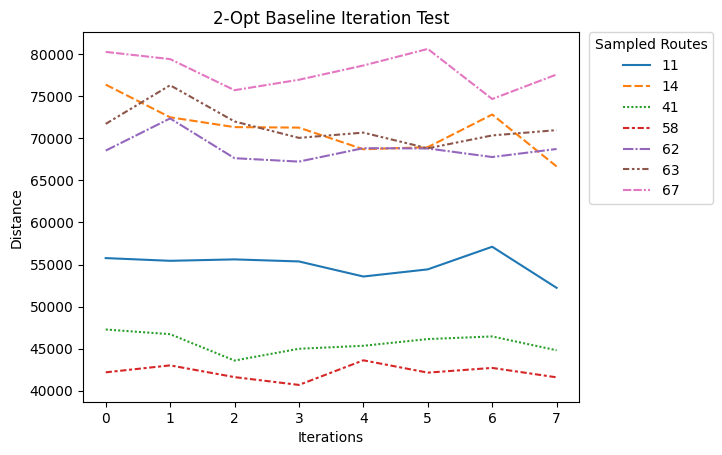

In [ ]:
#plot results
fig = sns.lineplot(data=iteration_test)
fig.set(xlabel='Iterations', ylabel='Distance', title ="2-Opt Baseline Iteration Test")
fig.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title = 'Sampled Routes')
plt.savefig(f"{image_path}Iteration_test.png")

### Cluster Test

In [ ]:
#iteration_test = []
cluster_iteration_test = pd.DataFrame()
#sampled_routes = []

#run 7 tests
for r in range(7):
  #generate random route number for testign
 route_number = random.randint(0, len(route_list))
 test_result = []
 test_route = route_list[route_number]

  #calculate a route clusers
 meanshift = meanShift_calculation(test_route)
 cluster_center_list = meanshift[1].tolist()
 cluster_center_list.append(depot_location)
 main_route_distance_matrix = coordinate_distance_matrix(cluster_center_list)
 #run 8 times for iteration test
 for i in tqdm(range(8)):

  #optimse main route
  #iterations increase each time through test
  main_route_optimised = route_optimiser(main_route_distance_matrix,cluster_center_list,i+1)

  #distance of main route
  main_route_distance = route_distance(main_route_optimised[1])
  test_result.append(main_route_distance)
# iteration_test.append(test_result)
 cluster_iteration_result = pd.DataFrame(test_result, columns =[route_number])
 cluster_iteration_test = pd.concat([cluster_iteration_result,cluster_iteration_test], axis = 1)

100%|██████████| 8/8 [00:50<00:00,  6.35s/it]


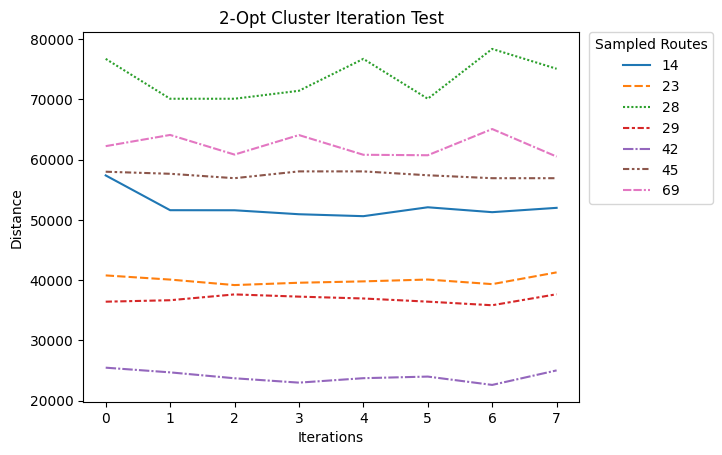

In [ ]:
#plot results and save
fig = sns.lineplot(data=cluster_iteration_test)
fig.set(xlabel='Iterations', ylabel='Distance', title ="2-Opt Cluster Iteration Test")
fig.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title = 'Sampled Routes')

plt.savefig(f"{image_path}Cluster_Iteration_test.png")

##Route Mode Test

###Baseline Route

In [ ]:
sampled_routes = []
distance_result = []
route_mode = []

#run for 7 iterations
for r in tqdm(range(7)):
  #random route number selected each time for testing
  route_number = random.randint(0, (len(route_list)-1))
  test_route = route_list[route_number]

  #calcualate distance matrxi
  test_route.append(depot_location)
  route_distance_matrix = coordinate_distance_matrix(test_route)
  #optimise the route
  route_optimised = route_optimiser(route_distance_matrix,test_route,5)

  #calculate car distance
  car_distance = route_distance_car(route_optimised[1])
  mode = 'Car'
  distance_result.append(car_distance)
  route_mode.append(mode)
  sampled_routes.append(route_number)

  #calculate bicycle distance
  bicycle_distance = route_distance(route_optimised[1])
  mode = 'Bicycle'
  distance_result.append(bicycle_distance)
  route_mode.append(mode)
  sampled_routes.append(route_number)


# iteration_test.append(test_result)
mode_test = pd.DataFrame({'Route': sampled_routes,'Distance':distance_result, 'Mode':route_mode})
mode_test

100%|██████████| 7/7 [05:49<00:00, 49.88s/it]


,Route,Distance,Mode
0,46,62397.0,Car
1,46,62123.0,Bicycle
2,58,60766.0,Car
3,58,43006.0,Bicycle
4,63,81079.0,Car
5,63,71626.0,Bicycle
6,15,93328.0,Car
7,15,83255.0,Bicycle
8,43,36641.0,Car
9,43,30015.0,Bicycle


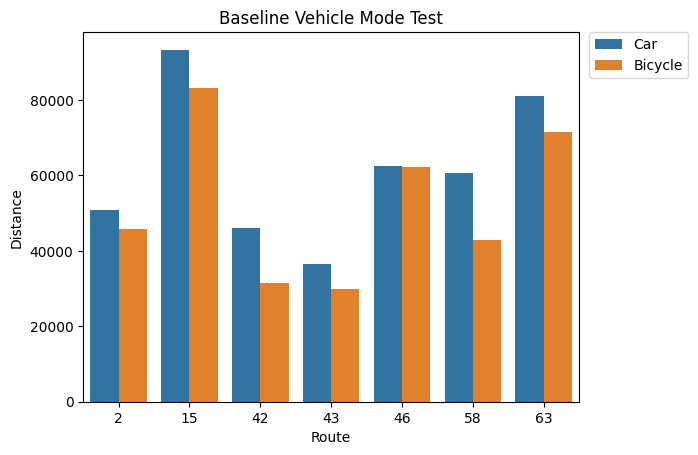

In [ ]:
#plot results and save
fig = sns.barplot(mode_test, x='Route', y='Distance', hue ='Mode')
fig.set(title = 'Baseline Vehicle Mode Test')
fig.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.savefig(f"{image_path}route_mode_test.png")

###Cluster Test

In [ ]:
sampled_routes = []
distance_result = []
route_mode = []

for r in tqdm(range(7)):
  route_number = random.randint(0, (len(route_list)-1))
 #print(route_number)
  test_route = route_list[route_number]

  meanshift = meanShift_calculation(test_route)
  cluster_center_list = meanshift[1].tolist()
  cluster_center_list.append(depot_location)
  main_route_distance_matrix = coordinate_distance_matrix(cluster_center_list)

  #optimse main route
  main_route_optimised = route_optimiser(main_route_distance_matrix,cluster_center_list,3)

  car_distance = route_distance_car(main_route_optimised[1])
  mode = 'Car'
  distance_result.append(car_distance)
  route_mode.append(mode)
  sampled_routes.append(route_number)


  bicycle_distance = route_distance(main_route_optimised[1])
  mode = 'Bicycle'
  distance_result.append(bicycle_distance)
  route_mode.append(mode)
  sampled_routes.append(route_number)


# iteration_test.append(test_result)
cluster_mode_test = pd.DataFrame({'Route': sampled_routes,'Distance':distance_result, 'Mode':route_mode})

100%|██████████| 7/7 [01:56<00:00, 16.68s/it]


In [ ]:
#view results
cluster_mode_test

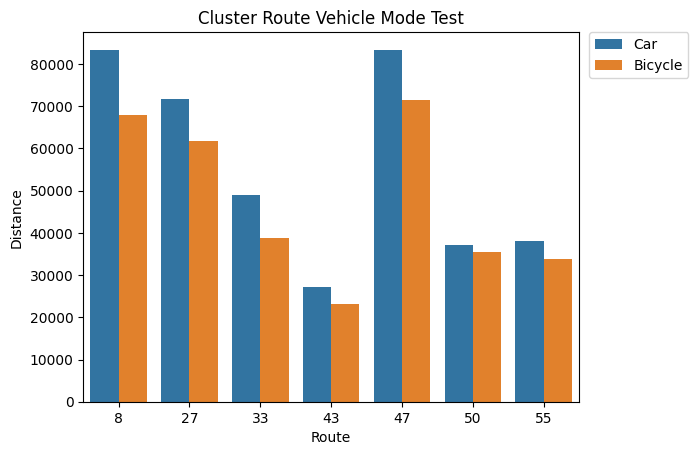

In [ ]:
#plot of results and save
fig = sns.barplot(cluster_mode_test, x='Route', y='Distance', hue ='Mode')
fig.set(title = 'Cluster Route Vehicle Mode Test')
fig.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.savefig(f"{image_path}cluster_mode_test.png")

In [ ]:
#export results
OptBaseline = results_path + "optBaseline.csv"
iteration_test.to_csv(OptBaseline)

OptCluster = results_path + "OptCluster.csv"
cluster_iteration_test.to_csv(OptCluster)

modeBaseline = results_path + "modeBaseline.csv"
mode_test.to_csv(modeBaseline)

modeCluster = results_path + "modeCluster.csv"
cluster_mode_test.to_csv(modeCluster)

# Baseline

##Run

In [ ]:
def baseline_calculate(route):



  start_time = time.perf_counter()
  #route.append(depot_location)
  #print(route)
  #full_route_optimised = route_optimisation(route, 5)
  #baseline = route_distance(full_route_optimised[1])
  route.append(depot_location)
  route_distance_matrix = coordinate_distance_matrix(route)
  #print(main_route_distance_matrix)
  #optimse main route
  route_optimised = route_optimiser(route_distance_matrix,route,5)
  #print(main_route_optimised)
  #distance of main route

  baseline = route_distance(route_optimised[1])

  end_time = time.perf_counter()

  compute_time = end_time - start_time

  route.remove(depot_location)

#  print(baseline)
 # print(locations)
  return baseline, route_optimised[1], compute_time


# MeanShift

##Run

In [ ]:
def bandwidth_calculation(coordinate_list):
  quant = max((len(coordinate_list))/900, 0.06)
  bandwidth = estimate_bandwidth(coordinate_list, quantile=quant, n_samples=len(coordinate_list))
  return bandwidth

In [ ]:
#check bandwidth values are valid - no 0.0 returned
for route in route_list:
  test = bandwidth_calculation(route)
  print(len(route))
  print(test)


47
0.00845645075346356
46
0.012106497264144178
41
0.009091747775465314
49
0.010497156585467925
36
0.008283812851162498
52
0.010931074501142142
46
0.007050112242288999
45
0.010271896555438384
45
0.011178231084804782
46
0.007833735991536549
48
0.008971509669197098
42
0.0071299087766817995
48
0.010353478437276213
53
0.01248627153394006
53
0.011245941223151118
53
0.010001614051749739
55
0.01183774572193264
43
0.009554211954476623
45
0.00949457815195797
50
0.00435488305892238
46
0.004355268957619621
46
0.0014707922811256914
55
0.005077336016417391
47
0.00150977883146592
55
0.007894521715183797
46
0.008545156352978337
53
0.006275349694568446
48
0.00777083045965173
48
0.0019038019829776054
53
0.008603467135038175
55
0.005744994692784761
46
0.009365312551991689
54
0.012738322091855579
46
0.002315714740648931
46
0.002786471789478885
49
0.006014127596055404
54
0.0038793404169928398
44
0.011899424612266852
52
0.003721658387854051
48
0.0035546594036050955
53
0.0029228983758744116
55
0.009257180434

In [ ]:
def meanShift_calculation(coordinate_list):


  est_bandwidth = bandwidth_calculation(coordinate_list)
  # Initialize Mean Shift clustering
  meanshift = MeanShift(bandwidth=est_bandwidth, bin_seeding=True)

  # Fit the data to the Mean Shift model
  meanshift.fit(coordinate_list)

  # Get cluster labels and cluster centers
  labels = meanshift.labels_
  cluster_centers = meanshift.cluster_centers_

  return labels, cluster_centers
#print("Cluster Labels:", labels)
#print("number of clusters", np.unique(labels))
#print("Cluster Centers:", cluster_centers)


In [ ]:
def meanshift_operate(index, route):
  result_columns= ['Route ID','Total Distance', 'Number of Locations', 'Cluster total Distance','Cluster Distances','Number of Clusters','Number of MP Clusters','Number of points in MP Clusters','Compute Time','Route', 'Clusters Centers','Cluster Point Lists']
  route_id = index+1

  start_time = time.perf_counter()
  meanshift = meanShift_calculation(route)
  cluster_point_lists = cluster_points(meanshift,route)
  meanshift_total_distance = cluster_distance_calculator(route,cluster_point_lists[0])

  end_time = time.perf_counter()

  mapping = cluster_visualise(route_id, route, meanshift, 'MeanShift')

  compute_time = end_time - start_time

  data = pd.DataFrame([[route_id, meanshift_total_distance[0], len(route), meanshift_total_distance[1], meanshift_total_distance[4], len(cluster_point_lists[1]),meanshift_total_distance[2], meanshift_total_distance[3],compute_time,route, meanshift[1],cluster_point_lists[0]]], columns = result_columns)
  return data

##Testing

The following code is used as part of the development and testing process.

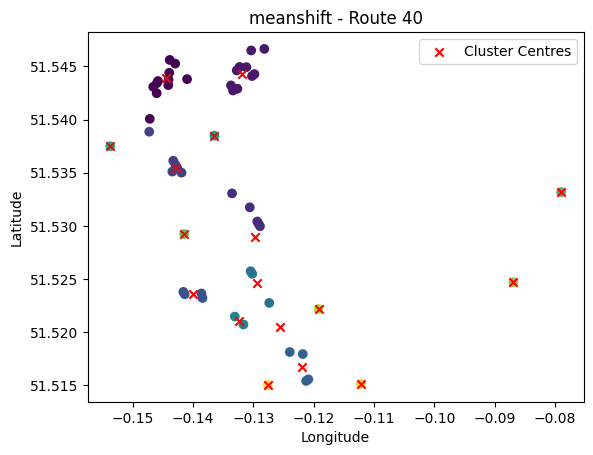

In [ ]:
mapping = cluster_visualise('40',test_route, meanshift, "meanshift")

In [ ]:
print(route_list[39])

[(51.522763, -0.127384117), (51.52072968, -0.131660906), (51.5154281, -0.121267261), (51.52357532, -0.141409661), (51.52550013, -0.130210441), (51.52997049, -0.128921518), (51.538858, -0.147301), (51.5181441, -0.1239802), (51.54006597, -0.147205288), (51.54273382, -0.133395853), (51.53041615, -0.1293792), (51.5317477, -0.130615546), (51.53305798, -0.133555562), (51.5442755, -0.1298436), (51.52322241, -0.138459821), (51.544398, -0.143976), (51.52471, -0.08688), (51.52365121, -0.138631587), (51.53510616, -0.143471356), (51.5214792, -0.1330939), (51.543623, -0.1458445), (51.54560735, -0.143895732), (51.54373439, -0.144091053), (51.54409171, -0.130249522), (51.53020041, -0.129154048), (51.54649953, -0.130376447), (51.54323788, -0.144140249), (51.51795409, -0.121821067), (51.54289888, -0.132664565), (51.53576874, -0.142963818), (51.54492802, -0.131178909), (51.54307267, -0.146630954), (51.54664158, -0.128198758), (51.54379773, -0.141023718), (51.53500673, -0.141942723), (51.54462048, -0.132

In [ ]:
meanshift =meanShift_calculation(route_list[39])
test_route.append(depot_location)

In [ ]:
cluster_point_lists = cluster_points(meanshift,route_list[39])
cluster_point_lists

([[(51.54373439, -0.144091053),
   (51.54342149, -0.146034906),
   (51.54560735, -0.143895732),
   (51.54379773, -0.141023718),
   (51.54323788, -0.144140249),
   (51.54525948, -0.142993916),
   (51.54247469, -0.146061245),
   (51.54307267, -0.146630954),
   (51.543623, -0.1458445),
   (51.544398, -0.143976)],
  [(51.54289888, -0.132664565),
   (51.54494868, -0.132311776),
   (51.54462048, -0.132780772),
   (51.54664158, -0.128198758),
   (51.54409171, -0.130249522),
   (51.54321255, -0.133728318),
   (51.54649953, -0.130376447),
   (51.54492802, -0.131178909),
   (51.54273382, -0.133395853),
   (51.5442755, -0.1298436)],
  [(51.53613382, -0.143308569),
   (51.53510616, -0.143471356),
   (51.5353758, -0.142597704),
   (51.53576874, -0.142963818),
   (51.53500673, -0.141942723)],
  [(51.53318, -0.07896),
   (51.53318, -0.07896),
   (51.53318, -0.07896),
   (51.53318, -0.07896),
   (51.53318, -0.07896)],
  [(51.5317477, -0.130615546),
   (51.53020041, -0.129154048),
   (51.53041615, -0.1

In [ ]:
for route in route_list:
 print(len(route))

27
24
21
25
17
26
24
24
27
22
24
23
24
20
25
27
22
24
23
27
23
23
24
23
27
27
27
24
26
27
26
23
24
27
23
23
23
25
23
27
23
24
27
28
25
27
26
26
25
27
27
24
26
23
27
27
26
23
26
25
27
22
26
27
24
25
25
26
22
23
26
22
24


In [ ]:
meanShift_total_distance = cluster_distance_calculator(route_list[0],cluster_point_lists)
meanShift_total_distance

In [ ]:
Testing = meanShift_calculation(route_list[39])
print(Testing[0])
cluster_test = cluster_points(Testing, route_list[39])

[ 0  7  4  6  5  3  4  4  0 15  1  0  9  8  8  5  1  1  5  3  3  5 14  6
  7  0  1  0  3  1  0  1 18  4 11 13 16  6  6  2  0 12  9  1  0  1 10  0
  3 17  0  1  1  2  2  2  2  2]


In [ ]:
clusterlist = meanshift[1].tolist()
routing = route_optimisation(clusterlist)
routing[1]

In [ ]:
meanshift_labels = np.unique(meanshift[0])
cluster_point_lists = [[] for x in range(len(meanshift_labels))]

for label in meanshift_labels:

 # print("step1")
   for i in range(len(meanshift[0])):
  #  print("step2")
     if meanshift[0][i] == label:
   #     print("step3")
        cluster_point_lists[label].append(addresslist[i])
cluster_point_lists

In [ ]:
clustertest = route_optimisation(cluster_point_lists[0])
cluster_response = route_calculation(clustertest[1])
x = create_map(cluster_response,clustertest[1])
x

In [ ]:
o = create_cluster_map(responsesclust, test_optimise[1], cluster_point_lists)
o

In [ ]:
labels_unique = np.unique(labels)
labels_unique.tolist()

In [ ]:
cluster_center1 =[]
for i in range(len(meanshift.cluster_centers_)):
  rodeo = meanshift.cluster_centers_[i]
  rodeo = tuple(rodeo)
 # print(rodeo)
  cluster_center1.append(rodeo)
  #print(cluster_centers[i])
cluster_center1

In [ ]:
t = create_cluster_map(cluster_point_lists, optimisedroute)
t

WARD HEIRARCHICAL

# WARD HEIRARCHICAL



## Run



In [ ]:
def ward_h_calculation(route):

  locations = np.array(route)
  distMatrix = coordinate_distance_matrix(route)
  threshold = 0.0035

  ward = AgglomerativeClustering(n_clusters = None,  linkage="ward" , distance_threshold = threshold, connectivity=distMatrix)
  ward.fit(locations)

  #extract label details
  labels = ward.labels_
  ward_unique_labels = np.unique(labels)

#calulate center points
  cluster_center_points =[]
  for label in ward_unique_labels:
    cluster_centers_list = locations[labels == label]

    #find mean point of lcoations and convert to proper format
    cluster_center = np.mean(cluster_centers_list, axis=0)
    cluster_center = tuple(cluster_center)

    cluster_center_points.append(cluster_center)
    cluster_centers = np.array(cluster_center_points)
  cluster_center_points

  return labels, cluster_centers

In [ ]:
def ward_h_operate(index, route):
  result_columns= ['Route ID','Total Distance', 'Number of Locations', 'Cluster total Distance','Cluster Distances','Number of Clusters','Number of MP Clusters','Number of points in MP Clusters','Compute Time','Route', 'Clusters Centers','Cluster Point Lists']
  route_id = index+1

  start_time = time.perf_counter()
  ward_h = ward_h_calculation(route)
  cluster_point_lists = cluster_points(ward_h,route)

  ward_h_total_distance = cluster_distance_calculator(route,cluster_point_lists[0])

  end_time = time.perf_counter()

  mapping = cluster_visualise(route_id, route, ward_h, 'Ward Hierarchical')

  compute_time = end_time - start_time

  data = pd.DataFrame([[route_id, ward_h_total_distance[0], len(route), ward_h_total_distance[1], ward_h_total_distance[4], len(cluster_point_lists[1]),ward_h_total_distance[2], ward_h_total_distance[3],compute_time,route, ward_h[1],cluster_point_lists[0]]], columns = result_columns)
  return data

##Testing

The following code is used as part of the development and testing process.

In [ ]:
#for route in tqdm(route_list):
  #ward_h_operate(route)

ward_h_operate(route_list[0])

In [ ]:
arraylist = np.array(route_list[6])
distMatrix = coordinate_distance_matrix(route_list[6])
threshold = 0.0038

ward = AgglomerativeClustering(n_clusters = None,  linkage="single" , distance_threshold = threshold, connectivity=distMatrix)
ward.fit(arraylist)



In [ ]:
test = cluster_points(ward, route_list[2])
test

In [ ]:
ward_total_distance = cluster_distance_calculator(ward_test[1],cluster_point_lists)


In [ ]:

# Get cluster labels and cluster centers
labels = ward.labels_
#cluster_centers = ward.cluster_center
ward_unique_labels = np.unique(labels)
print("Cluster Labels:", labels)
print("number of clusters", np.unique(labels))
#print("Cluster Centers:", cluster_centers)

In [ ]:
cluster_center_points =[]
for label in ward_unique_labels:
  cluster_centers_list = arraylist[labels == label]
  cluster_center = np.mean(cluster_centers_list, axis=0)
  cluster_center = tuple(cluster_center)
  #print("center: ", label, cluster_center.tolist())
  cluster_center_points.append(cluster_center)
cluster_center_points


In [ ]:
cluster_point_lists = [[] for x in range(len(np.unique(labels)))]

points_in_cluster = []
coordsincluster = []
for l in range(len(ward_unique_labels)):
 # print("step1")
  for i in range(len(labels)):
  #  print("step2")
    if labels[i] == l:
   #     print("step3")
      #  points_in_cluster[l].append(distMatrix.index[i])
        cluster_point_lists[l].append(addresslist[i])
       # print("Points in Cluster", cluster_to_print, ":", points_in_cluster)
  print(cluster_point_lists[l])

In [ ]:
m = cluster_visualise(route_list[1], ward_test)

In [ ]:
# Plot the data points
plt.scatter(arraylist[:,1], arraylist[:,0], c=labels, cmap='viridis')
plt.colorbar(label='Cluster')
plt.title('Ward H Clustering')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Plot the cluster centers
plt.scatter(np.array(cluster_center_points)[:, 1], np.array(cluster_center_points)[:, 0], marker='x', color='red', s=100, label='Cluster Centers')

plt.legend()
plt.show()


In [ ]:
ward_distMatrix = coordinate_distance_matrix(cluster_point_lists[10])
ward_distMatrix
#ward_optimised = route_optimiser(ward_distMatrix, cluster_point_lists[2],2)

In [ ]:
ward_routed = route_calculation(ward_optimised[0])

In [ ]:
ward_distance = route_distance(ward_optimised[1])
ward_distance

In [ ]:
w = create_map(ward_routed, ward_optimised[0])
w

In [ ]:
cluster_totals = 0
for i in range(len(cluster_point_lists)):
    cluster_distMatrix = cluster_optimise_prep(cluster_point_lists[i])
    print(len(cluster_point_lists[i]))
    if len(cluster_point_lists[i]) > 1:
     optimised = cluster_optimise(cluster_distMatrix, cluster_point_lists[i])
     intra_distance = route_distance(optimised[1])
     print("cluster: ", intra_distance)
     cluster_totals += intra_distance

 # total_calc_distance = cluster_center_distance + cluster_totals

 # distance_ratio = cluster_center_distance/cluster_total
cluster_totals

#**DBScan**

##Run

In [ ]:
def dbscan_calculation(route):
  locations = np.array(route)
  distMatrix = coordinate_distance_matrix(route)
  eps =0.0035
  min_samples =1
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric="precomputed")
  dbscan.fit(distMatrix)

  labels = dbscan.labels_
  dbscan_unique = np.unique(labels)

  cluster_center_points =[]
  #process each cluster label
  for label in dbscan_unique:
    #create list of cluster locations
    cluster_centers_list = locations[labels == label]
    #average  of all locations
    cluster_center = np.mean(cluster_centers_list, axis=0)
    #convert to correct format
    cluster_center = tuple(cluster_center)
    #add to cluster list
    cluster_center_points.append(cluster_center)
  cluster_centers = np.array(cluster_center_points)
  cluster_centers


  return labels, cluster_centers

In [ ]:
def dbscan_operate(index, route):
  result_columns= ['Route ID','Total Distance', 'Number of Locations', 'Cluster total Distance','Cluster Distances','Number of Clusters','Number of MP Clusters','Number of points in MP Clusters','Compute Time','Route', 'Clusters Centers','Cluster Point Lists']
  route_id = index+1

  start_time = time.perf_counter()

  dbscan = dbscan_calculation(route)
  cluster_point_lists = cluster_points(dbscan,route)
  dbscan_total_distance = cluster_distance_calculator(route,cluster_point_lists[0])

  end_time = time.perf_counter()

  mapping = cluster_visualise(route_id, route, dbscan, 'DBSCAN')

  compute_time = end_time - start_time

  data = pd.DataFrame([[route_id, dbscan_total_distance[0], len(route), dbscan_total_distance[1], dbscan_total_distance[4], len(cluster_point_lists[1]),dbscan_total_distance[2], dbscan_total_distance[3],compute_time,route, dbscan[1],cluster_point_lists[0]]], columns = result_columns)
  return data

##Testing

The following code is used as part of the development and testing process.

In [ ]:
#Testing
dbscan_calculation(route_list[19])

(array([ 0,  1,  2,  3,  4,  5,  0,  4,  6,  7,  8,  8,  9,  0, 10, 11, 12,
         4,  8, 13, 14,  4, 13,  2, 13,  2,  8, 15, 13, 16,  4, 13,  4, 17,
         8, 18,  4,  4, 13,  2, 17,  0,  6,  0, 13, 13, 13, 13, 19, 17]),
 array([[51.55050193, -0.16797422],
        [51.53789533, -0.17077063],
        [51.54564772, -0.17212525],
        [51.49459   , -0.13267   ],
        [51.55392968, -0.18815779],
        [51.555582  , -0.168521  ],
        [51.54580617, -0.18871467],
        [51.54184912, -0.17862877],
        [51.49734766, -0.13714029],
        [51.49777   , -0.14312   ],
        [51.53917849, -0.1907187 ],
        [51.55191709, -0.20319217],
        [51.55164317, -0.20767118],
        [51.54554828, -0.19743027],
        [51.56838883, -0.18281601],
        [51.55102513, -0.1958    ],
        [51.55261564, -0.1785449 ],
        [51.55778405, -0.19428787],
        [51.53731191, -0.18752295],
        [51.49257   , -0.13963   ]]))

In [ ]:
eps =0.005
min_samples =2
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric="precomputed")
dbscan.fit(distMatrix)

In [ ]:
#Test label conversion
dbscan_unique_labels = np.unique(dbscan.labels_)

cluster_point_lists = [[] for x in range(len(dbscan_unique_labels))]

points_in_cluster = []
coordsincluster = []
for l in range(len(dbscan_unique_labels)):
 # print("step1")
  for i in range(len(labels)):
  #  print("step2")
    if labels[i] == l:
   #     print("step3")
      #  points_in_cluster[l].append(distMatrix.index[i])
        cluster_point_lists[l].append(addresslist[i])
       # print("Points in Cluster", cluster_to_print, ":", points_in_cluster)
  print(cluster_point_lists[l])

In [ ]:
cluster_marker_list = []
print(dbscan_unique_labels)
for label in dbscan_unique_labels:
  cluster_marker = arraylist[dbscan.labels_ == label]
  cluster_marker_list.append(cluster_marker)
  print(label, cluster_marker)

In [ ]:
dbscan_distMatrix = coordinate_distance_matrix(cluster_center_markers)


dbscan_optimised = route_optimise(dbscan_distMatrix, cluster_center_markers)

In [ ]:
dbscan_routed = route_calculation(dbscan_optimised[1])

In [ ]:
#test distance calculation on data
dbscan_total_distance = cluster_distance_calculator(cluster_center_markers,cluster_point_lists)

  0%|          | 0/72 [00:00<?, ?it/s]

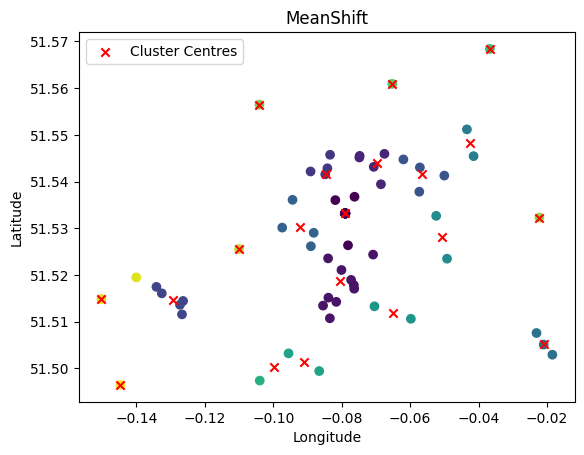

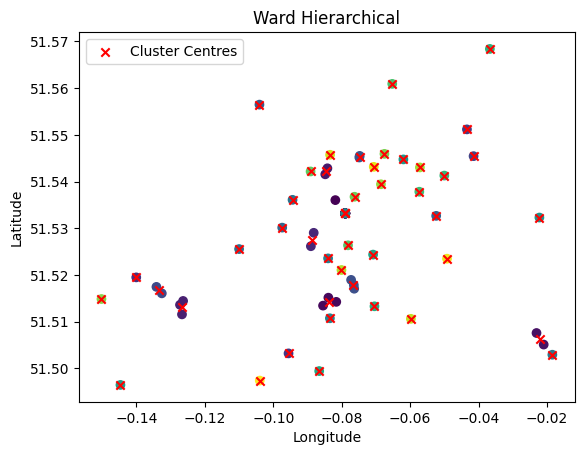

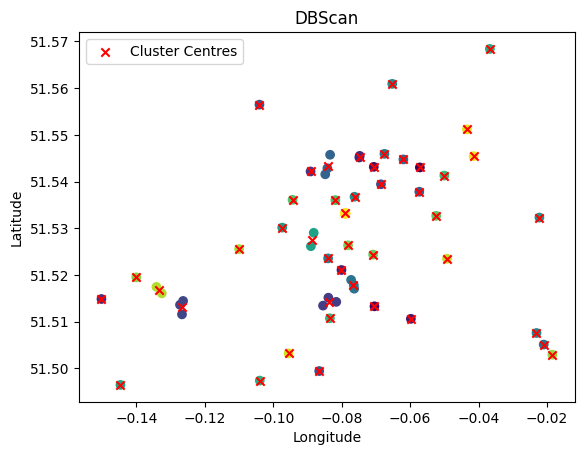

  1%|▏         | 1/72 [02:49<3:21:07, 169.97s/it]

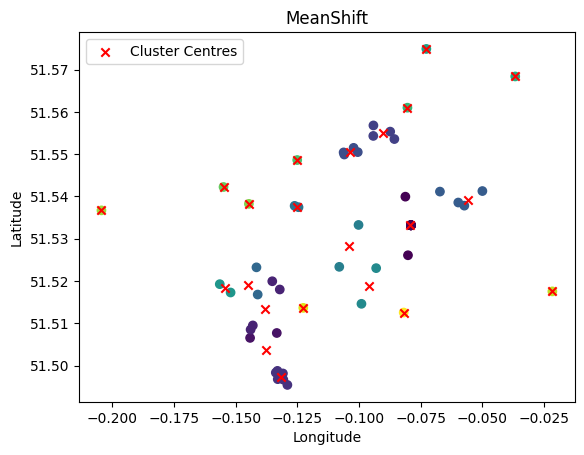

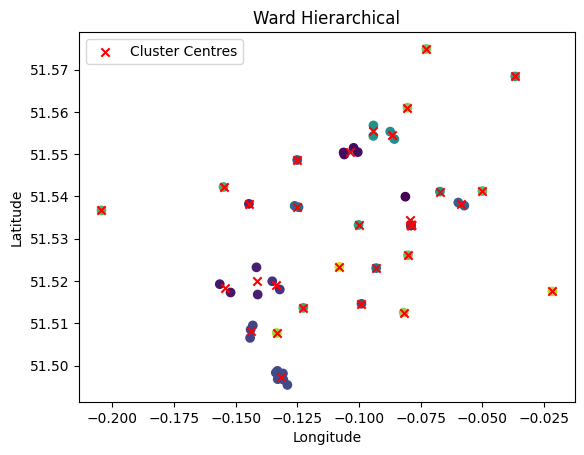

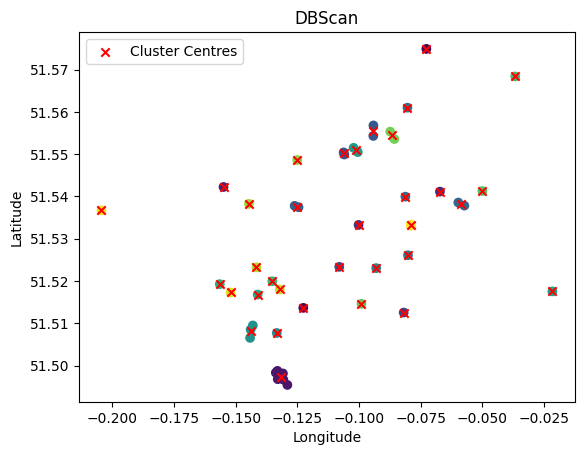

  3%|▎         | 2/72 [04:53<2:46:10, 142.43s/it]

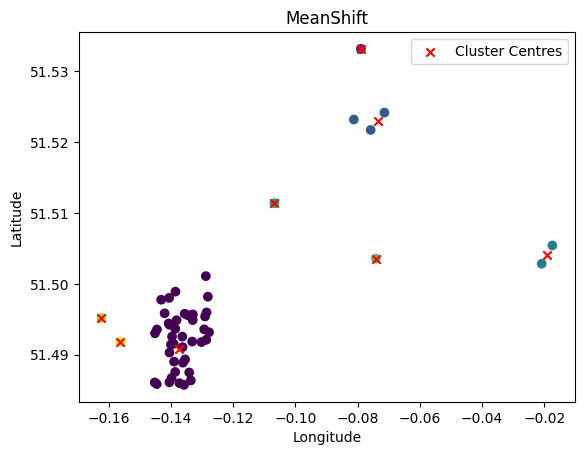

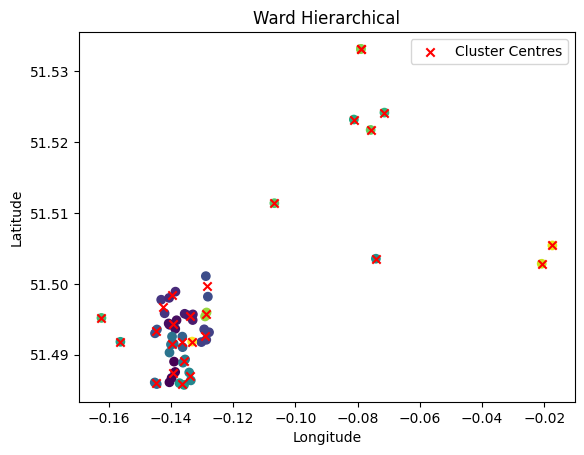

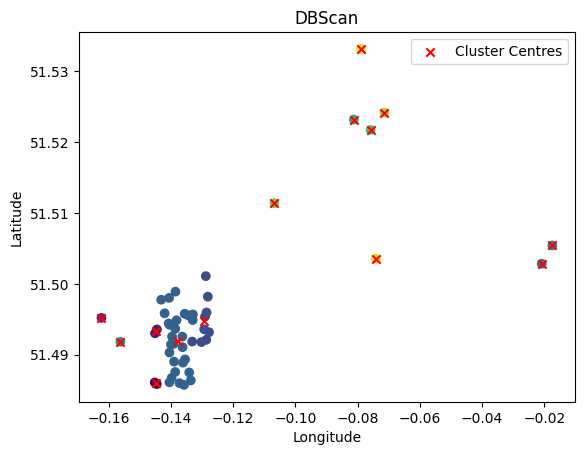

  4%|▍         | 3/72 [06:55<2:33:03, 133.10s/it]

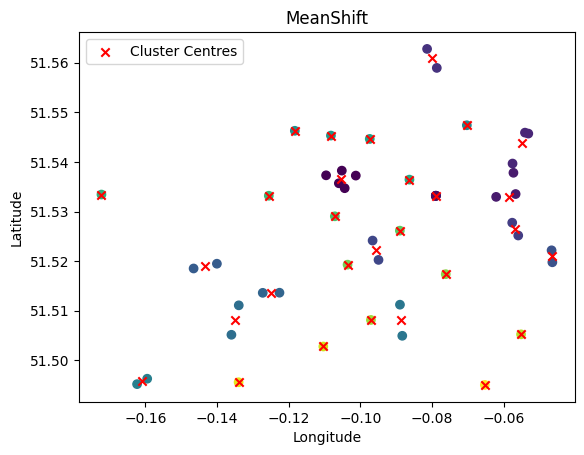

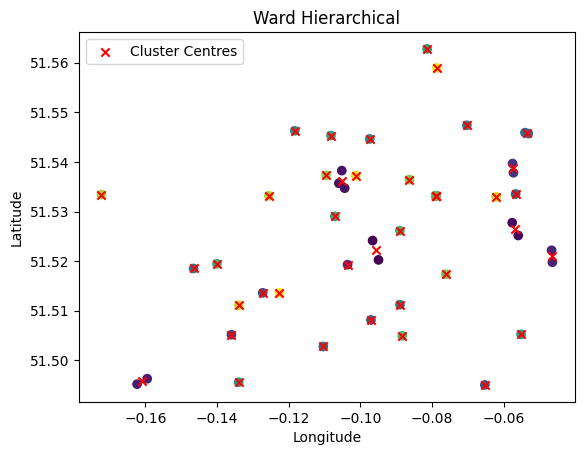

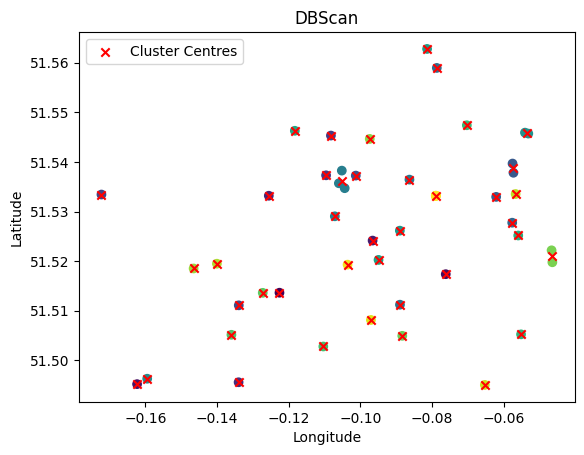

  6%|▌         | 4/72 [08:24<2:11:22, 115.92s/it]

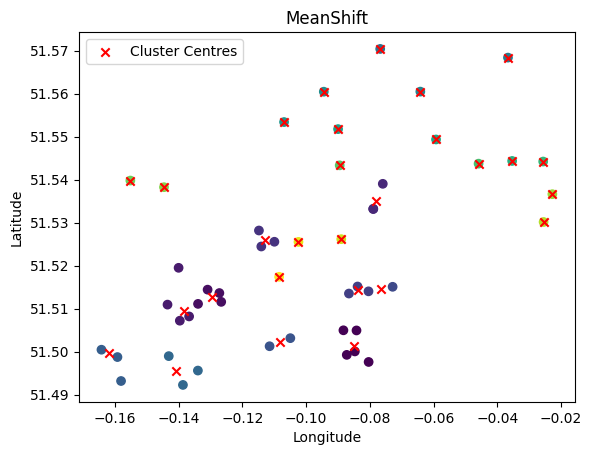

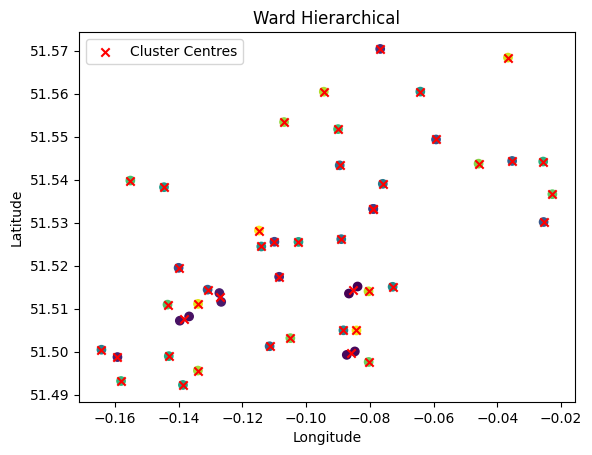

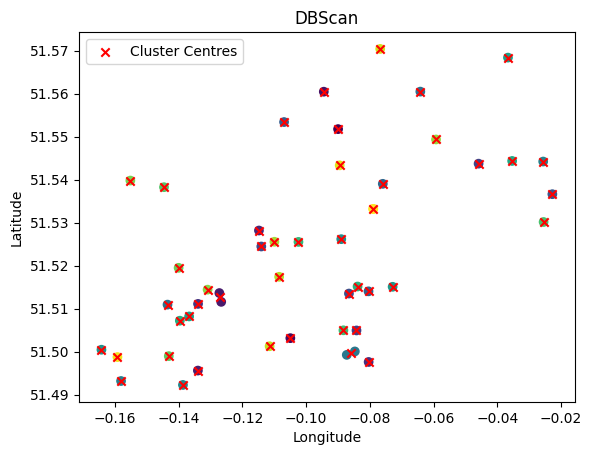

  7%|▋         | 5/72 [09:51<1:57:47, 105.49s/it]

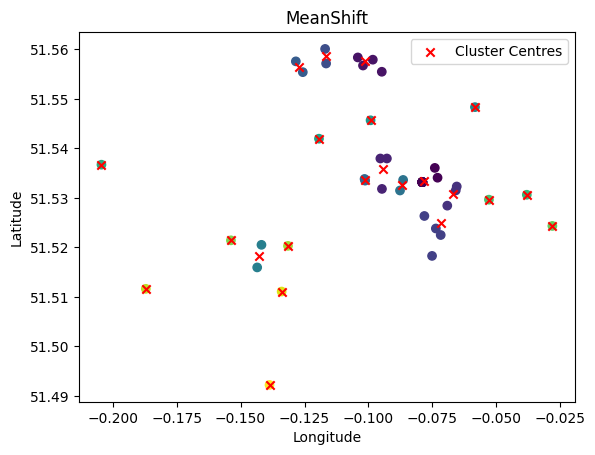

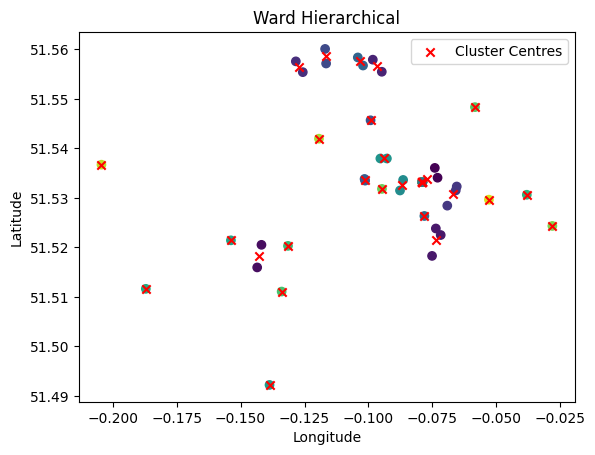

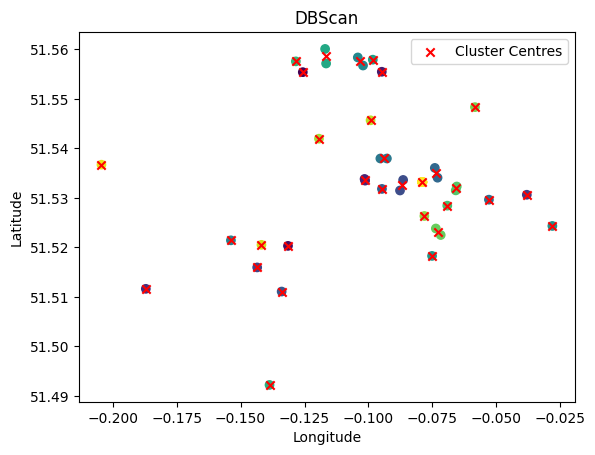

  8%|▊         | 6/72 [11:32<1:54:25, 104.02s/it]

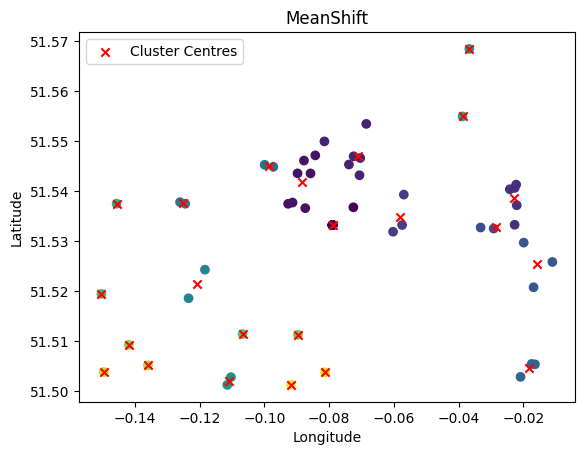

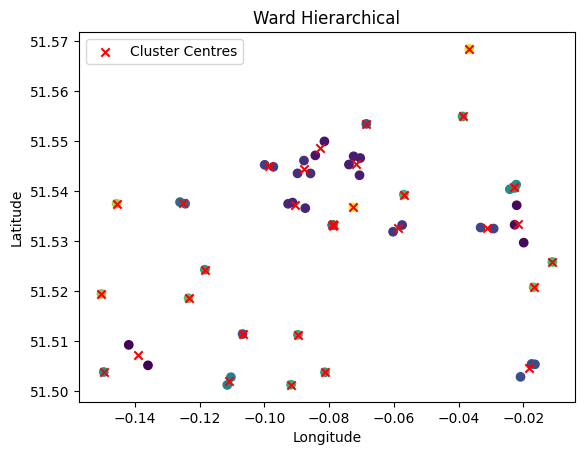

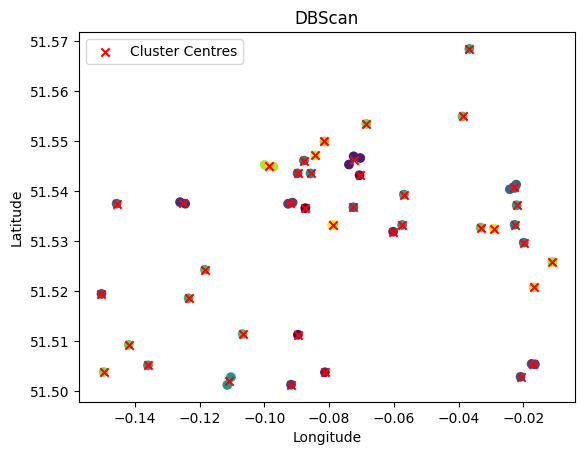

 10%|▉         | 7/72 [13:33<1:58:38, 109.51s/it]

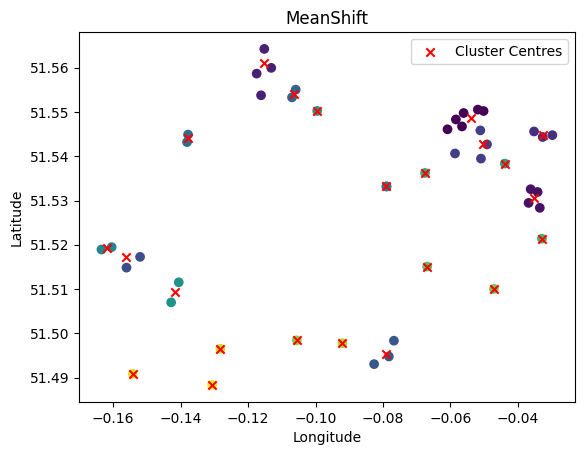

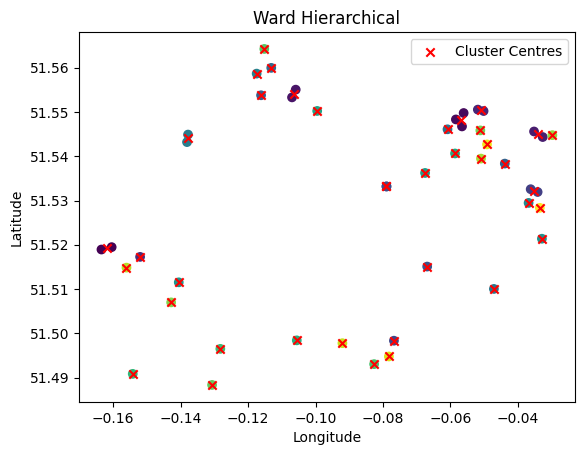

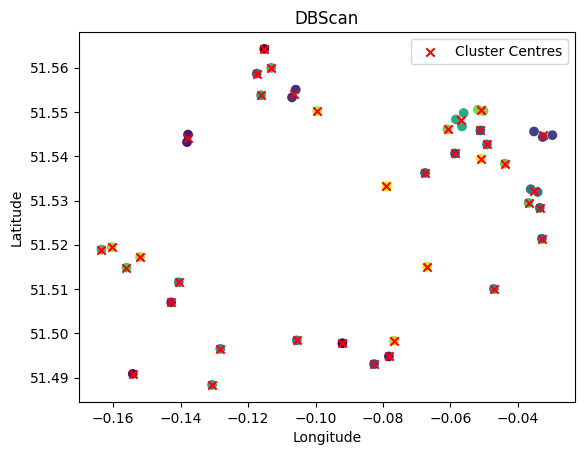

 11%|█         | 8/72 [15:03<1:50:14, 103.36s/it]

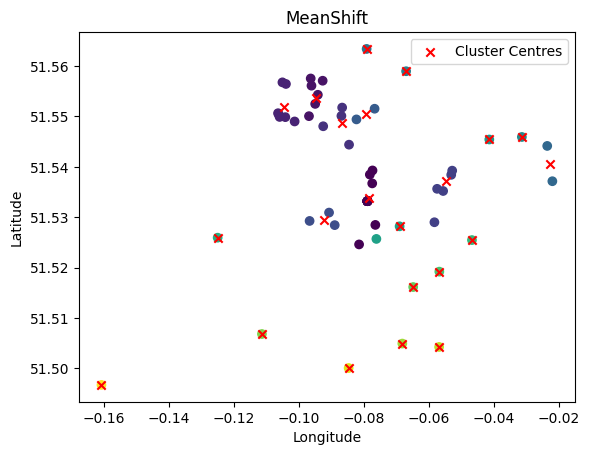

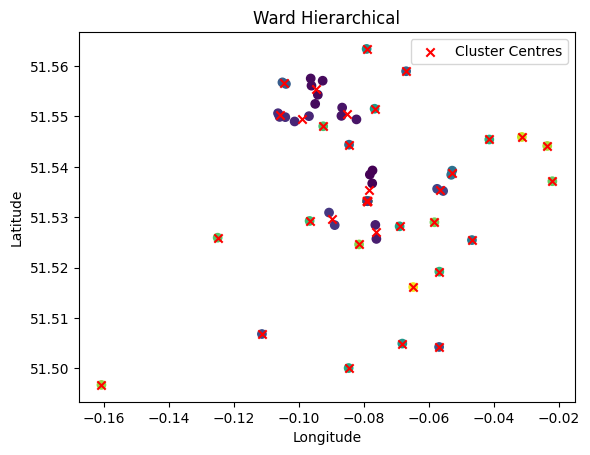

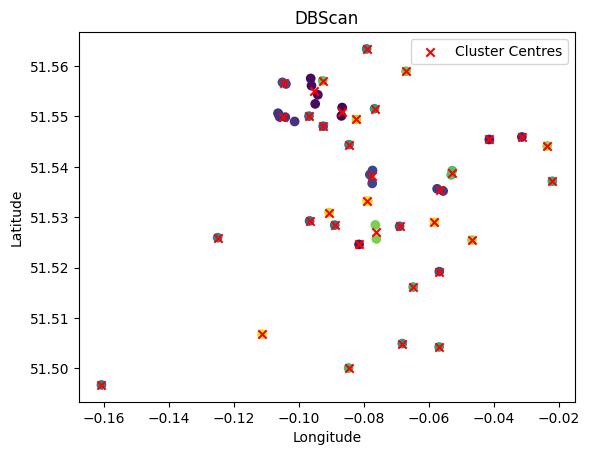

 12%|█▎        | 9/72 [17:09<1:55:42, 110.19s/it]

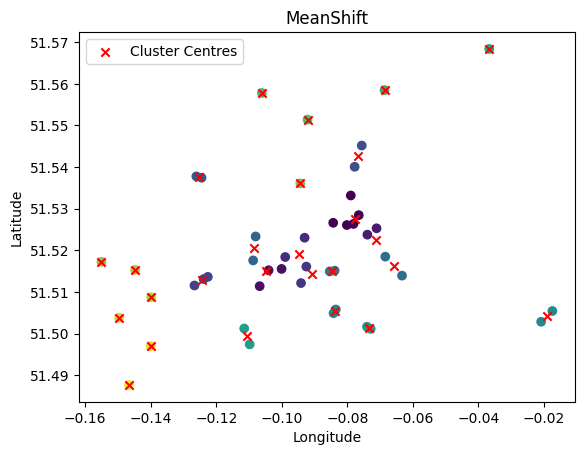

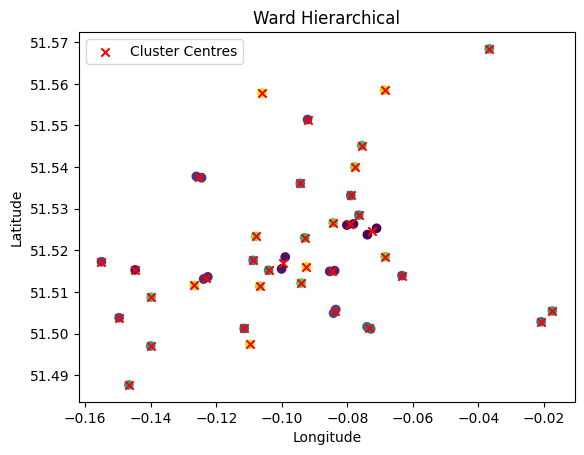

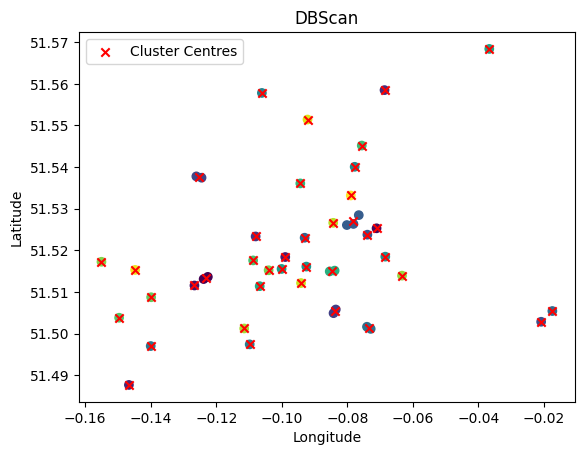

 14%|█▍        | 10/72 [18:32<1:45:17, 101.90s/it]

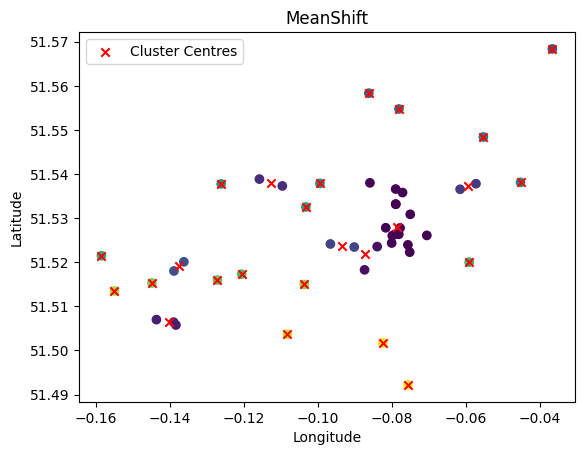

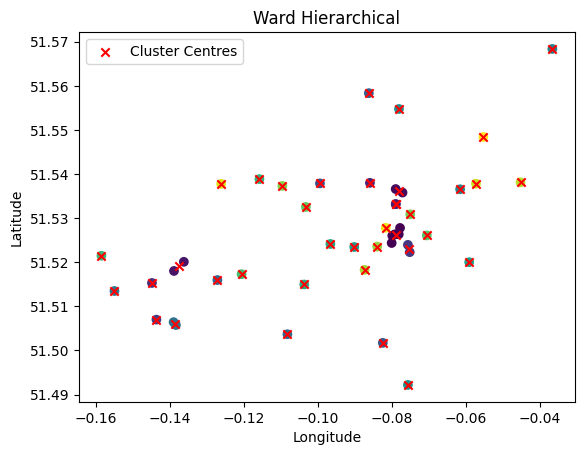

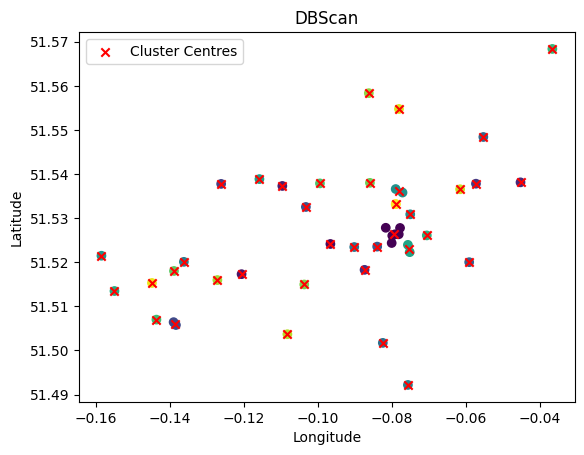

 15%|█▌        | 11/72 [20:00<1:39:12, 97.58s/it] 

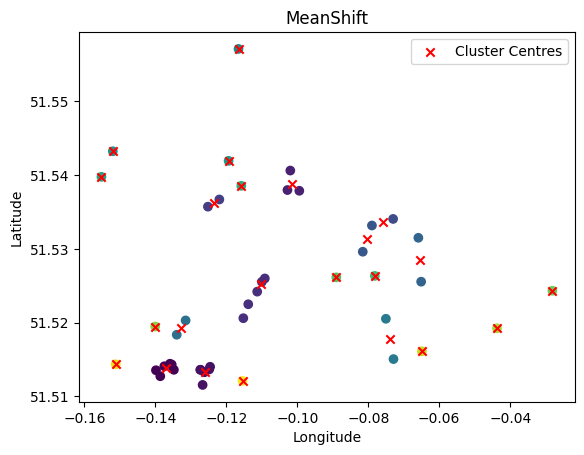

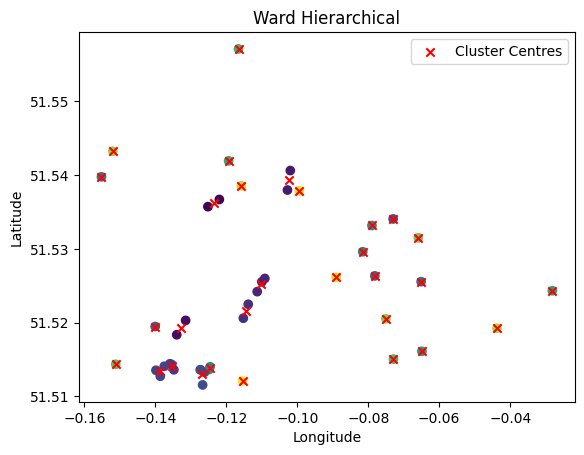

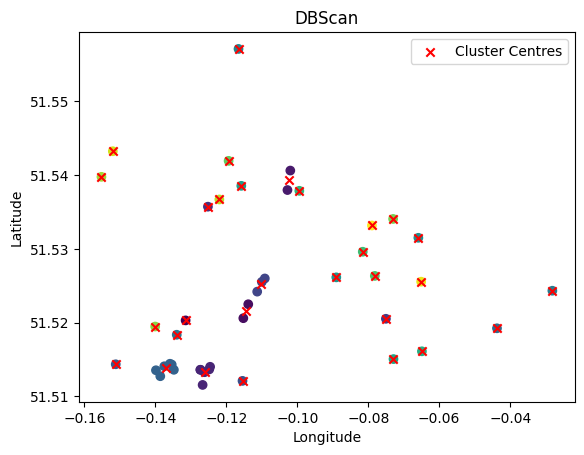

 17%|█▋        | 12/72 [21:26<1:34:01, 94.02s/it]

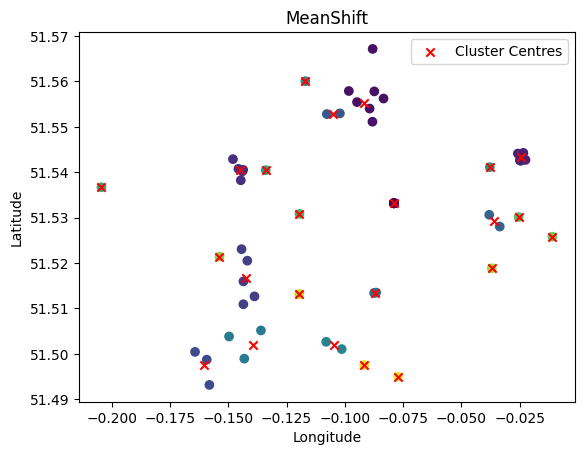

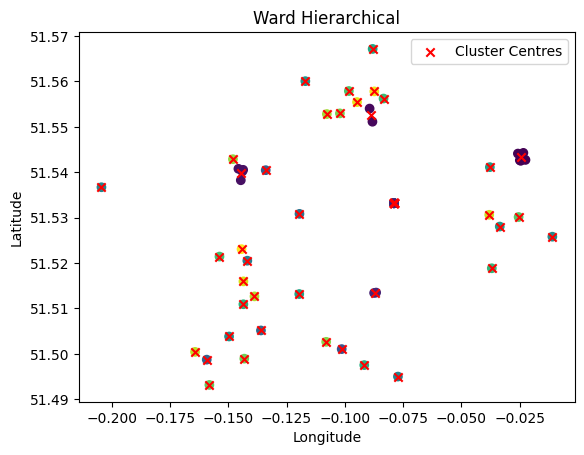

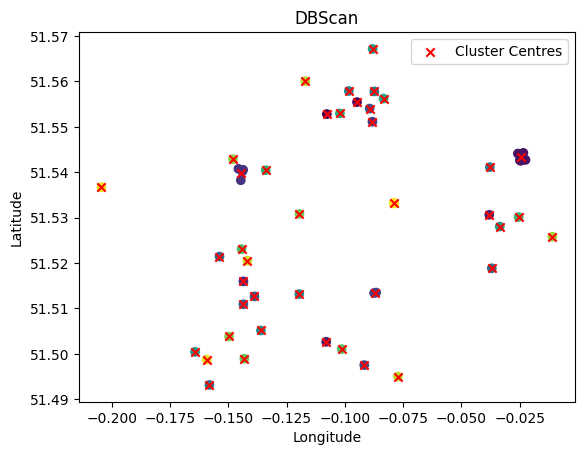

 18%|█▊        | 13/72 [23:25<1:40:09, 101.86s/it]

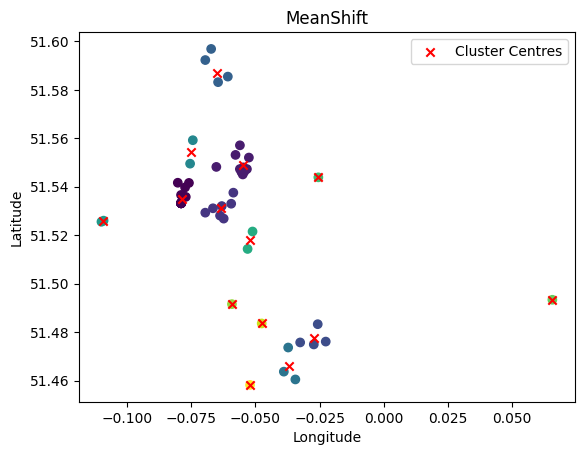

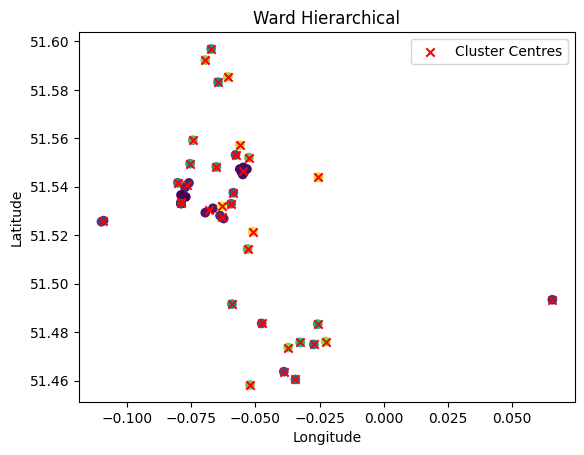

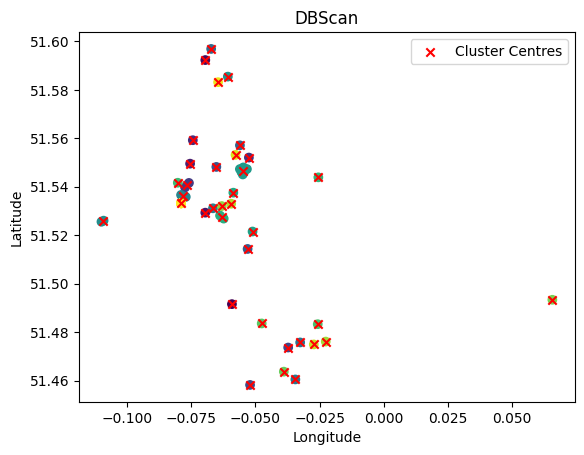

 19%|█▉        | 14/72 [25:24<1:43:28, 107.04s/it]

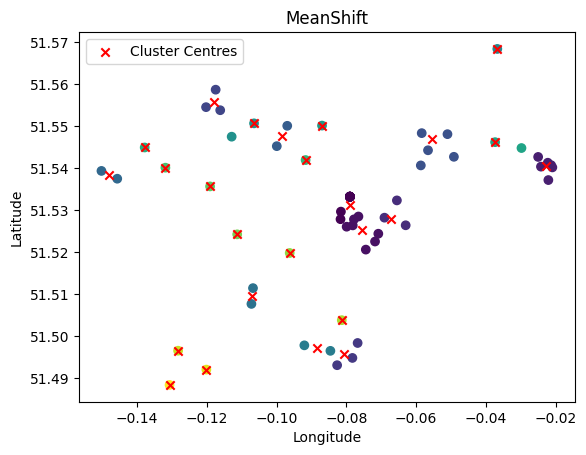

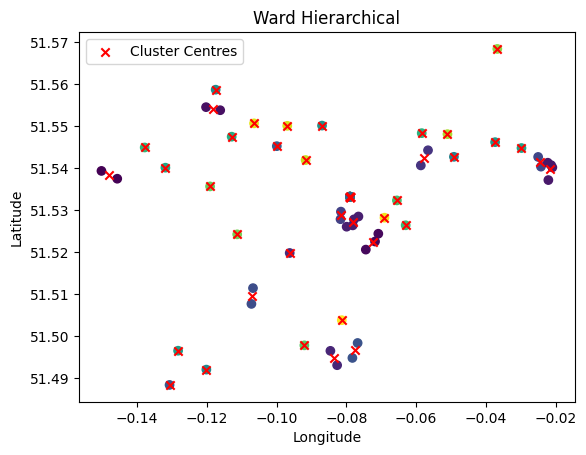

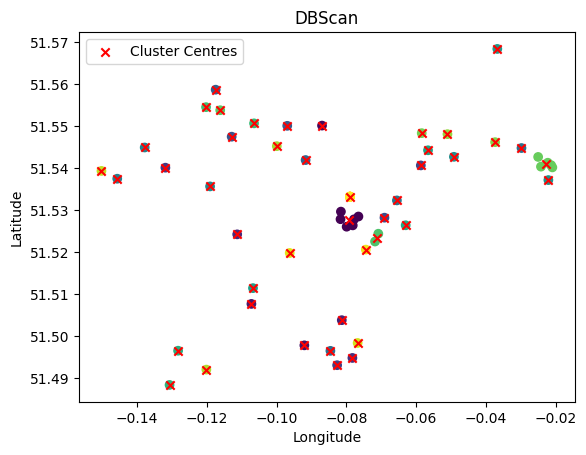

 21%|██        | 15/72 [27:35<1:48:26, 114.15s/it]

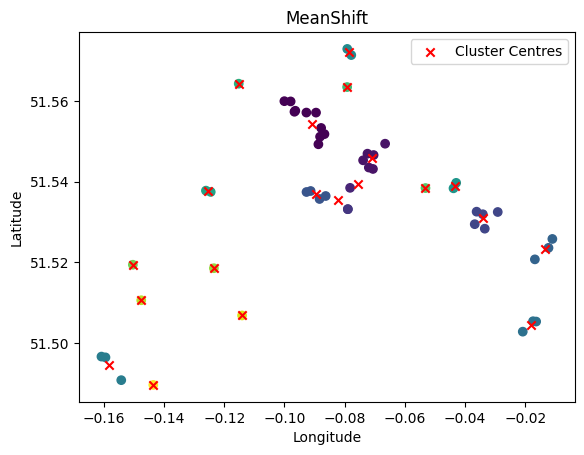

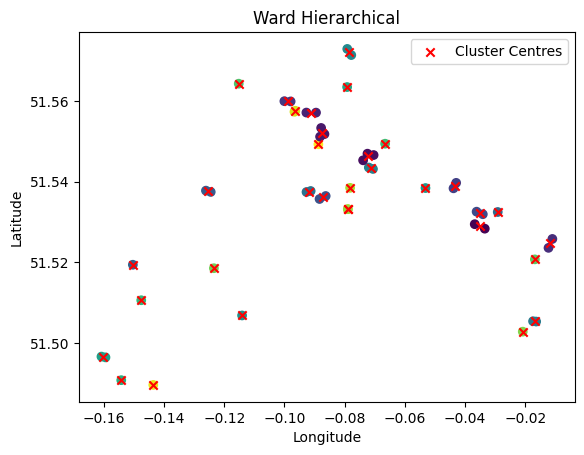

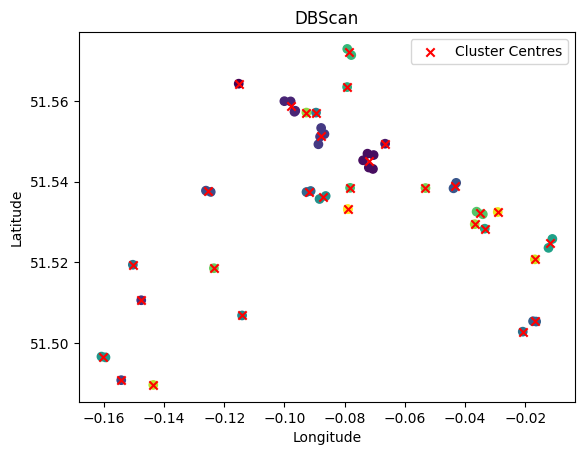

 22%|██▏       | 16/72 [29:23<1:44:42, 112.18s/it]

In [ ]:
#Run all clustering on all 3 algorithms - Only for when all work 100% without failure
for route in tqdm(route_list):
  meanshift_operate(route)
  ward_h_operate(route)
  dbscan_operate(route)

# Result Processing

##Operation

In [ ]:
baseline_columns = (['Baseline Distance'], ['Locations'], ['Compute Time'],['Route]'])
baseline_results = pd.DataFrame()

for route in tqdm(route_list):

  locations = len(route)

  baseline = baseline_calculate(route)

  data = pd.DataFrame([[baseline[0],locations, baseline[2], baseline[1]]], columns= baseline_columns)
  baseline_results = pd.concat([baseline_results,data], ignore_index=True)

baseline_table = results_path + "Baseline_results.csv"
baseline_results.to_csv(baseline_table)

100%|██████████| 70/70 [29:48<00:00, 25.55s/it]


  0%|          | 0/70 [00:00<?, ?it/s]

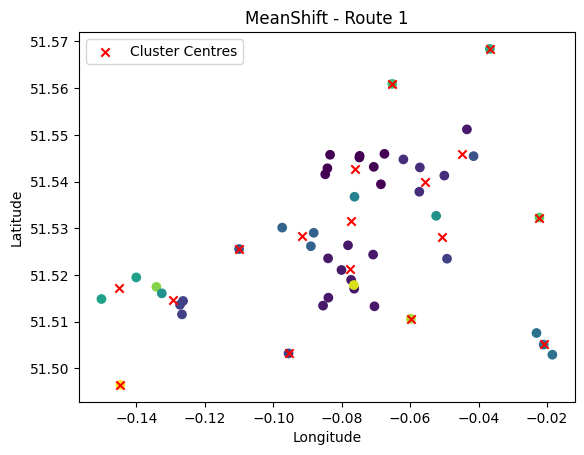

  1%|▏         | 1/70 [00:46<53:35, 46.60s/it]

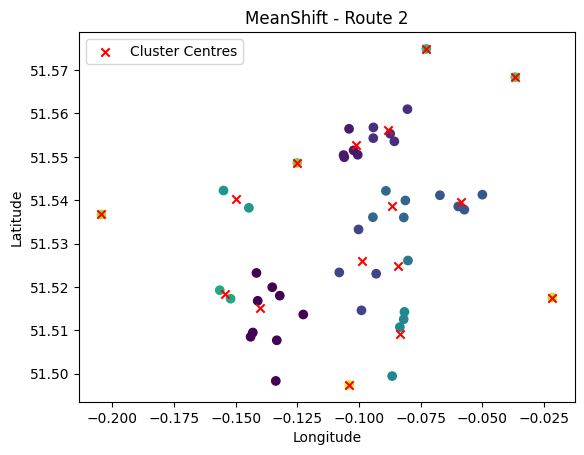

  3%|▎         | 2/70 [01:32<52:26, 46.27s/it]

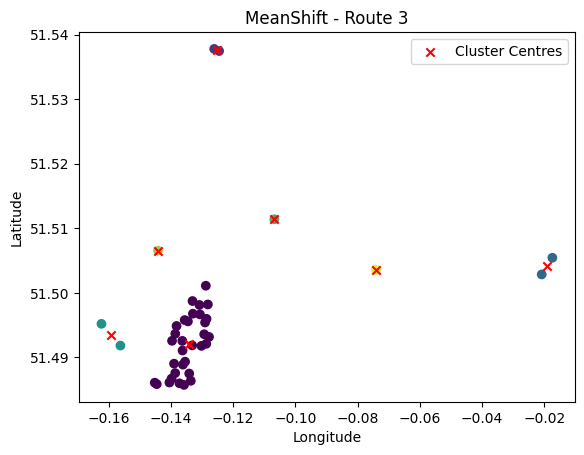

  4%|▍         | 3/70 [02:13<49:02, 43.92s/it]

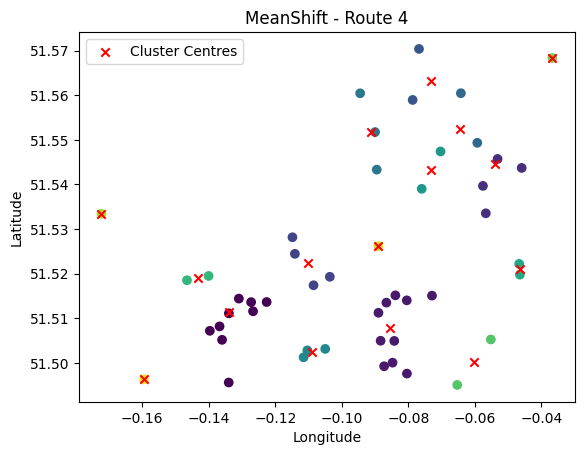

  6%|▌         | 4/70 [03:00<49:42, 45.18s/it]

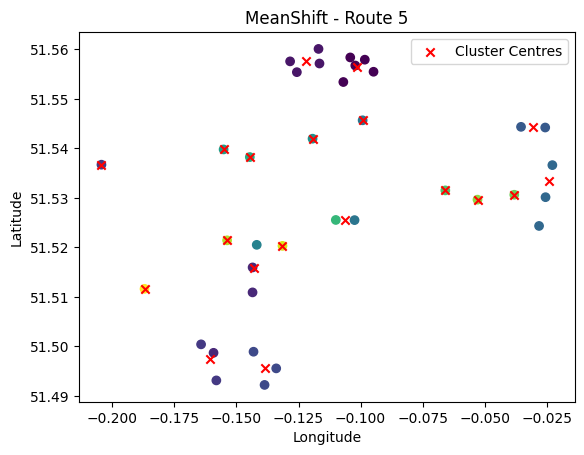

  7%|▋         | 5/70 [03:31<43:07, 39.80s/it]

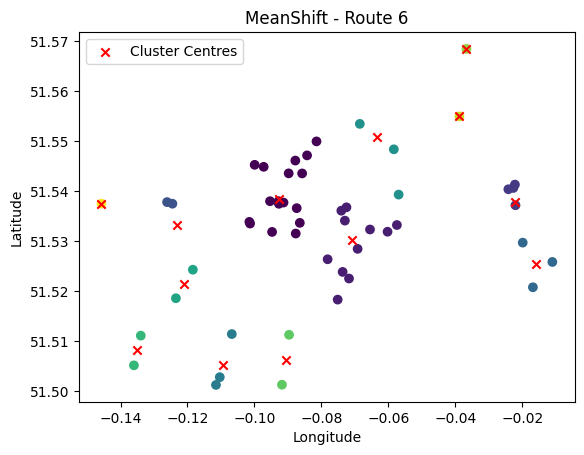

  9%|▊         | 6/70 [04:18<45:08, 42.32s/it]

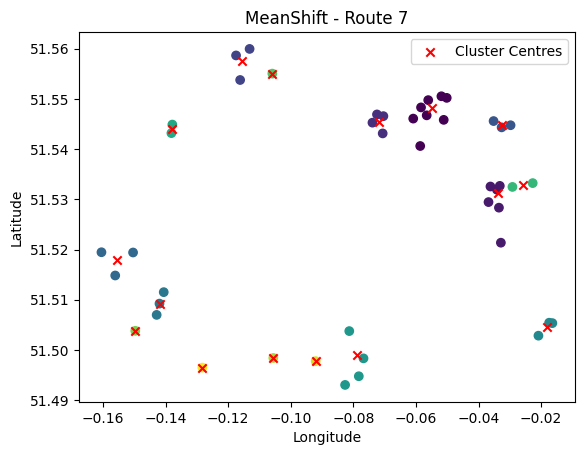

 10%|█         | 7/70 [04:57<43:20, 41.28s/it]

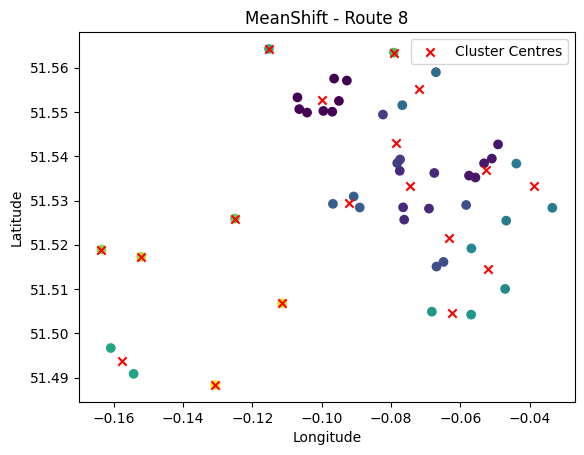

 11%|█▏        | 8/70 [05:32<40:38, 39.33s/it]

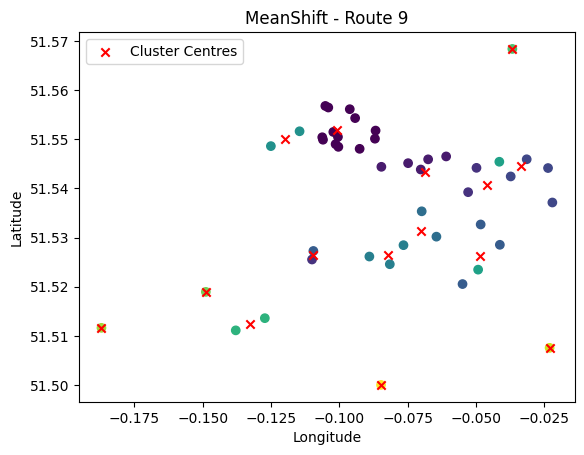

 13%|█▎        | 9/70 [06:10<39:30, 38.87s/it]

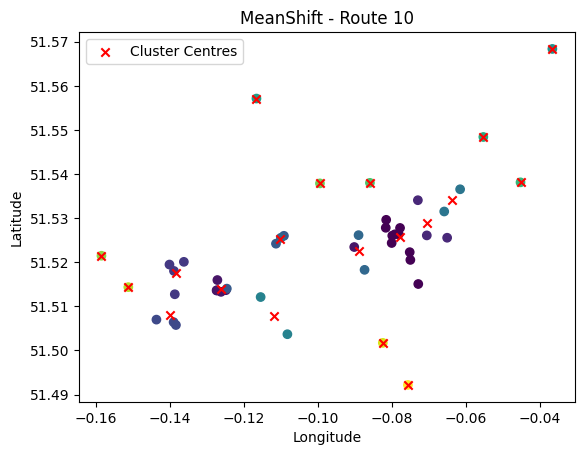

 14%|█▍        | 10/70 [06:46<37:51, 37.86s/it]

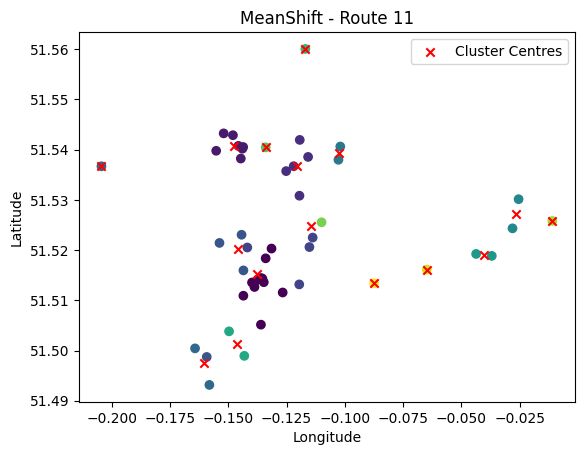

 16%|█▌        | 11/70 [07:24<37:16, 37.91s/it]

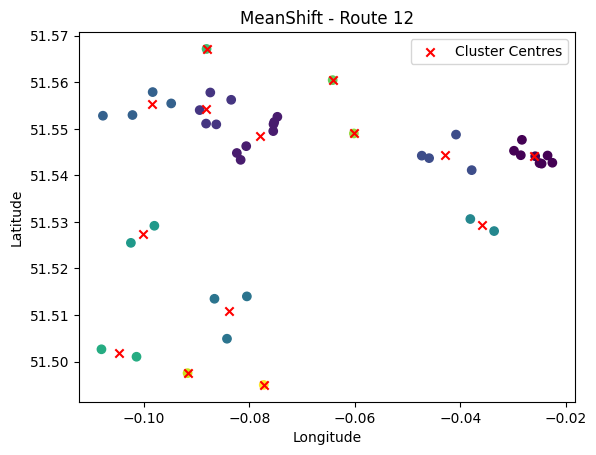

 17%|█▋        | 12/70 [07:59<35:58, 37.21s/it]

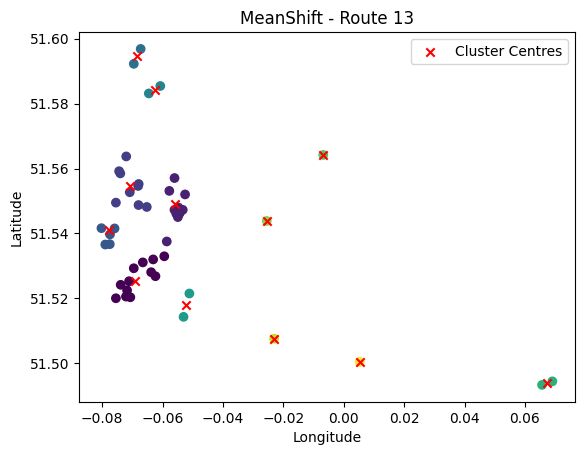

 19%|█▊        | 13/70 [08:41<36:38, 38.57s/it]

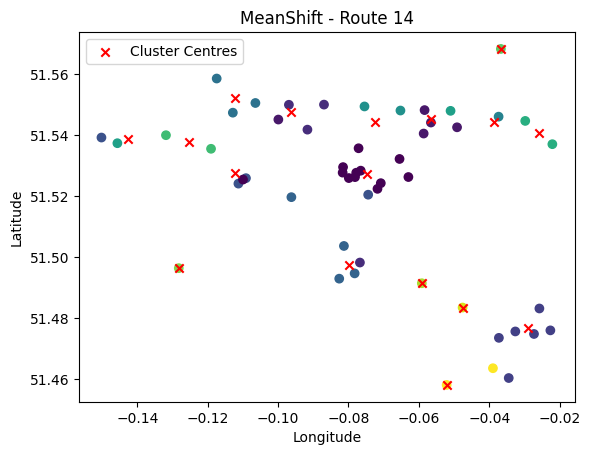

 20%|██        | 14/70 [09:27<38:08, 40.86s/it]

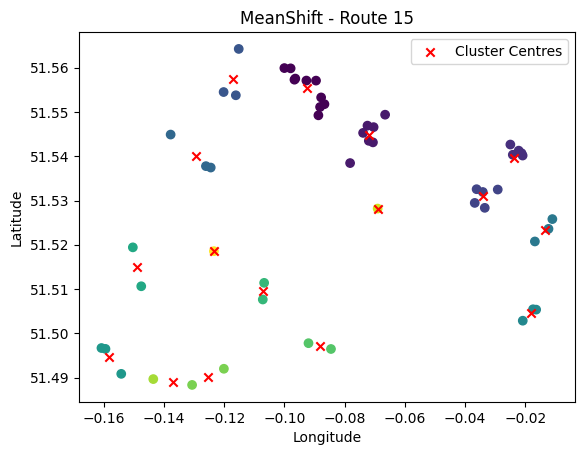

 21%|██▏       | 15/70 [10:12<38:34, 42.08s/it]

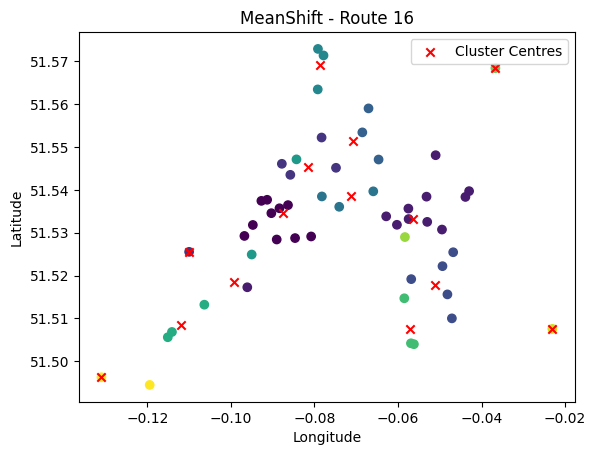

 23%|██▎       | 16/70 [10:56<38:30, 42.78s/it]

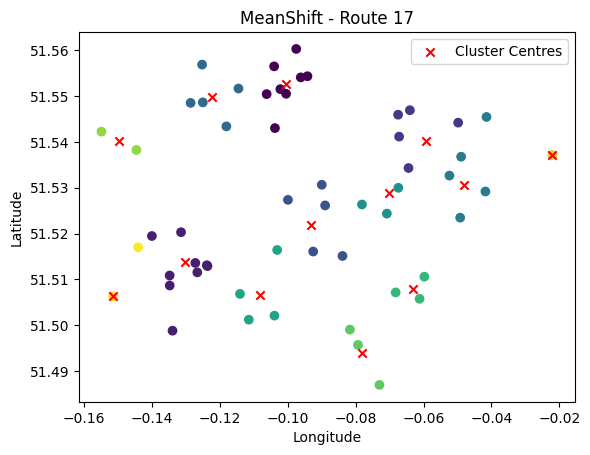

 24%|██▍       | 17/70 [11:43<38:54, 44.05s/it]

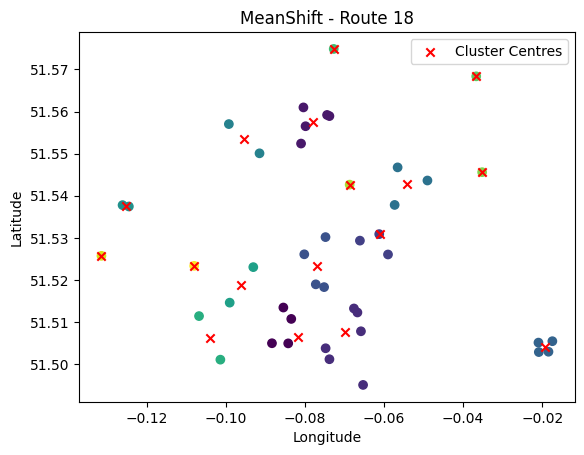

 26%|██▌       | 18/70 [12:18<35:41, 41.18s/it]

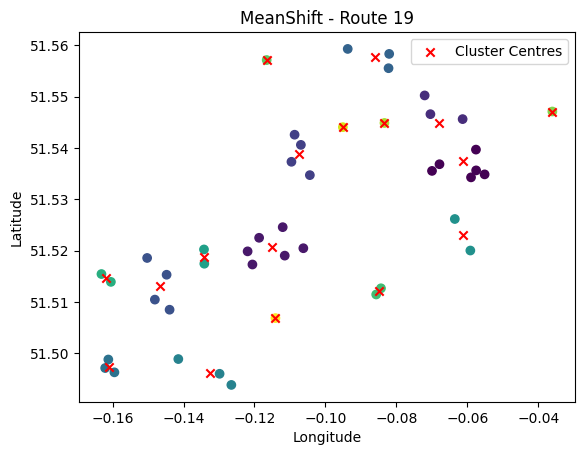

 27%|██▋       | 19/70 [12:55<33:56, 39.92s/it]

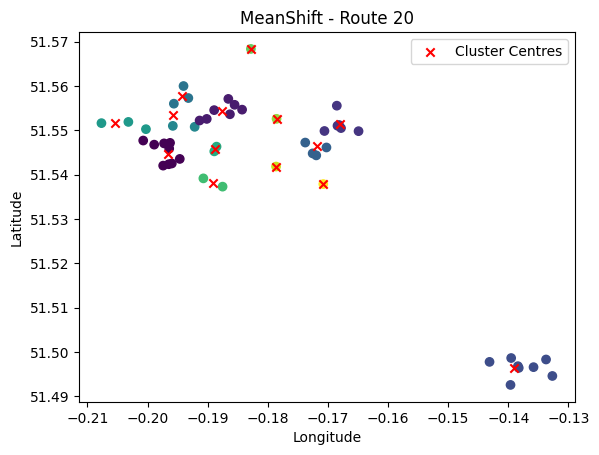

 29%|██▊       | 20/70 [13:36<33:32, 40.25s/it]

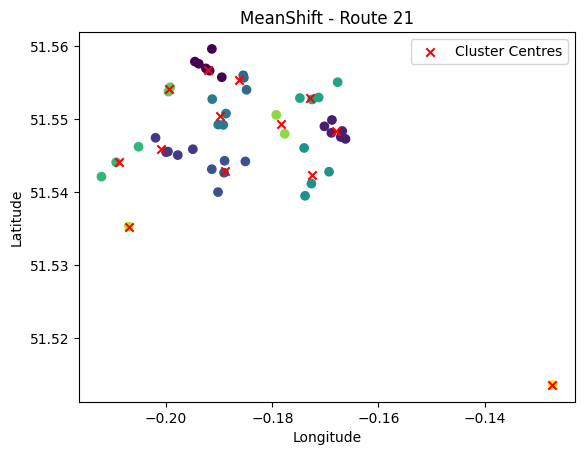

 30%|███       | 21/70 [14:13<32:03, 39.26s/it]

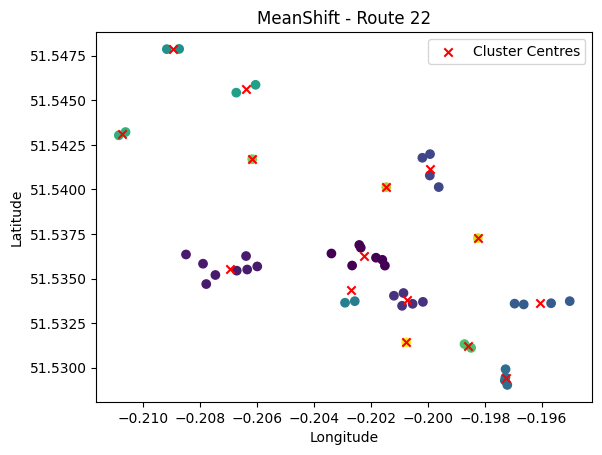

 31%|███▏      | 22/70 [14:50<30:56, 38.67s/it]

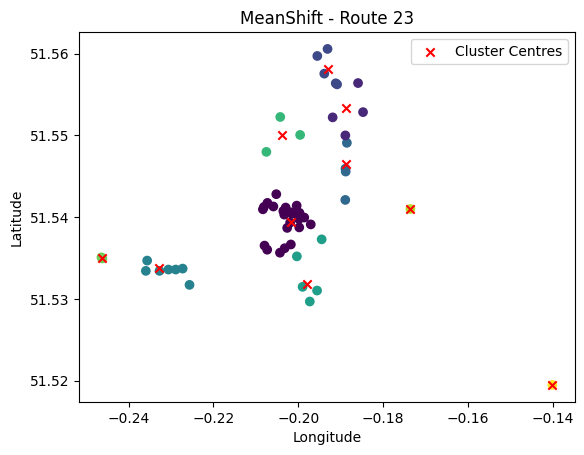

 33%|███▎      | 23/70 [15:37<32:15, 41.17s/it]

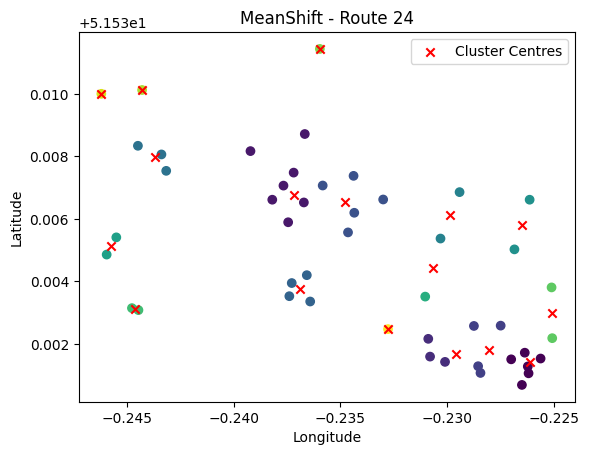

 34%|███▍      | 24/70 [16:14<30:30, 39.79s/it]

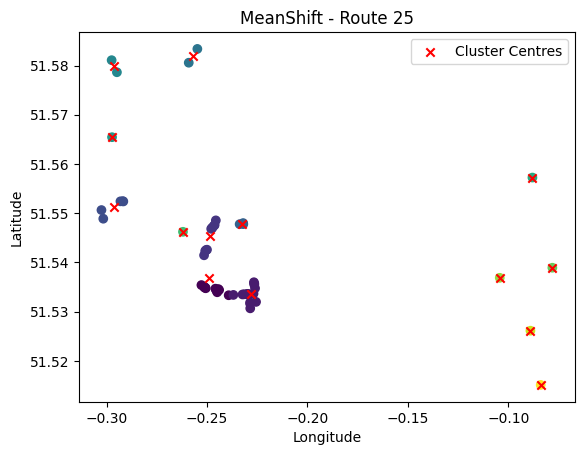

 36%|███▌      | 25/70 [17:00<31:12, 41.62s/it]

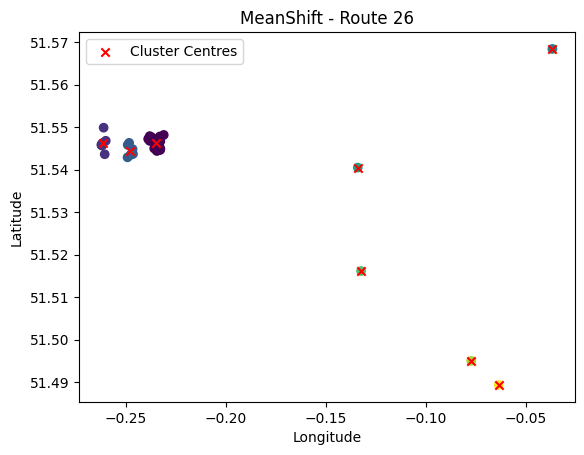

 37%|███▋      | 26/70 [17:38<29:43, 40.52s/it]

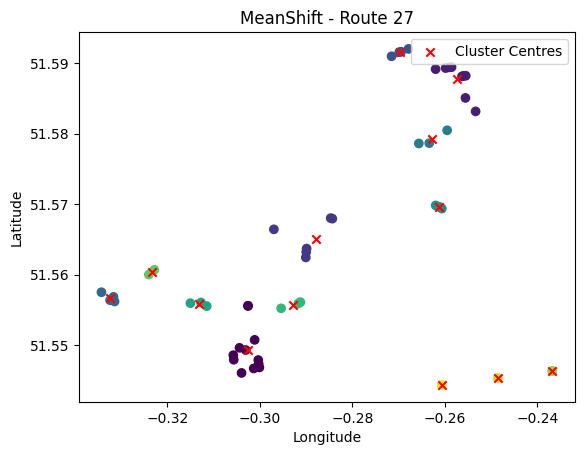

 39%|███▊      | 27/70 [18:20<29:32, 41.21s/it]

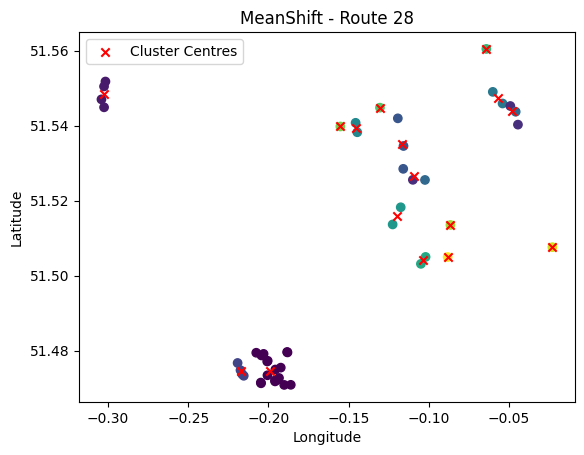

 40%|████      | 28/70 [19:00<28:32, 40.78s/it]

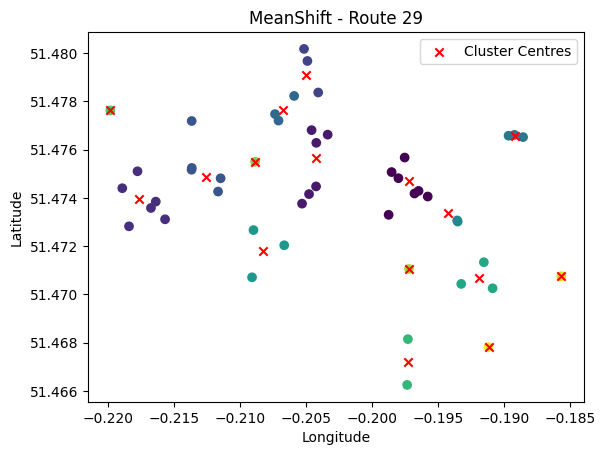

 41%|████▏     | 29/70 [19:38<27:13, 39.84s/it]

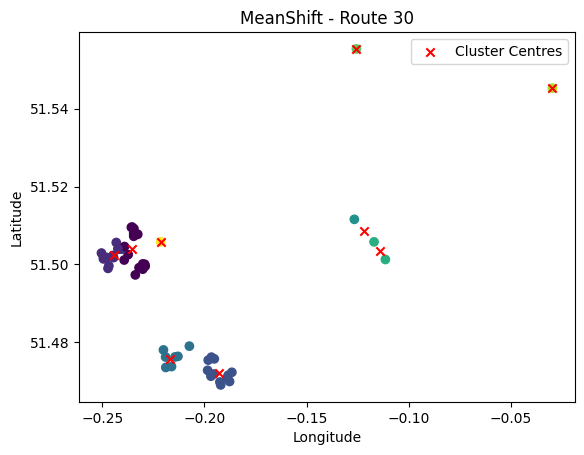

 43%|████▎     | 30/70 [20:27<28:22, 42.57s/it]

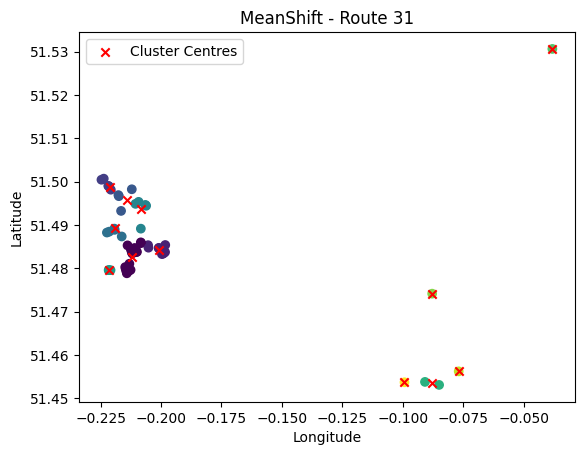

 44%|████▍     | 31/70 [21:13<28:22, 43.67s/it]

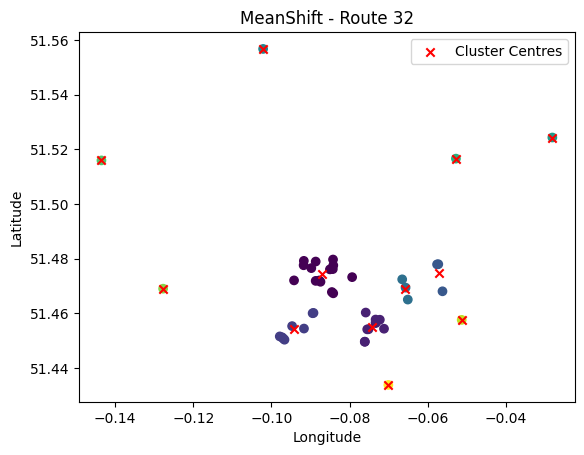

 46%|████▌     | 32/70 [21:50<26:27, 41.79s/it]

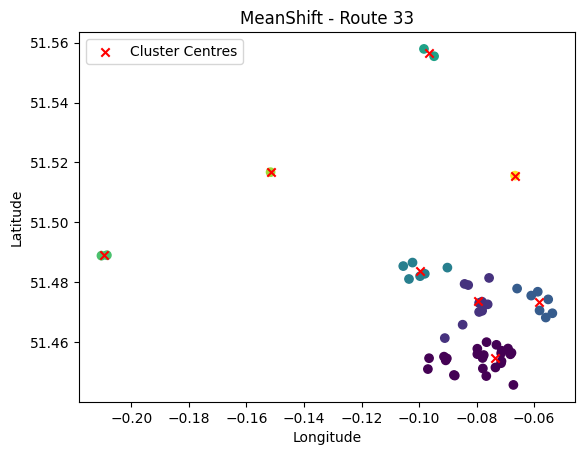

 47%|████▋     | 33/70 [22:41<27:19, 44.30s/it]

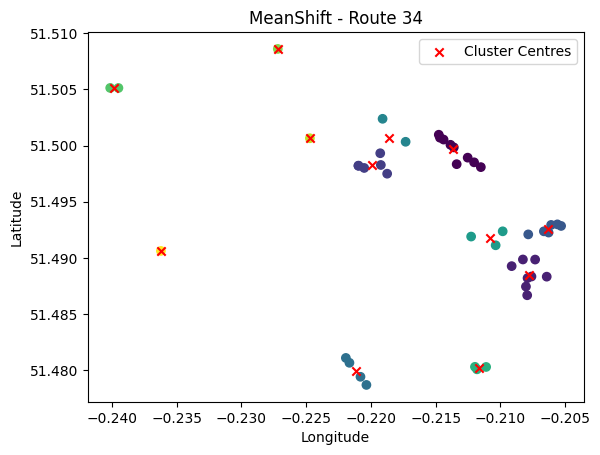

 49%|████▊     | 34/70 [23:18<25:20, 42.23s/it]

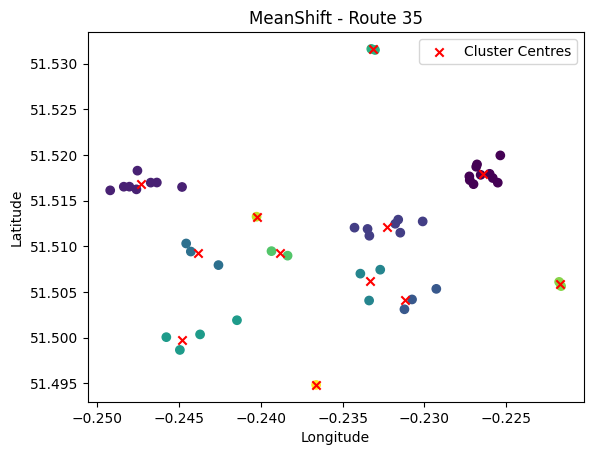

 50%|█████     | 35/70 [23:56<23:57, 41.06s/it]

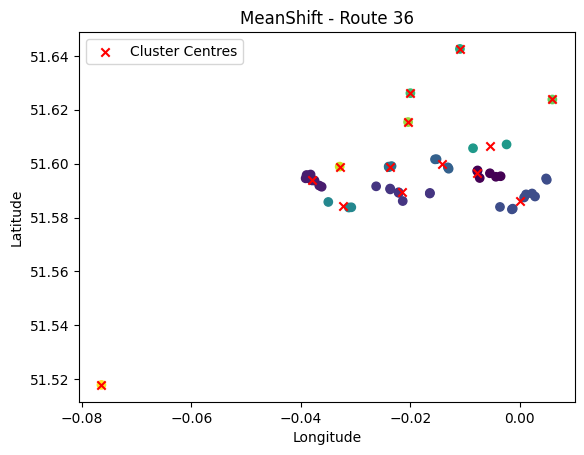

 51%|█████▏    | 36/70 [24:38<23:23, 41.28s/it]

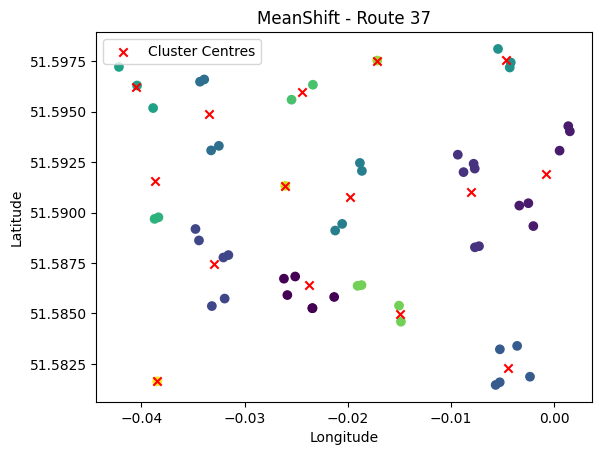

 53%|█████▎    | 37/70 [25:22<23:05, 42.00s/it]

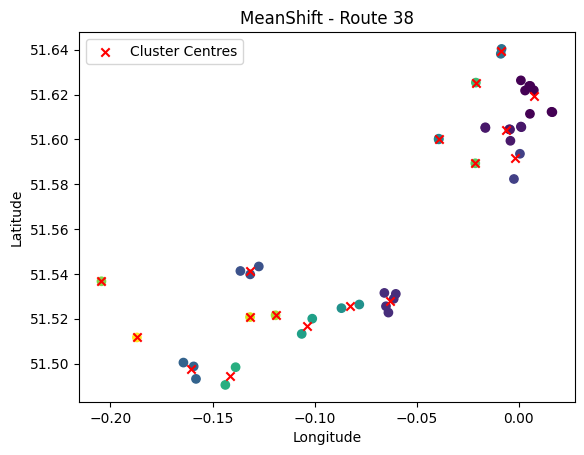

 54%|█████▍    | 38/70 [26:02<22:04, 41.40s/it]

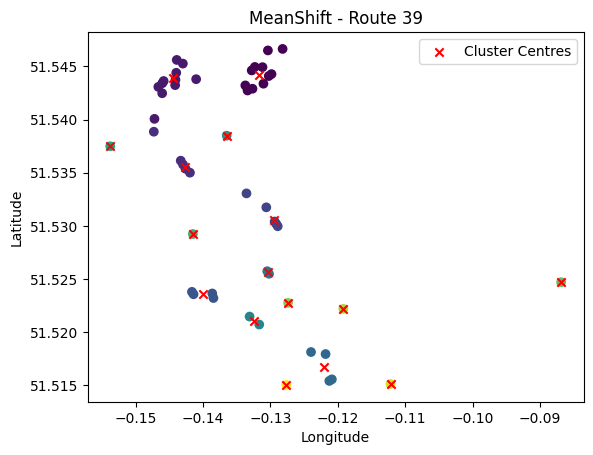

 56%|█████▌    | 39/70 [26:43<21:26, 41.49s/it]

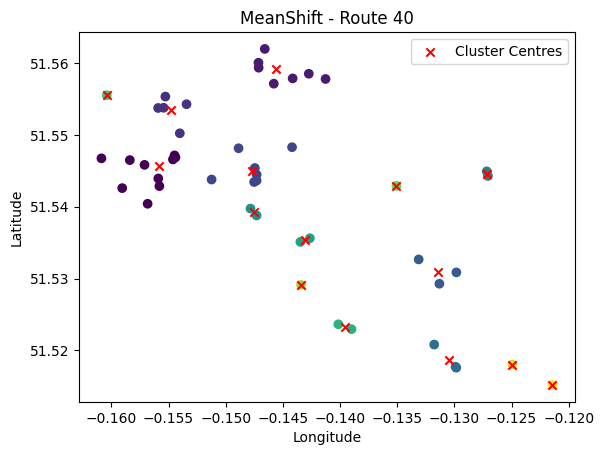

 57%|█████▋    | 40/70 [27:22<20:13, 40.46s/it]

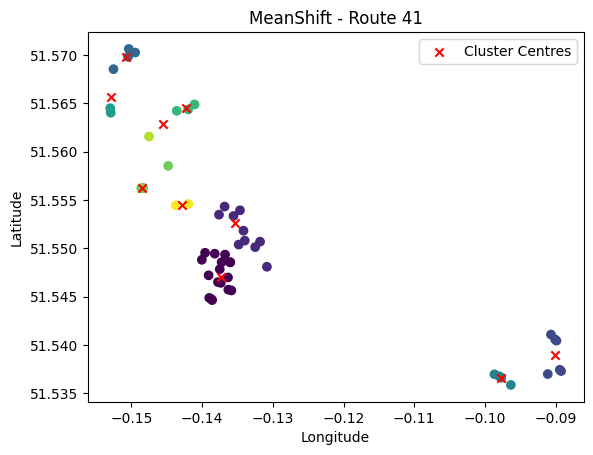

 59%|█████▊    | 41/70 [28:14<21:14, 43.96s/it]

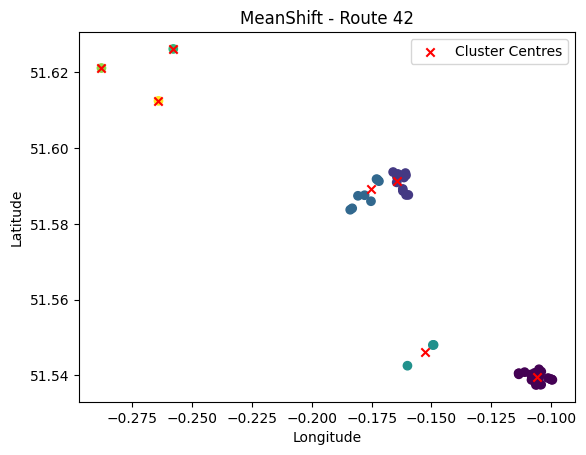

 60%|██████    | 42/70 [29:02<21:05, 45.19s/it]

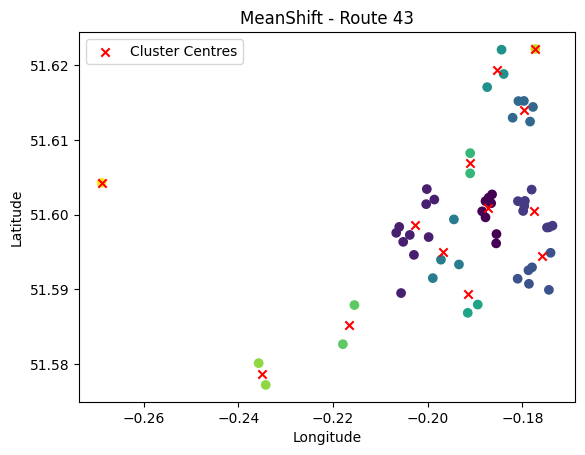

 61%|██████▏   | 43/70 [29:48<20:28, 45.50s/it]

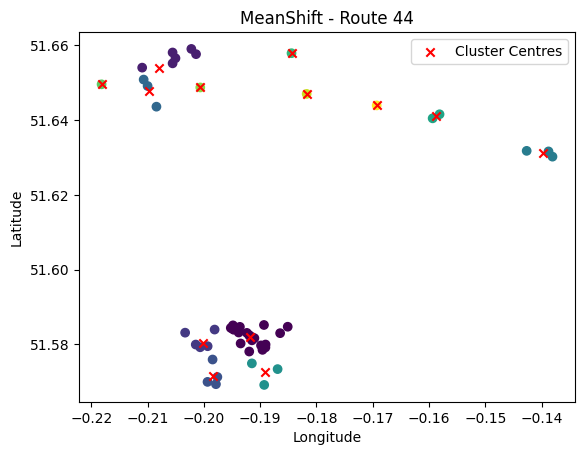

 63%|██████▎   | 44/70 [30:31<19:22, 44.71s/it]

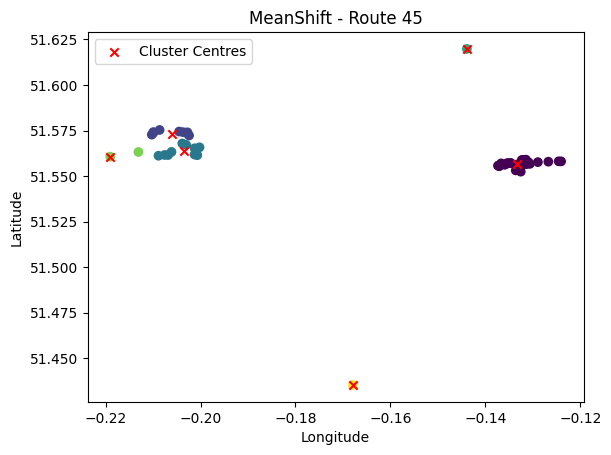

 64%|██████▍   | 45/70 [31:13<18:18, 43.95s/it]

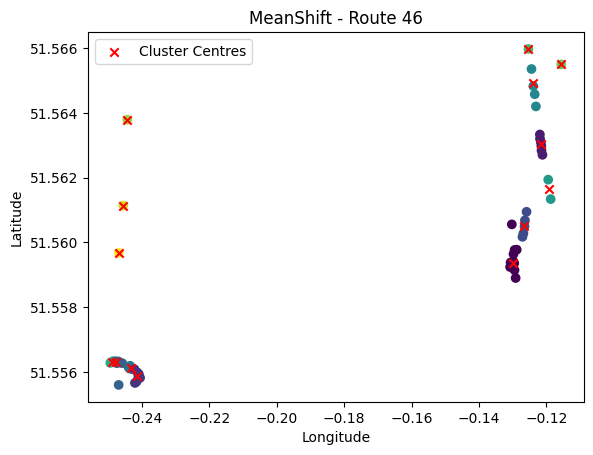

 66%|██████▌   | 46/70 [31:51<16:55, 42.30s/it]

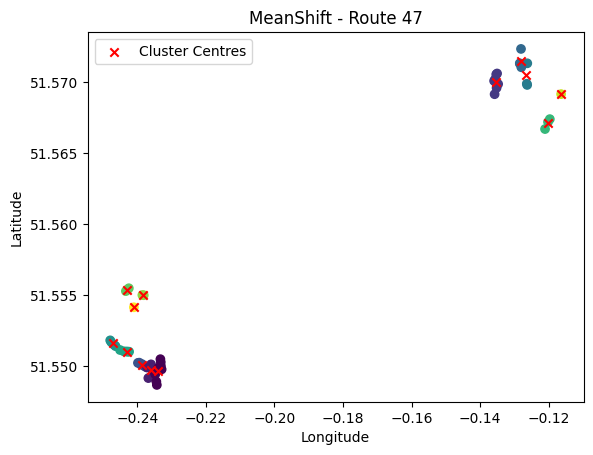

 67%|██████▋   | 47/70 [32:35<16:21, 42.68s/it]

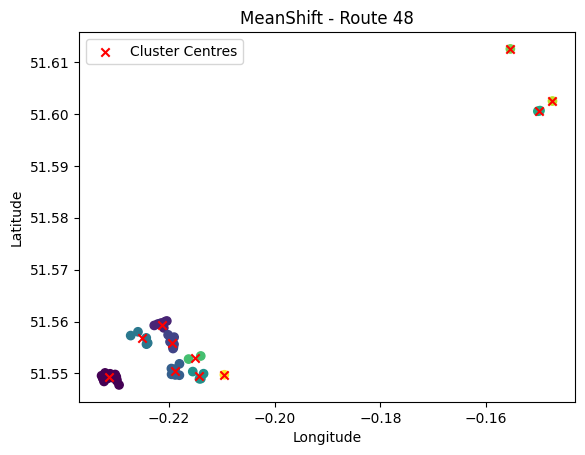

 69%|██████▊   | 48/70 [33:19<15:44, 42.95s/it]

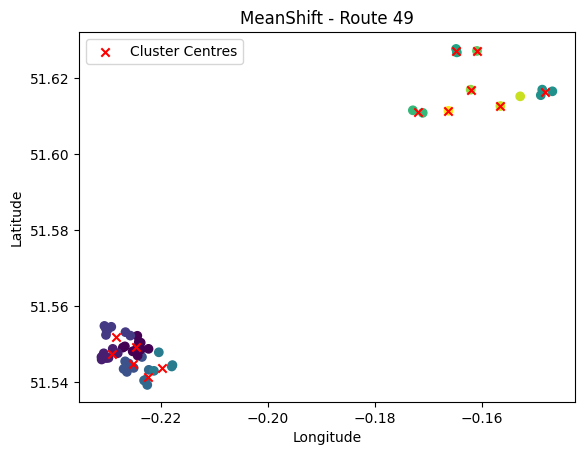

 70%|███████   | 49/70 [34:02<15:07, 43.22s/it]

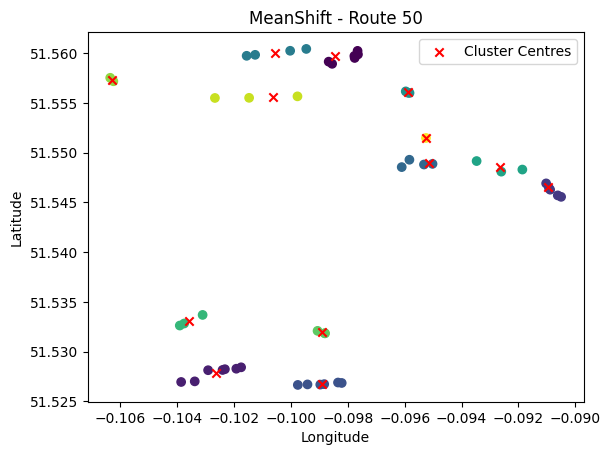

 71%|███████▏  | 50/70 [34:44<14:13, 42.67s/it]

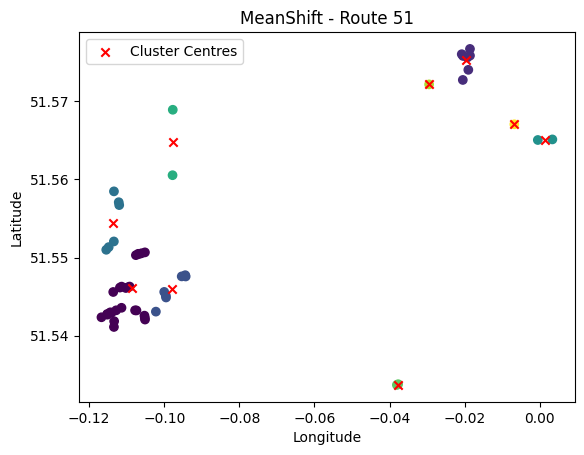

 73%|███████▎  | 51/70 [35:31<13:54, 43.94s/it]

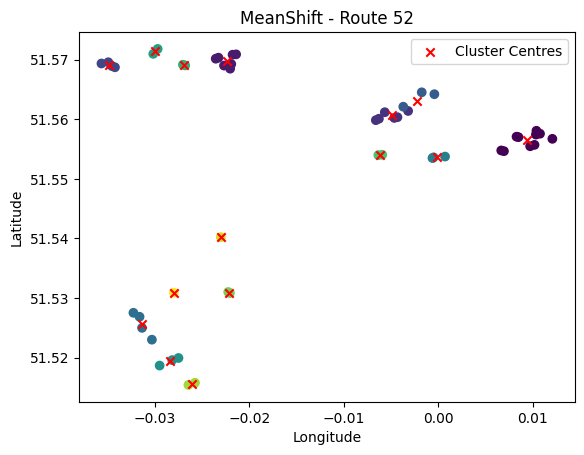

 74%|███████▍  | 52/70 [36:12<12:58, 43.27s/it]

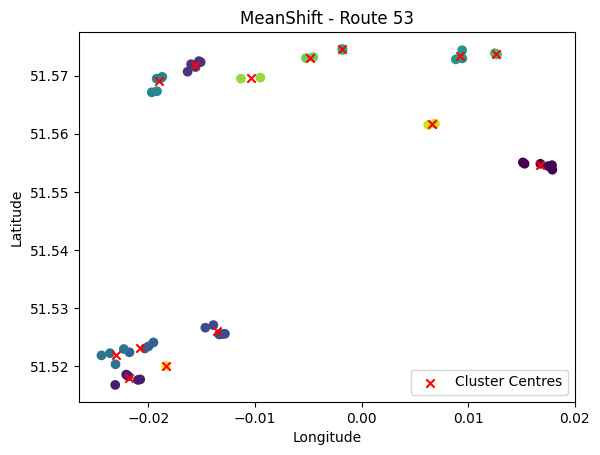

 76%|███████▌  | 53/70 [36:51<11:52, 41.93s/it]

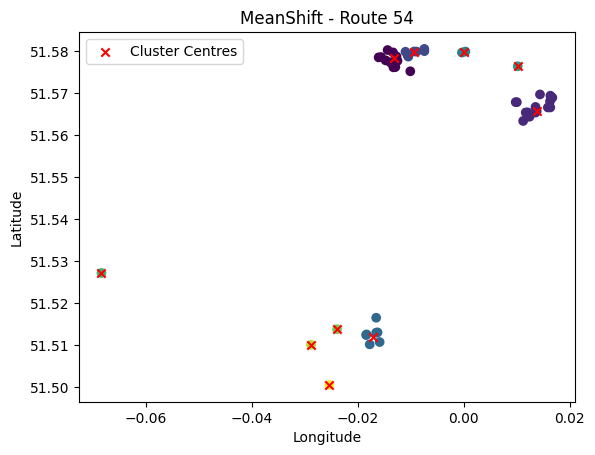

 77%|███████▋  | 54/70 [37:31<10:58, 41.18s/it]

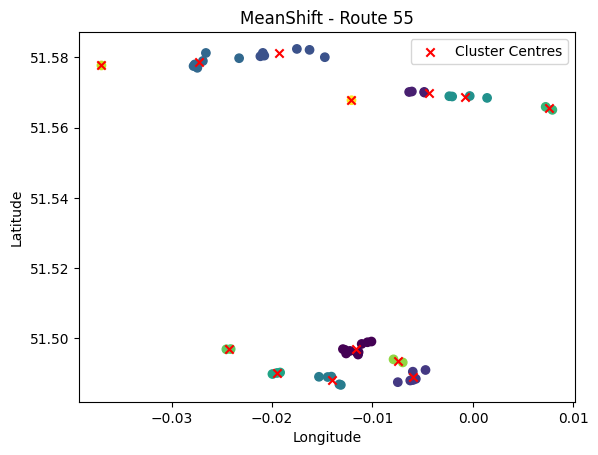

 79%|███████▊  | 55/70 [38:16<10:35, 42.40s/it]

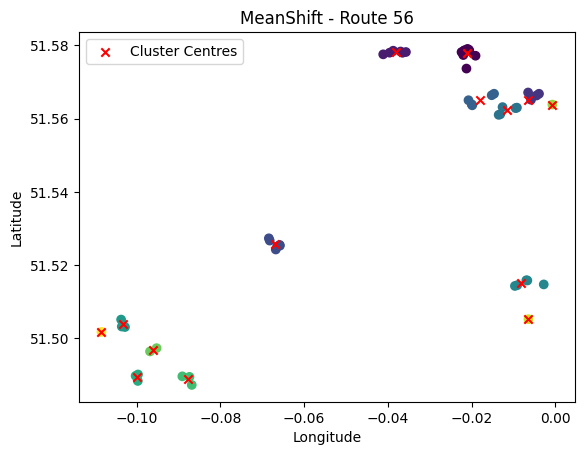

 80%|████████  | 56/70 [39:01<10:04, 43.14s/it]

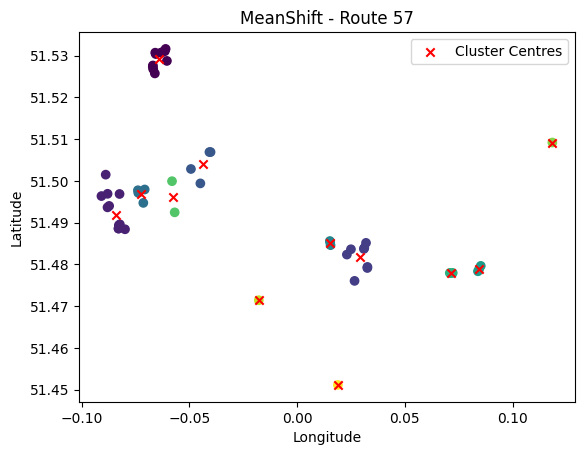

 81%|████████▏ | 57/70 [39:46<09:29, 43.81s/it]

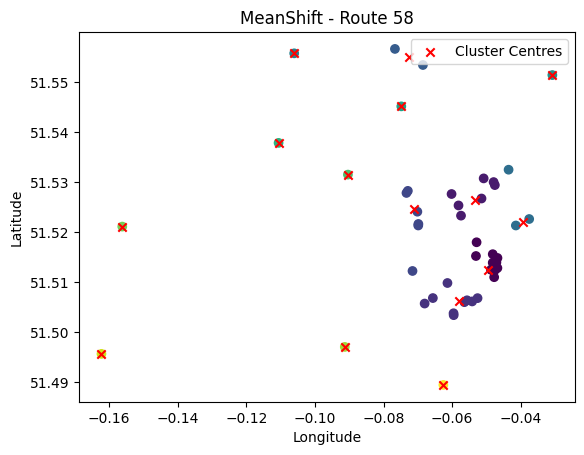

 83%|████████▎ | 58/70 [40:25<08:29, 42.47s/it]

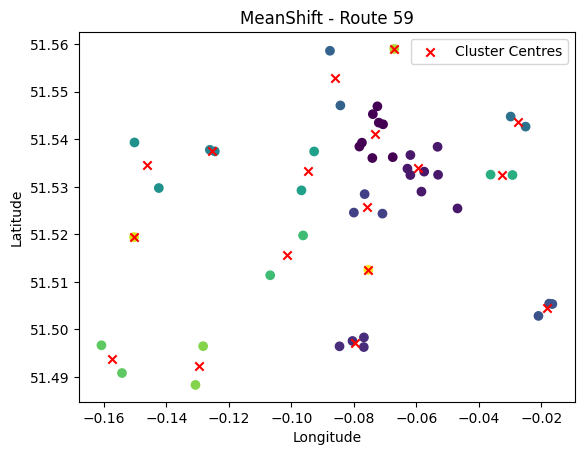

 84%|████████▍ | 59/70 [41:03<07:32, 41.09s/it]

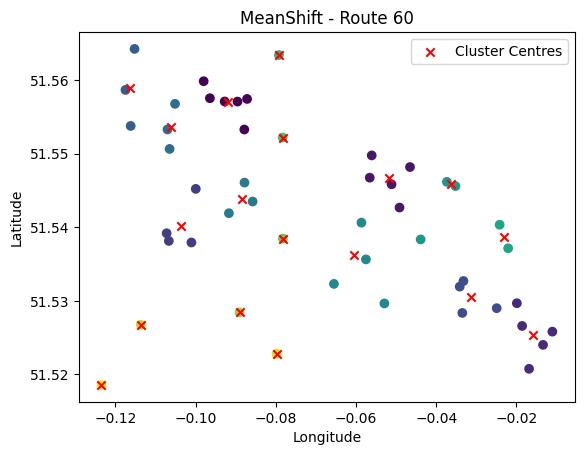

 86%|████████▌ | 60/70 [41:41<06:41, 40.11s/it]

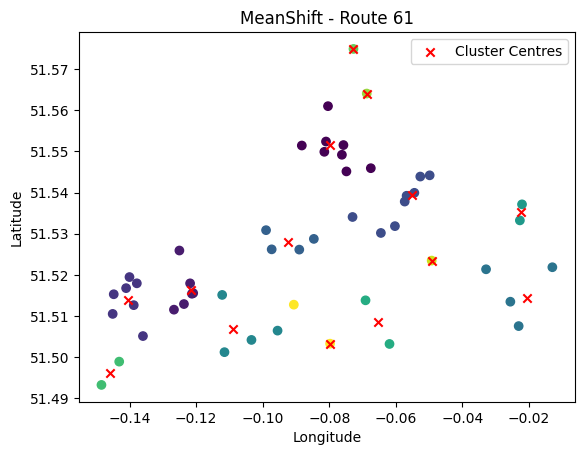

 87%|████████▋ | 61/70 [42:25<06:11, 41.24s/it]

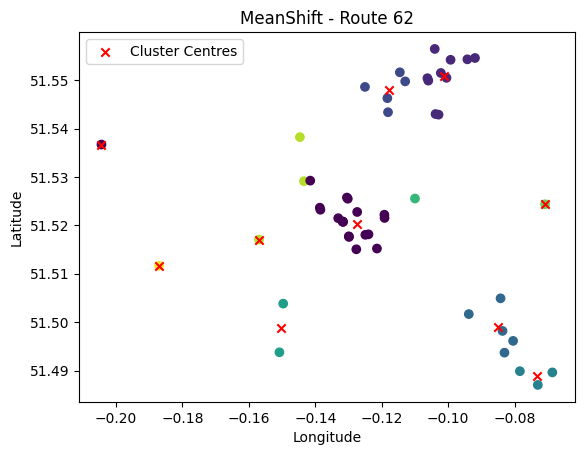

 89%|████████▊ | 62/70 [43:08<05:33, 41.74s/it]

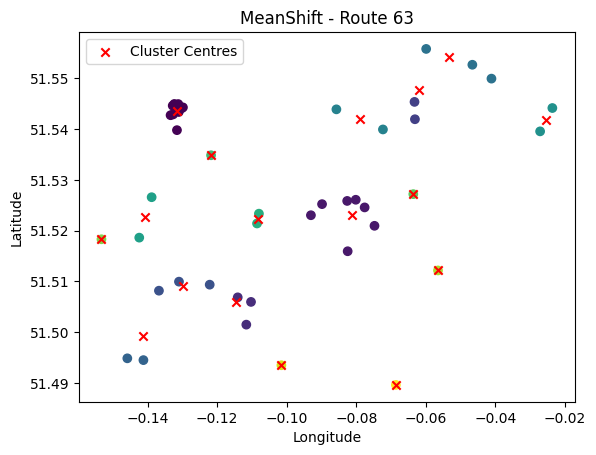

 90%|█████████ | 63/70 [43:42<04:35, 39.41s/it]

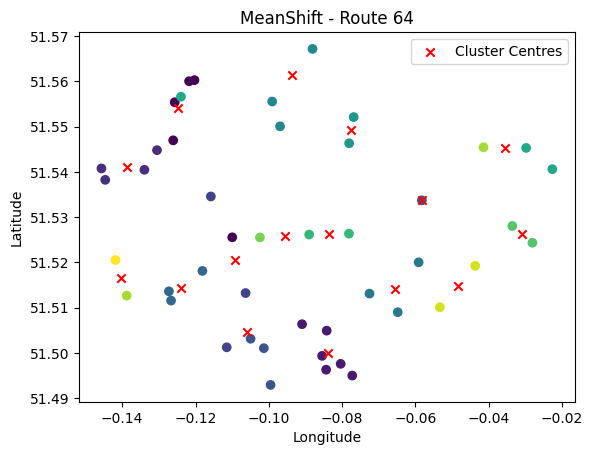

 91%|█████████▏| 64/70 [44:18<03:49, 38.31s/it]

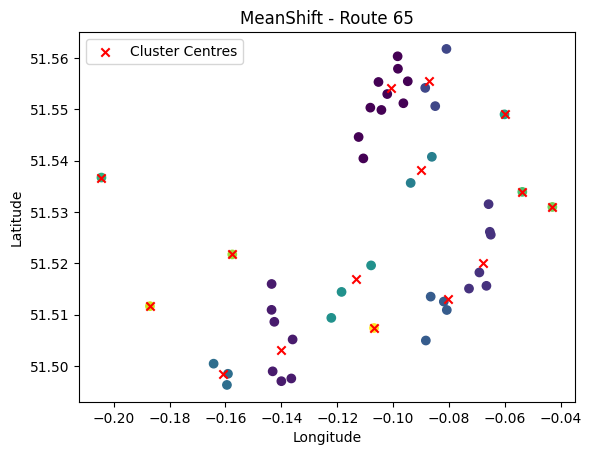

 93%|█████████▎| 65/70 [44:53<03:06, 37.32s/it]

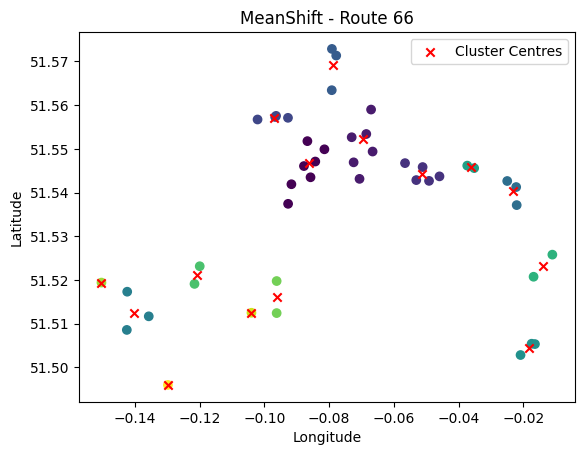

 94%|█████████▍| 66/70 [45:30<02:29, 37.45s/it]

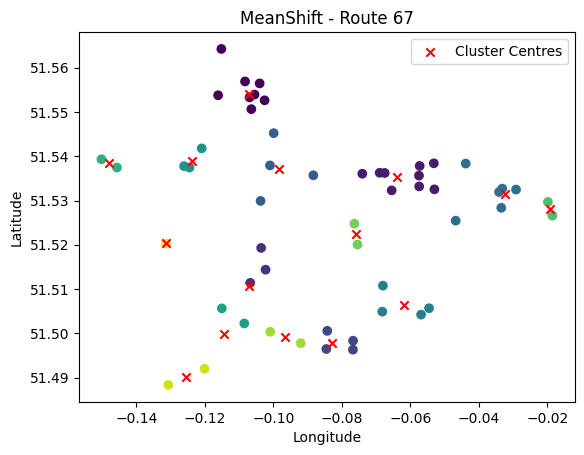

 96%|█████████▌| 67/70 [46:17<02:00, 40.26s/it]

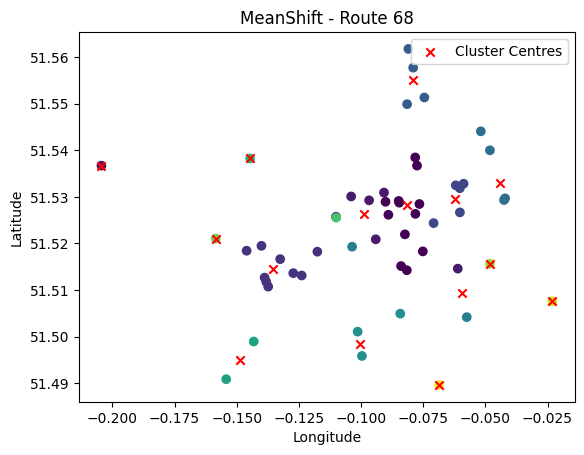

 97%|█████████▋| 68/70 [47:03<01:24, 42.05s/it]

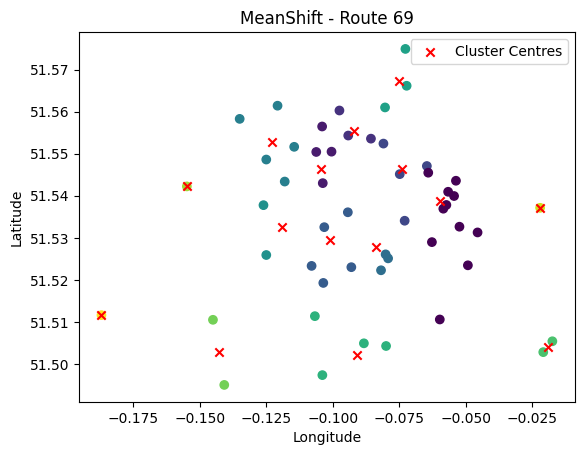

 99%|█████████▊| 69/70 [47:46<00:42, 42.09s/it]

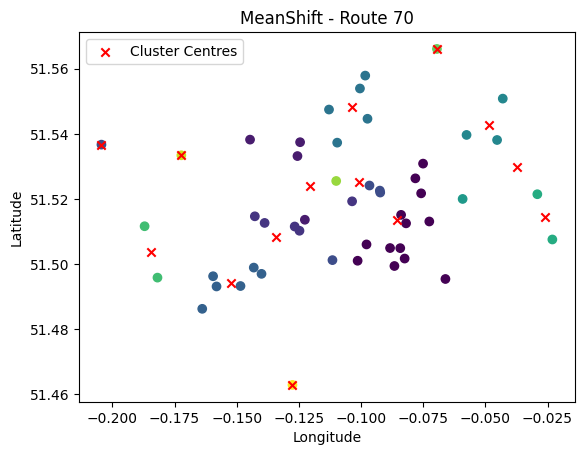

100%|██████████| 70/70 [48:28<00:00, 41.55s/it]


In [ ]:
meanshift_results = pd.DataFrame()
for i in tqdm(range(len(route_list))):
  test_route = route_list[i]
  meanshift = meanshift_operate(i,test_route)

  meanshift_results = pd.concat([meanshift_results,meanshift], ignore_index=True)

meanshift_table = results_path + "Meanshift_results.csv"
meanshift_results.to_csv(meanshift_table)

  0%|          | 0/70 [00:00<?, ?it/s]

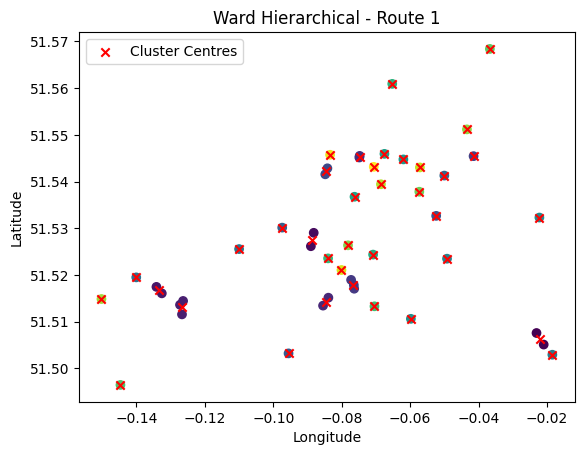

  1%|▏         | 1/70 [00:39<44:58, 39.11s/it]

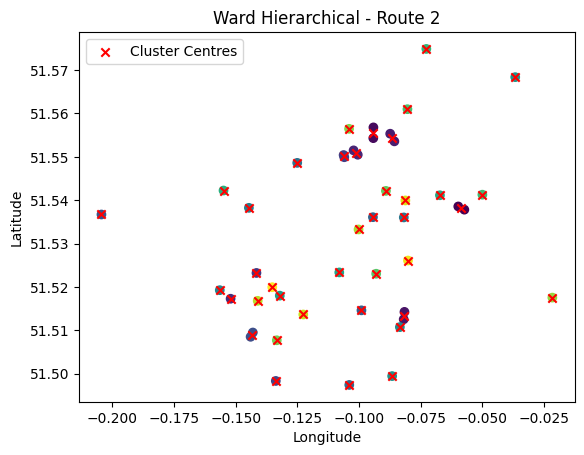

  3%|▎         | 2/70 [01:12<40:29, 35.72s/it]

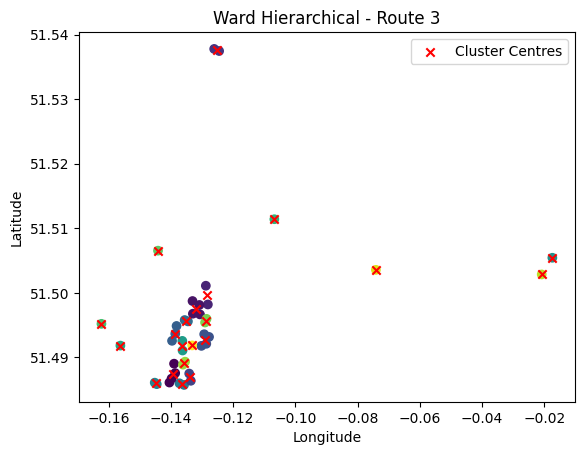

  4%|▍         | 3/70 [01:46<39:11, 35.09s/it]

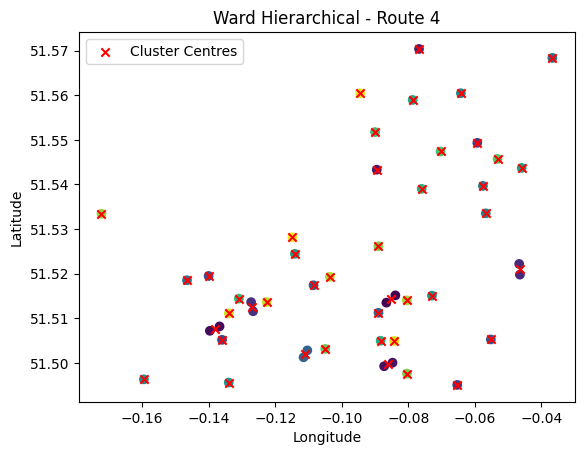

  6%|▌         | 4/70 [02:16<36:26, 33.13s/it]

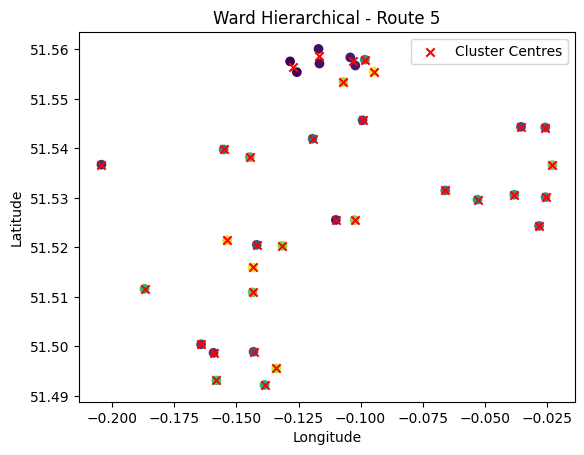

  7%|▋         | 5/70 [02:37<31:00, 28.63s/it]

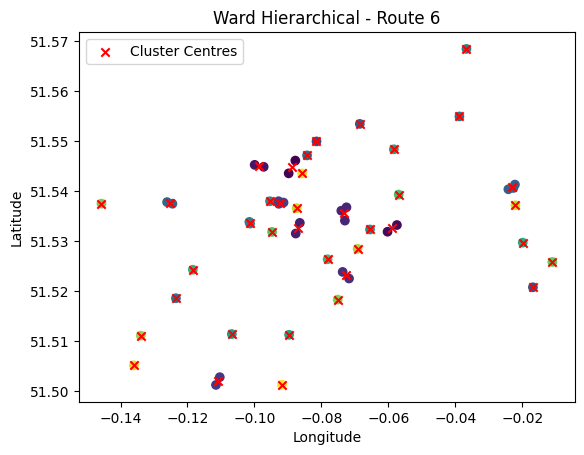

  9%|▊         | 6/70 [03:11<32:23, 30.37s/it]

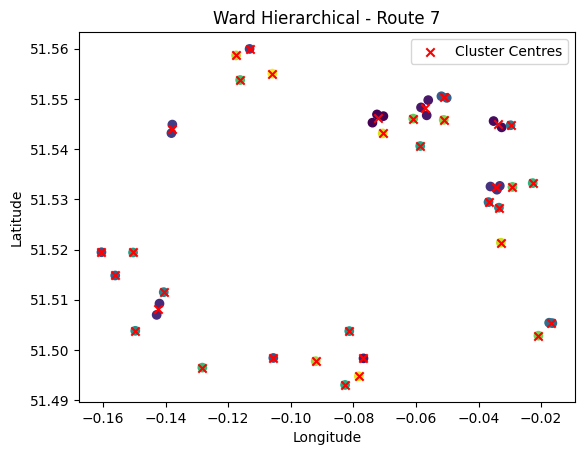

 10%|█         | 7/70 [03:41<31:56, 30.43s/it]

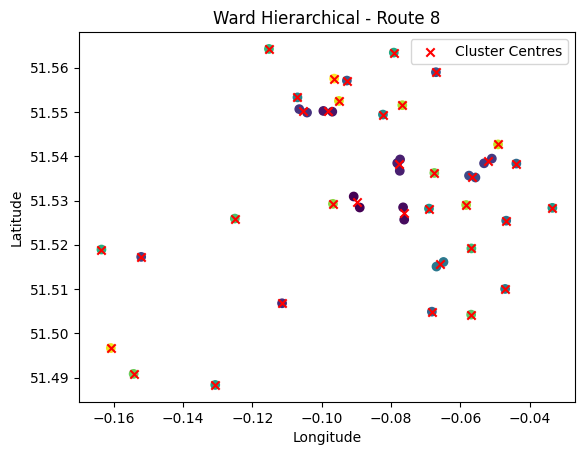

 11%|█▏        | 8/70 [04:10<30:45, 29.77s/it]

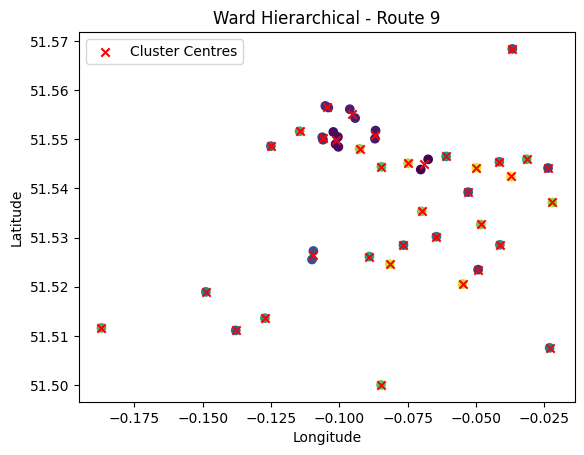

 13%|█▎        | 9/70 [04:38<29:55, 29.44s/it]

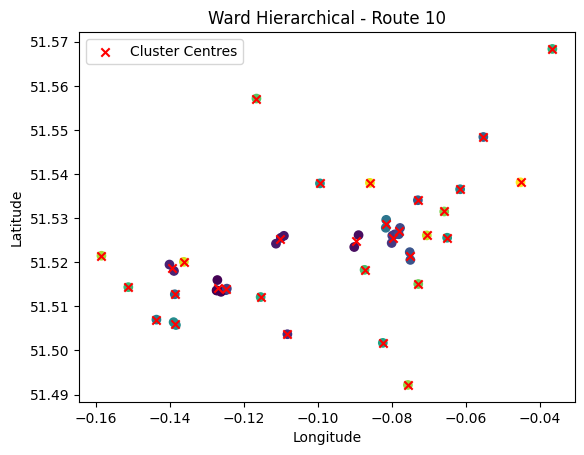

 14%|█▍        | 10/70 [05:10<30:03, 30.07s/it]

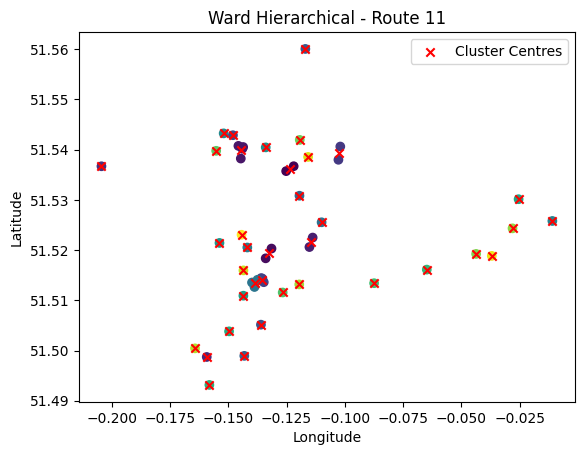

 16%|█▌        | 11/70 [05:41<29:45, 30.27s/it]

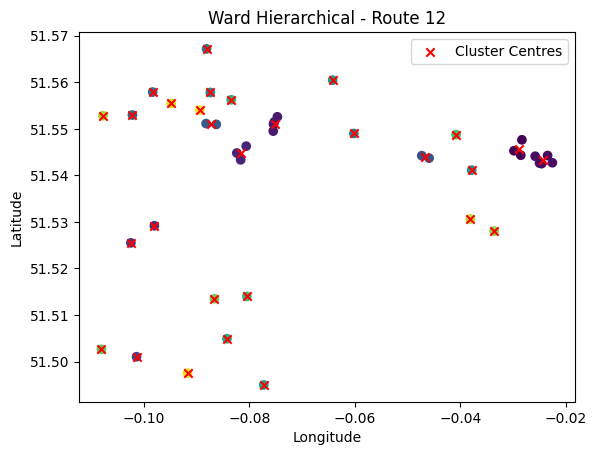

 17%|█▋        | 12/70 [06:09<28:45, 29.75s/it]

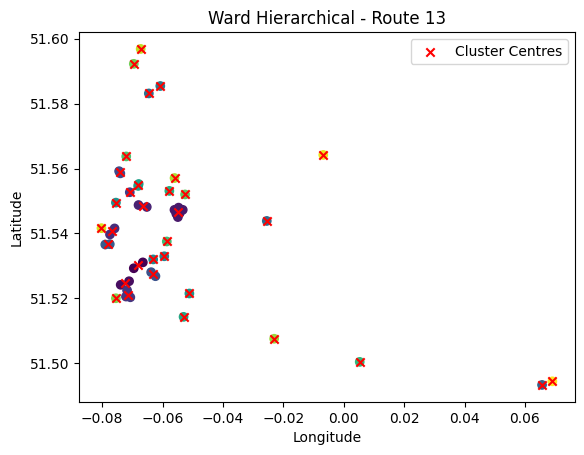

 19%|█▊        | 13/70 [06:42<29:00, 30.53s/it]

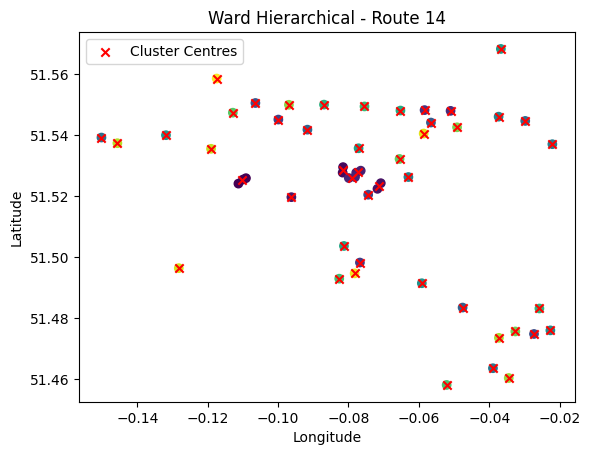

 20%|██        | 14/70 [07:12<28:22, 30.41s/it]

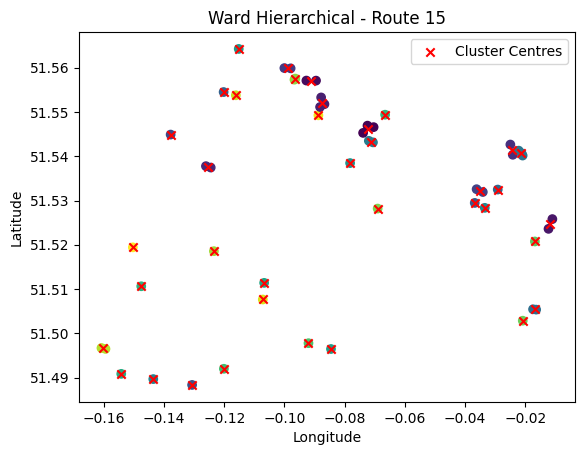

 21%|██▏       | 15/70 [07:47<29:17, 31.95s/it]

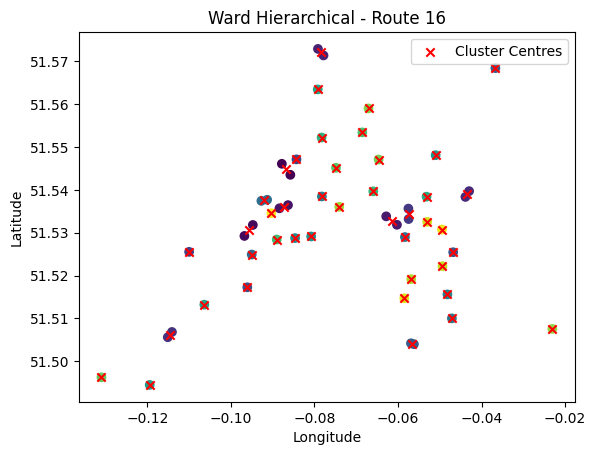

 23%|██▎       | 16/70 [08:19<28:48, 32.02s/it]

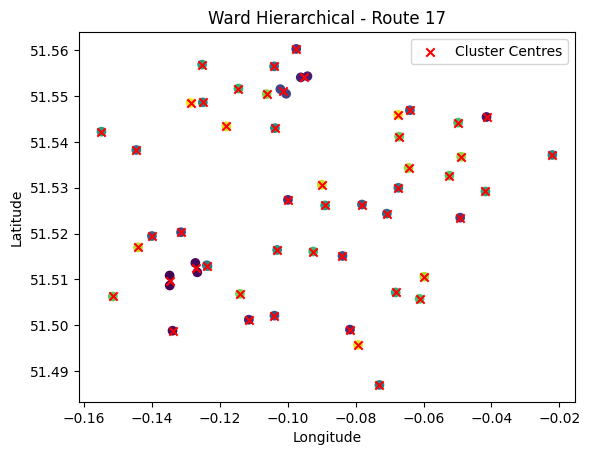

 24%|██▍       | 17/70 [08:50<27:59, 31.70s/it]

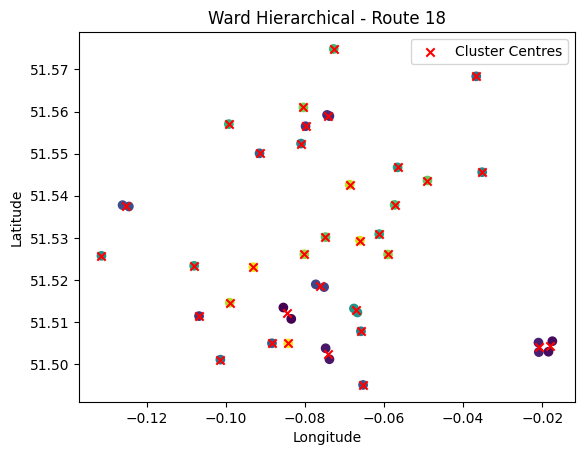

 26%|██▌       | 18/70 [09:17<26:12, 30.24s/it]

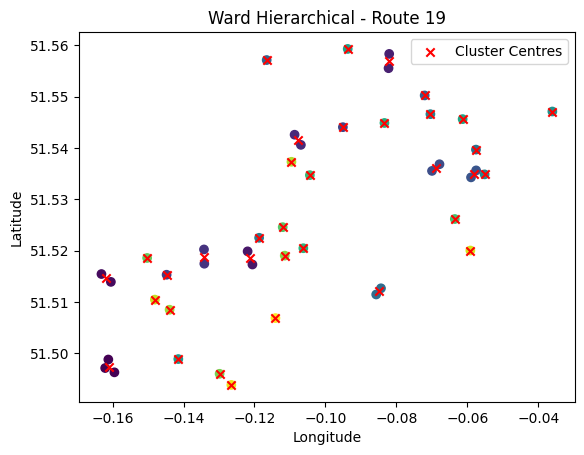

 27%|██▋       | 19/70 [09:45<25:12, 29.66s/it]

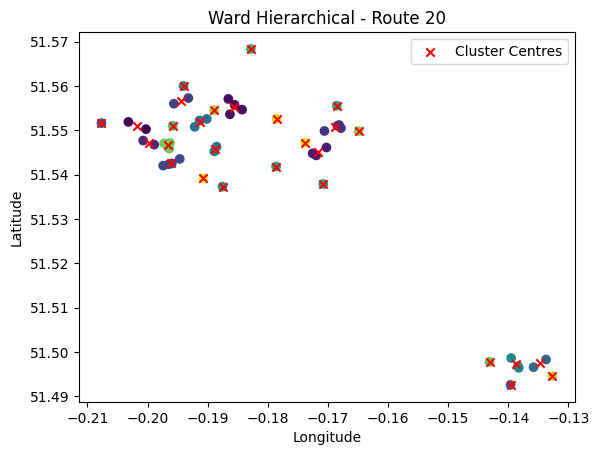

 29%|██▊       | 20/70 [10:22<26:28, 31.76s/it]

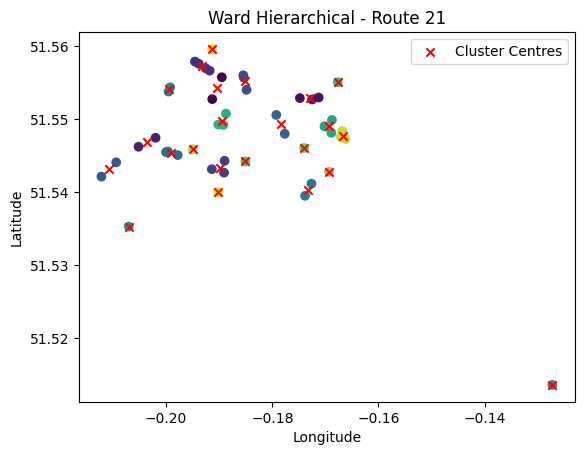

 30%|███       | 21/70 [10:56<26:32, 32.51s/it]

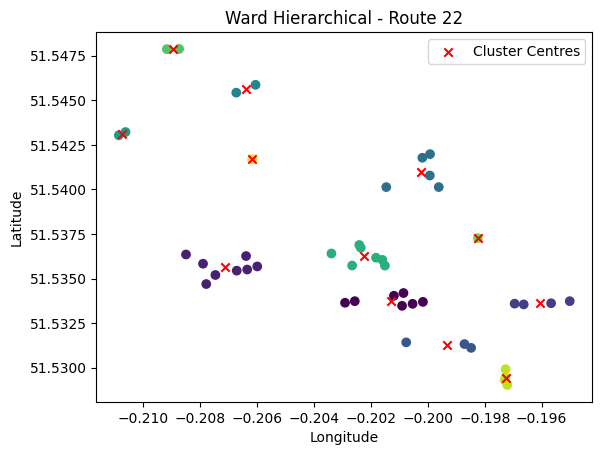

 31%|███▏      | 22/70 [11:35<27:32, 34.42s/it]

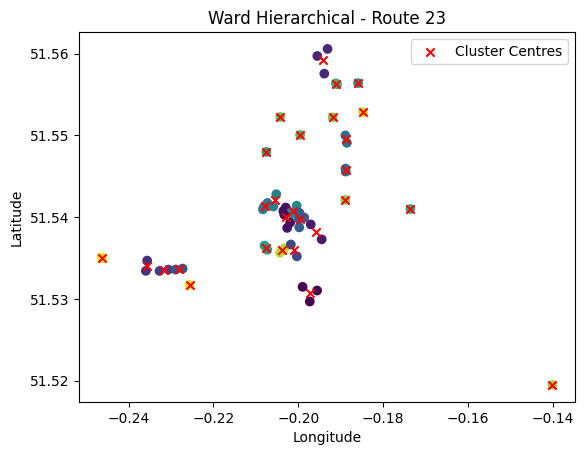

 33%|███▎      | 23/70 [12:15<28:19, 36.15s/it]

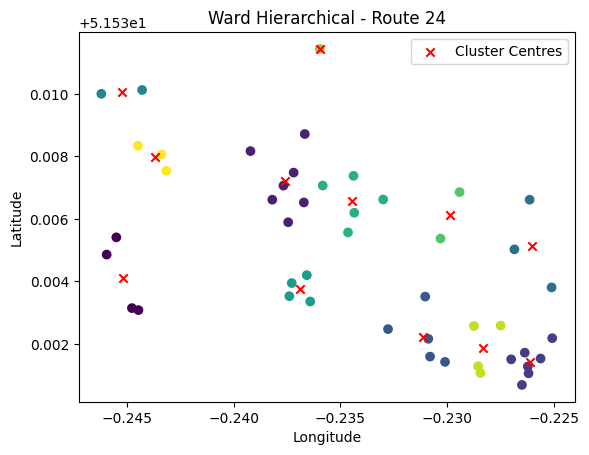

 34%|███▍      | 24/70 [12:59<29:23, 38.33s/it]

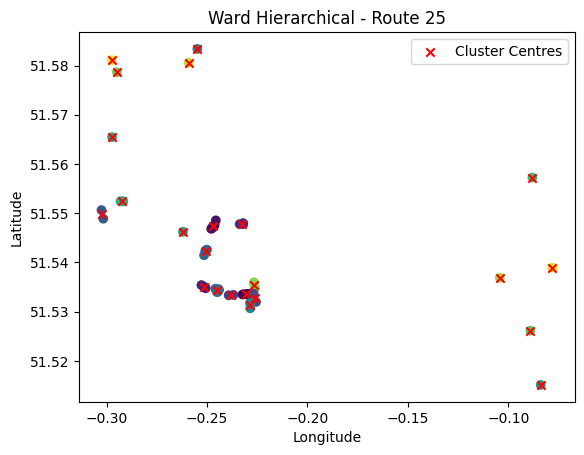

 36%|███▌      | 25/70 [13:43<30:01, 40.02s/it]

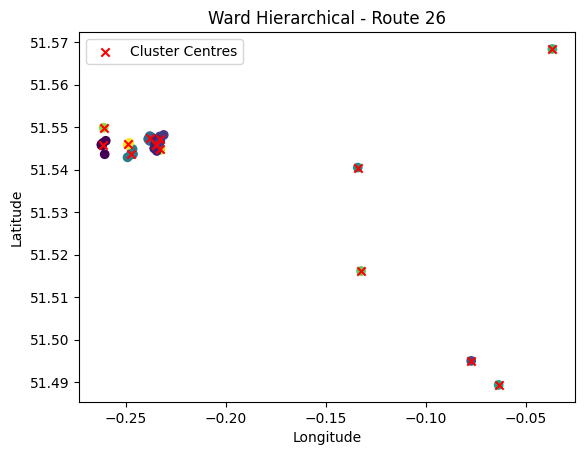

 37%|███▋      | 26/70 [14:21<28:51, 39.34s/it]

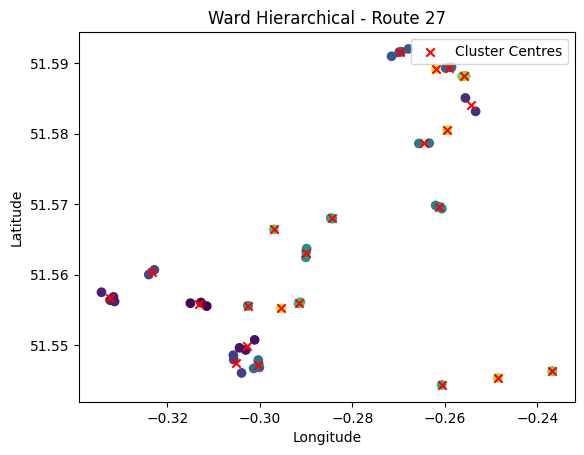

 39%|███▊      | 27/70 [15:03<28:50, 40.24s/it]

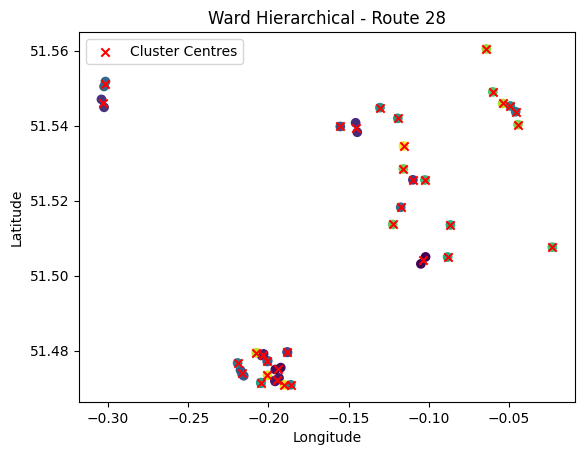

 40%|████      | 28/70 [15:36<26:40, 38.11s/it]

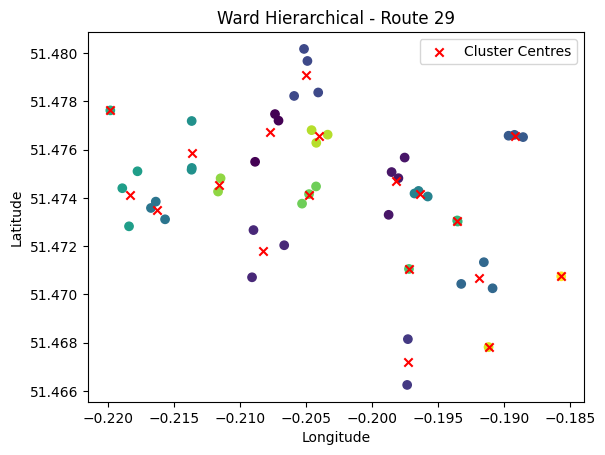

 41%|████▏     | 29/70 [16:15<26:08, 38.25s/it]

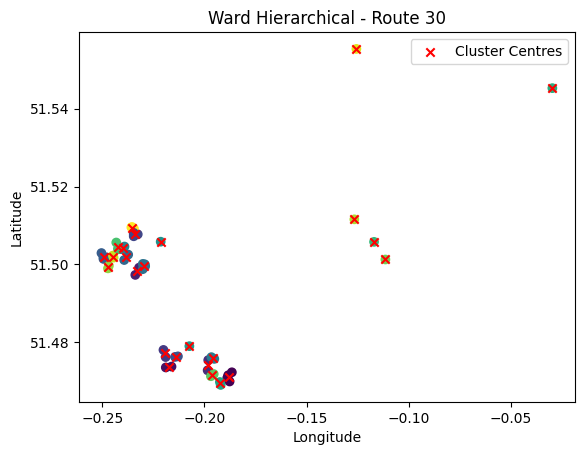

 43%|████▎     | 30/70 [16:56<26:02, 39.05s/it]

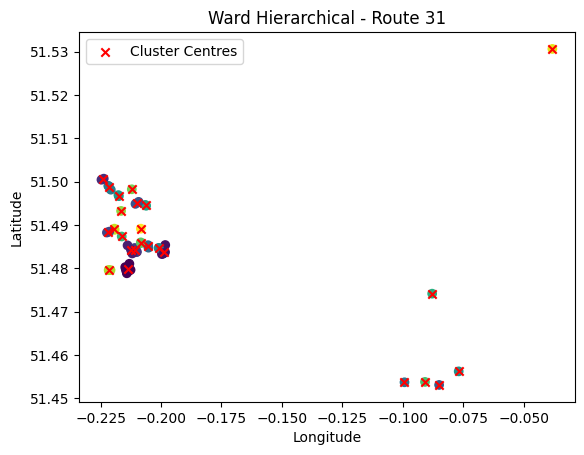

 44%|████▍     | 31/70 [17:37<25:54, 39.87s/it]

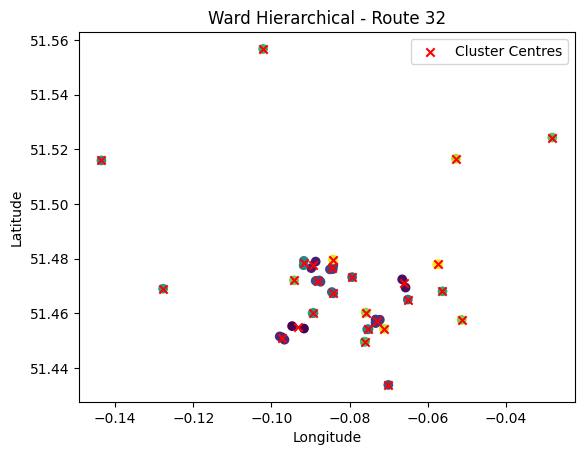

 46%|████▌     | 32/70 [18:11<23:58, 37.86s/it]

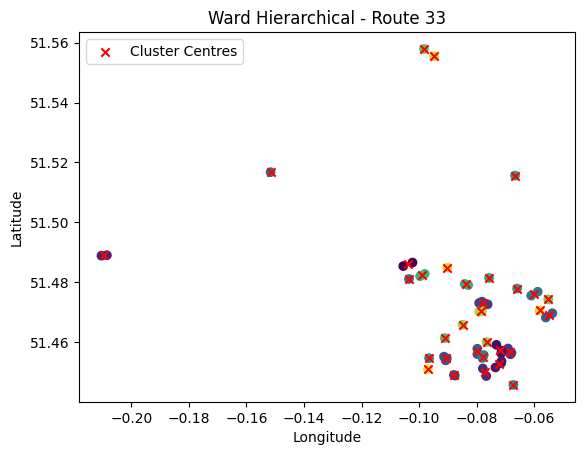

 47%|████▋     | 33/70 [18:49<23:24, 37.95s/it]

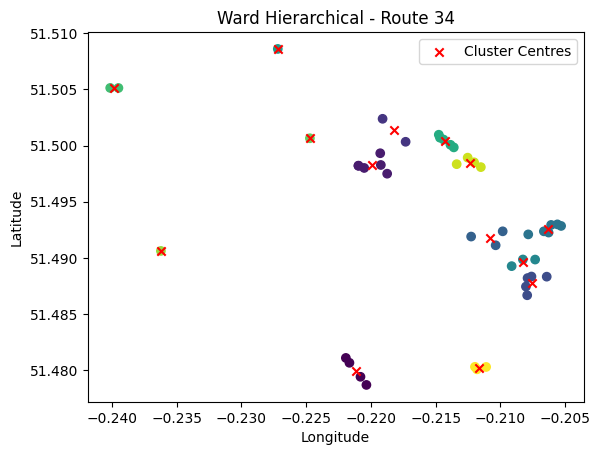

 49%|████▊     | 34/70 [19:27<22:49, 38.03s/it]

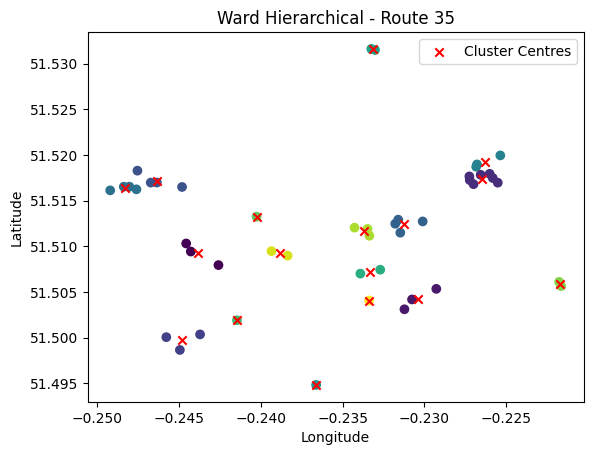

 50%|█████     | 35/70 [20:05<22:16, 38.19s/it]

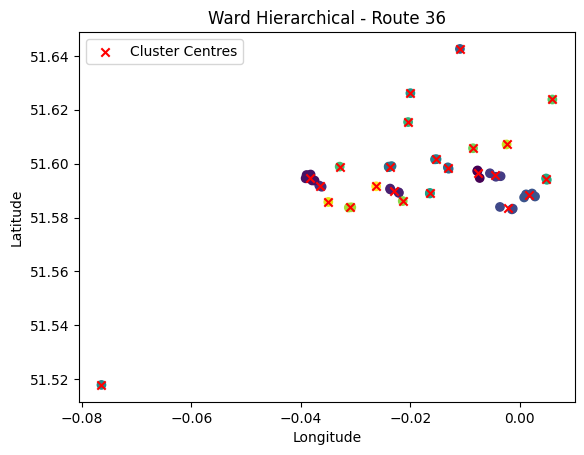

 51%|█████▏    | 36/70 [20:41<21:15, 37.50s/it]

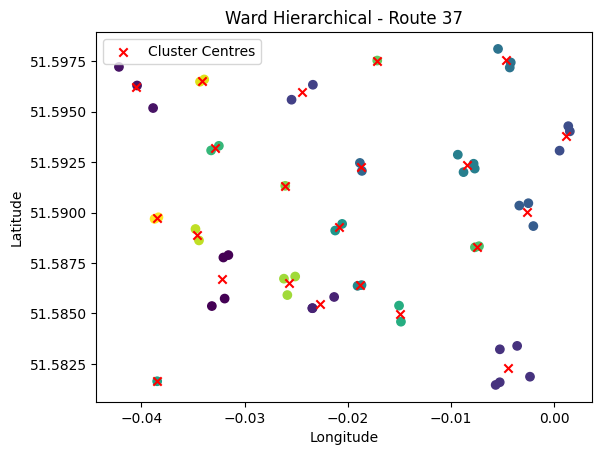

 53%|█████▎    | 37/70 [21:24<21:27, 39.00s/it]

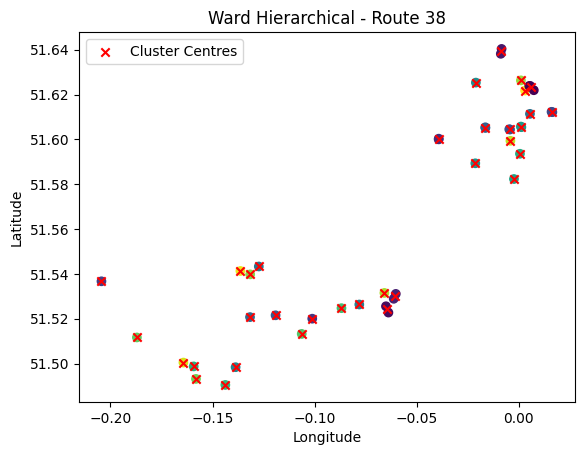

 54%|█████▍    | 38/70 [21:51<18:49, 35.30s/it]

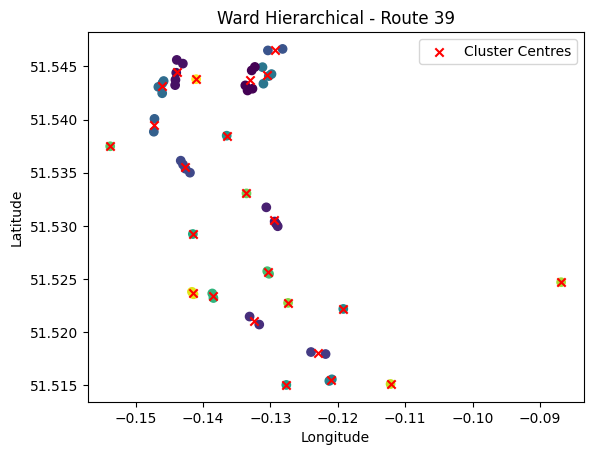

 56%|█████▌    | 39/70 [22:30<18:54, 36.58s/it]

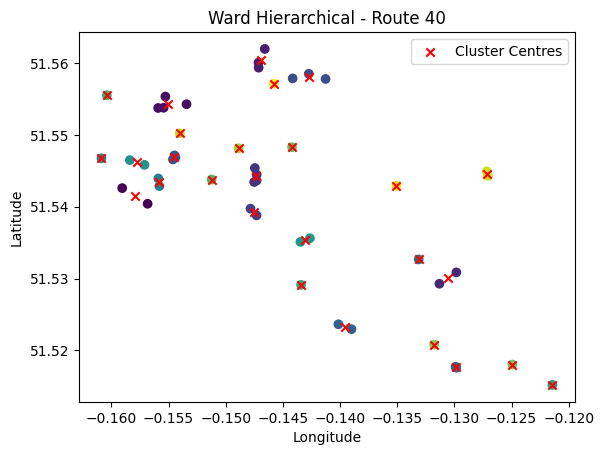

 57%|█████▋    | 40/70 [23:06<18:08, 36.29s/it]

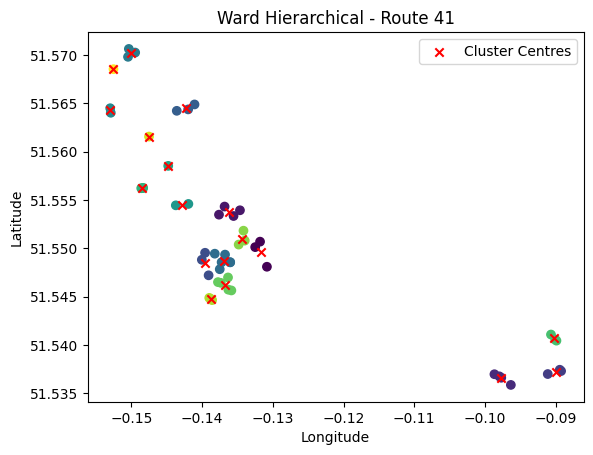

 59%|█████▊    | 41/70 [23:55<19:25, 40.18s/it]

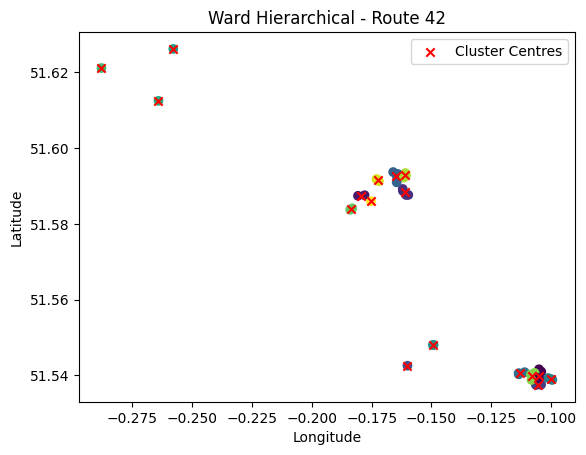

 60%|██████    | 42/70 [24:43<19:50, 42.51s/it]

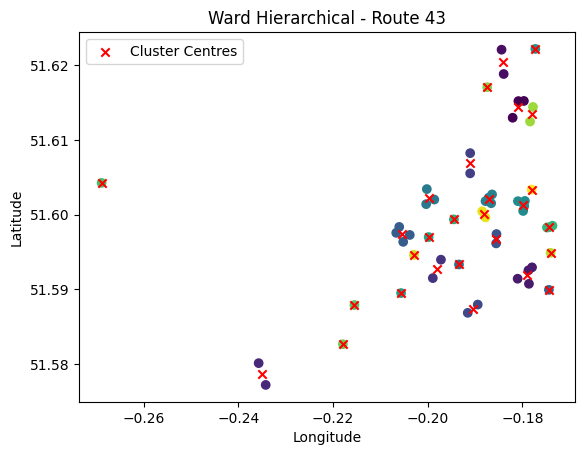

 61%|██████▏   | 43/70 [25:25<19:02, 42.31s/it]

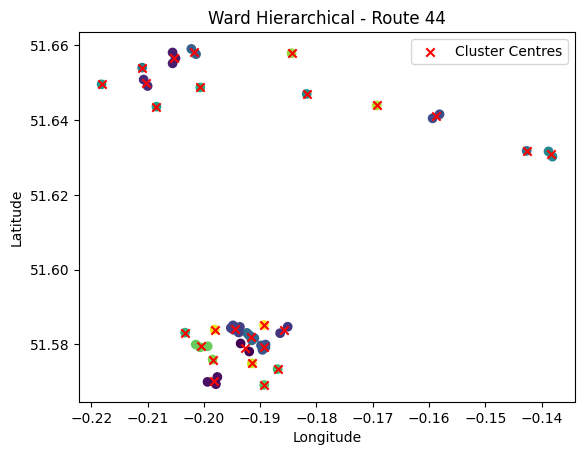

 63%|██████▎   | 44/70 [26:07<18:21, 42.38s/it]

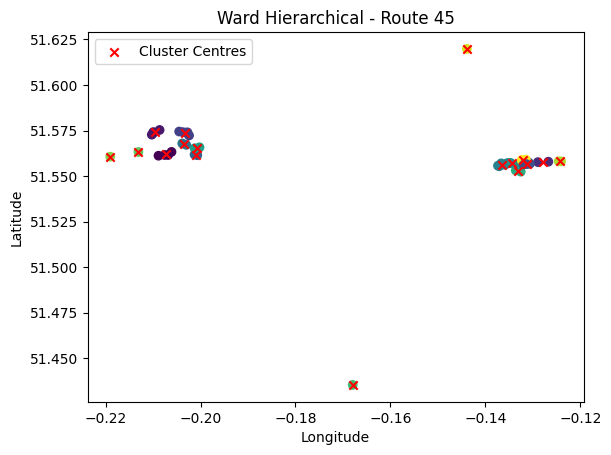

 64%|██████▍   | 45/70 [26:46<17:14, 41.39s/it]

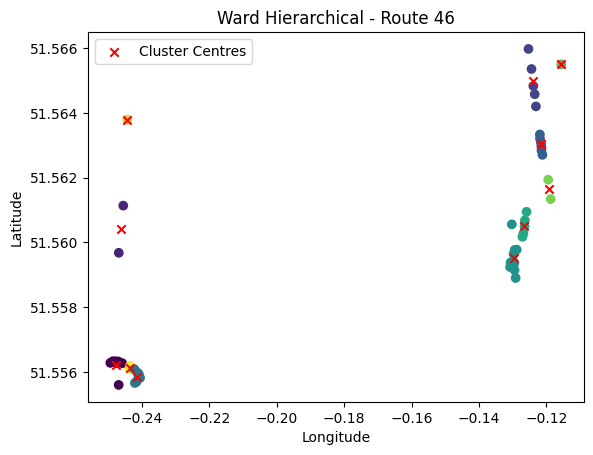

 66%|██████▌   | 46/70 [27:31<16:56, 42.37s/it]

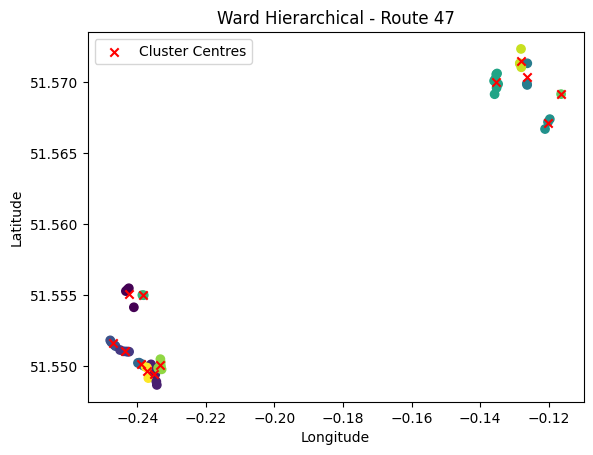

 67%|██████▋   | 47/70 [28:14<16:21, 42.67s/it]

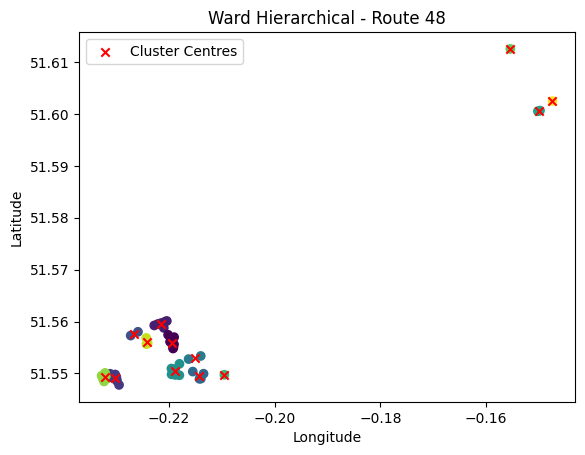

 69%|██████▊   | 48/70 [29:00<15:55, 43.42s/it]

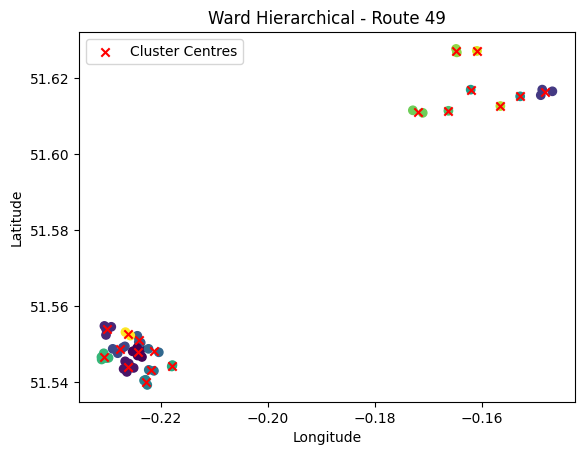

 70%|███████   | 49/70 [29:43<15:11, 43.41s/it]

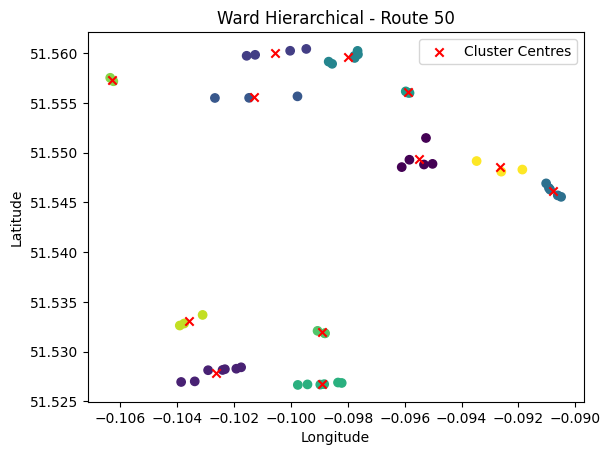

 71%|███████▏  | 50/70 [30:27<14:29, 43.46s/it]

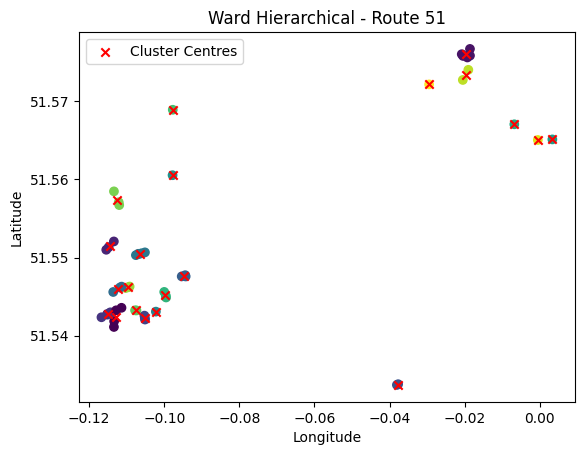

 73%|███████▎  | 51/70 [31:07<13:29, 42.63s/it]

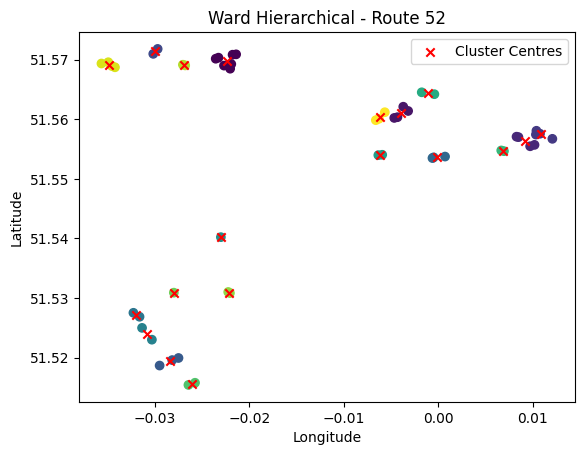

 74%|███████▍  | 52/70 [31:49<12:45, 42.51s/it]

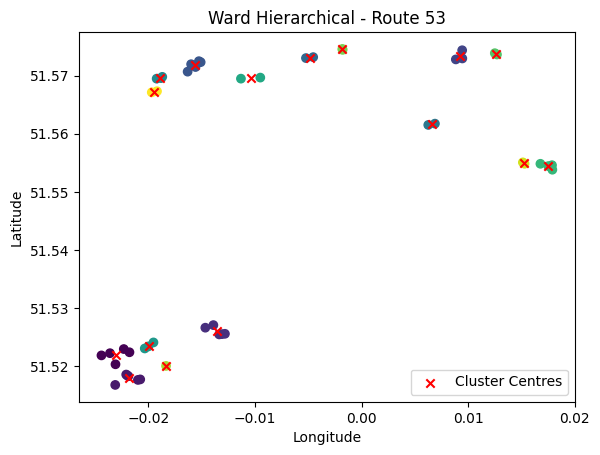

 76%|███████▌  | 53/70 [32:29<11:46, 41.57s/it]

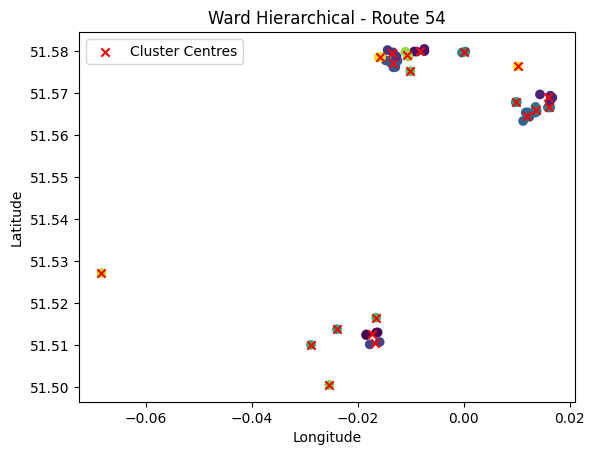

 77%|███████▋  | 54/70 [33:08<10:54, 40.89s/it]

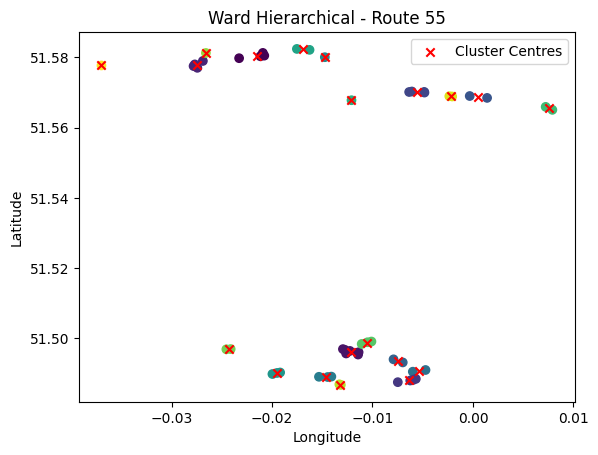

 79%|███████▊  | 55/70 [33:51<10:22, 41.53s/it]

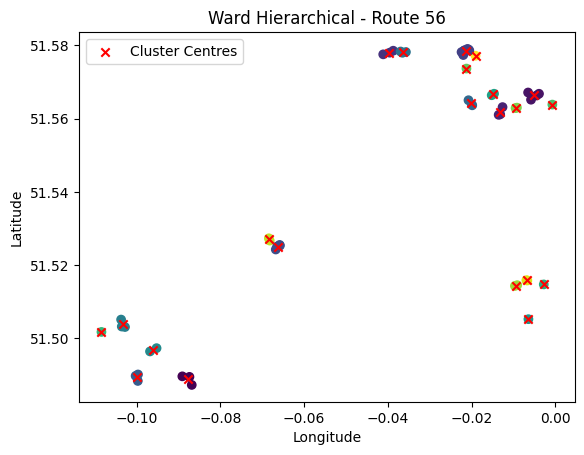

 80%|████████  | 56/70 [34:34<09:48, 42.04s/it]

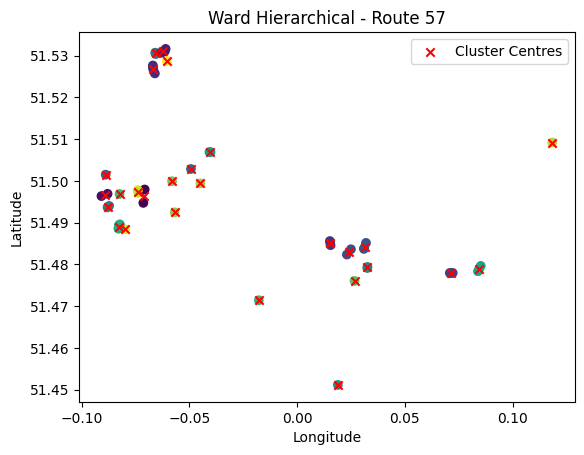

 81%|████████▏ | 57/70 [35:14<08:58, 41.45s/it]

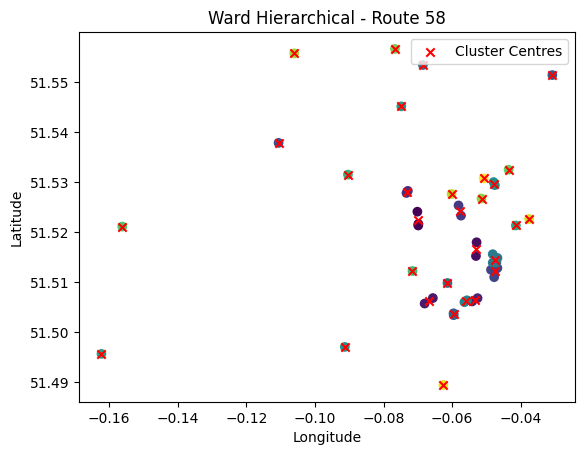

 83%|████████▎ | 58/70 [35:48<07:47, 38.95s/it]

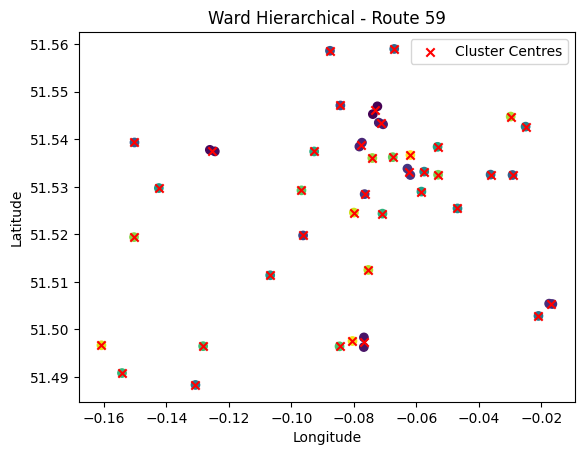

 84%|████████▍ | 59/70 [36:14<06:28, 35.31s/it]

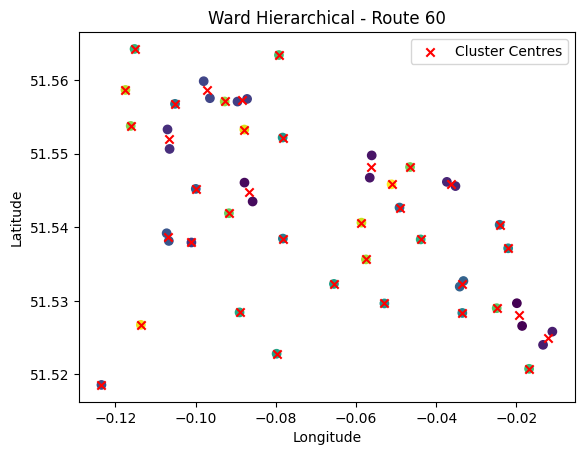

 86%|████████▌ | 60/70 [36:43<05:34, 33.40s/it]

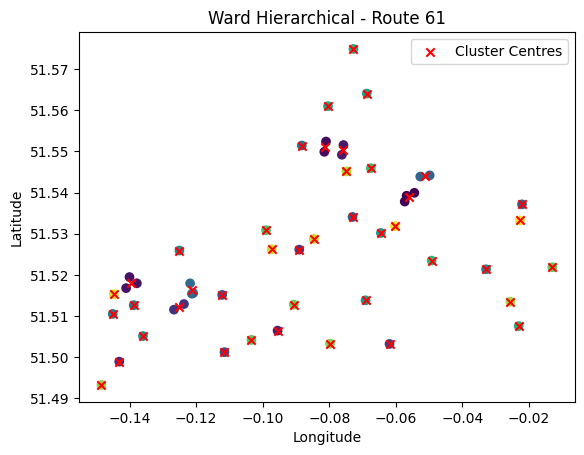

 87%|████████▋ | 61/70 [37:15<04:55, 32.88s/it]

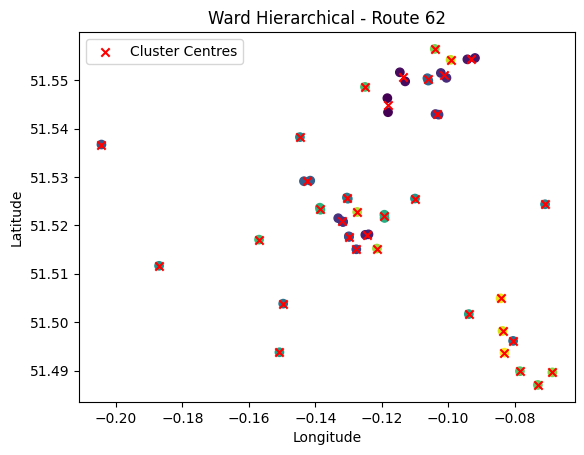

 89%|████████▊ | 62/70 [37:45<04:16, 32.06s/it]

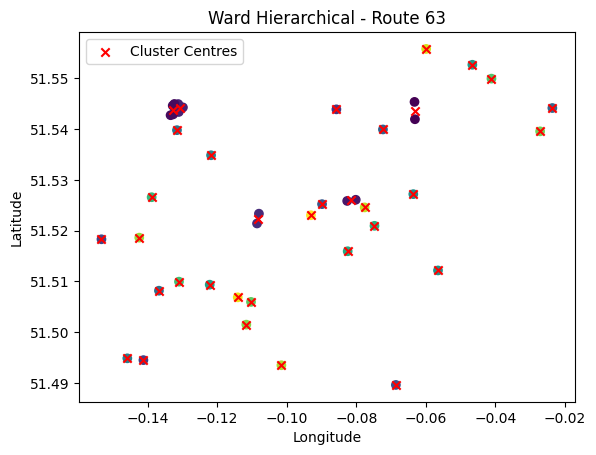

 90%|█████████ | 63/70 [38:10<03:29, 29.93s/it]

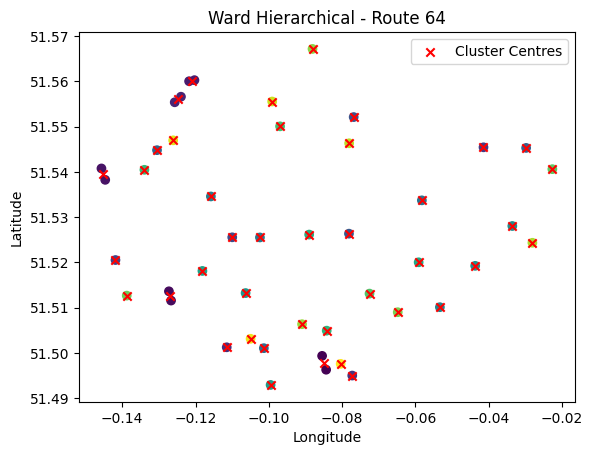

 91%|█████████▏| 64/70 [38:34<02:49, 28.21s/it]

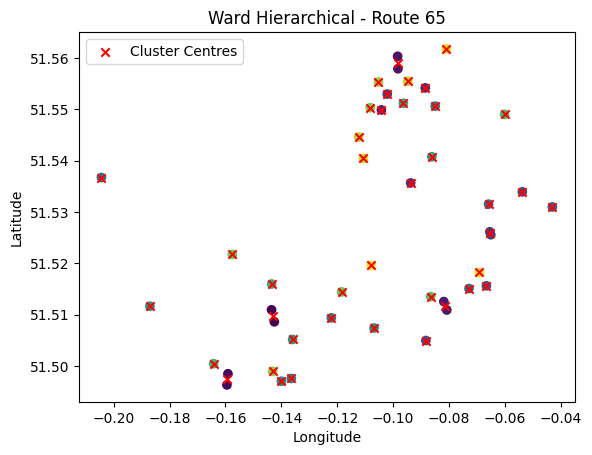

 93%|█████████▎| 65/70 [39:02<02:19, 27.93s/it]

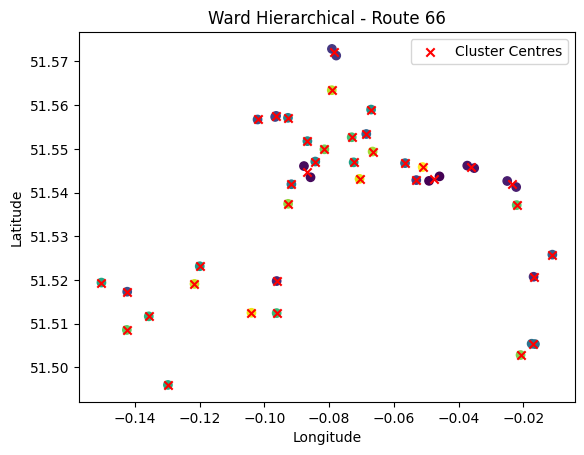

 94%|█████████▍| 66/70 [39:28<01:50, 27.61s/it]

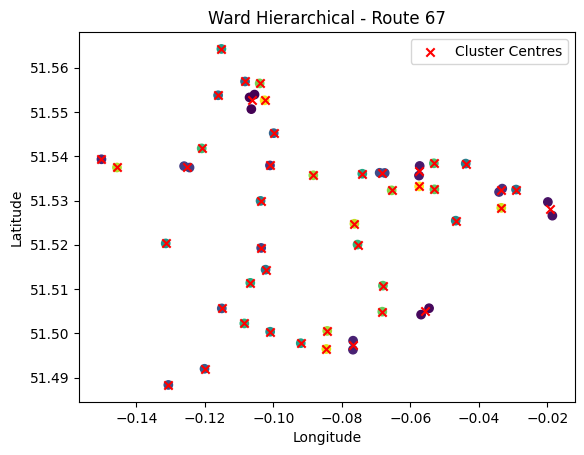

 96%|█████████▌| 67/70 [40:00<01:26, 28.89s/it]

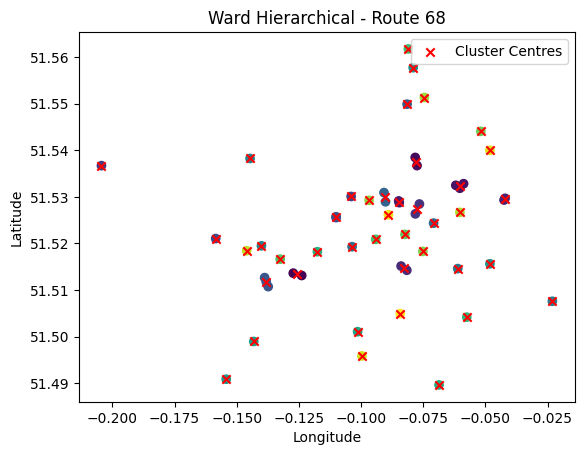

 97%|█████████▋| 68/70 [40:34<01:00, 30.43s/it]

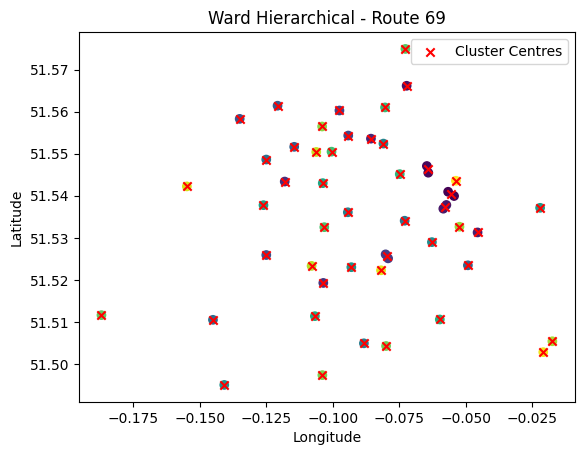

 99%|█████████▊| 69/70 [41:02<00:29, 29.52s/it]

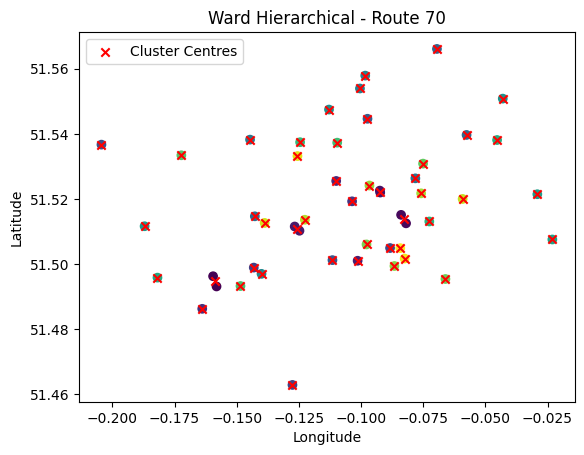

100%|██████████| 70/70 [41:30<00:00, 35.58s/it]


In [ ]:
ward_h_results = pd.DataFrame()
for i in tqdm(range(len(route_list))):
  test_route = route_list[i]
  ward_h = ward_h_operate(i,test_route)

  ward_h_results = pd.concat([ward_h_results,ward_h], ignore_index=True)

ward_h_table = results_path + "Ward_H_results.csv"
ward_h_results.to_csv(ward_h_table)

  0%|          | 0/70 [00:00<?, ?it/s]

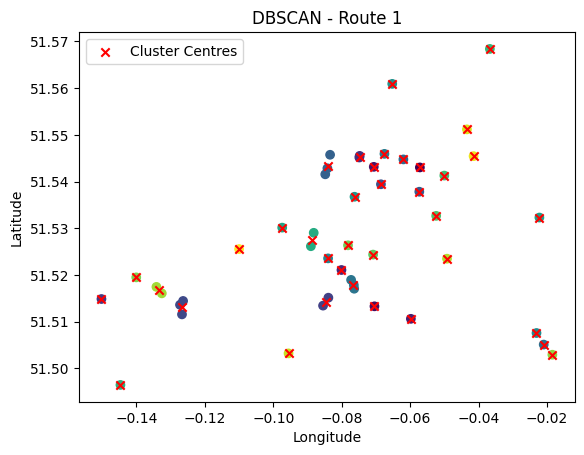

  1%|▏         | 1/70 [00:30<35:09, 30.57s/it]

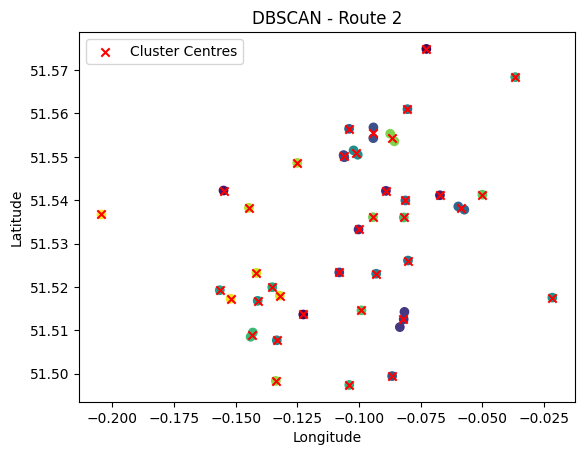

  3%|▎         | 2/70 [01:01<34:53, 30.79s/it]

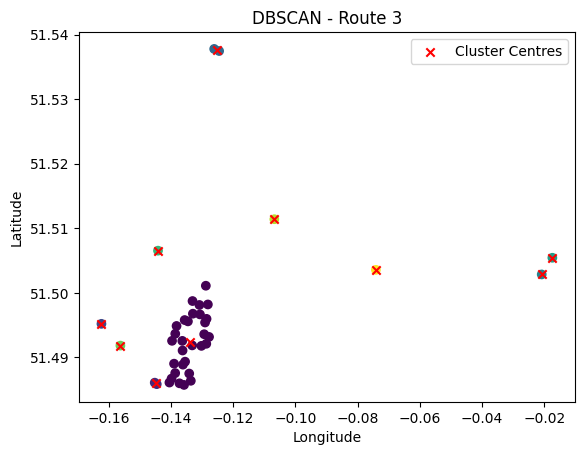

  4%|▍         | 3/70 [01:42<39:24, 35.30s/it]

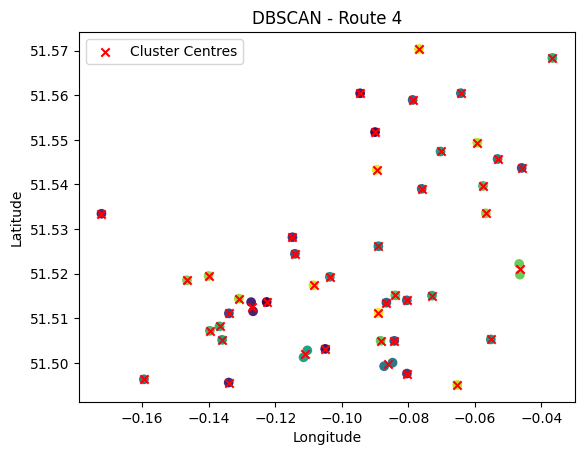

  6%|▌         | 4/70 [02:12<36:31, 33.21s/it]

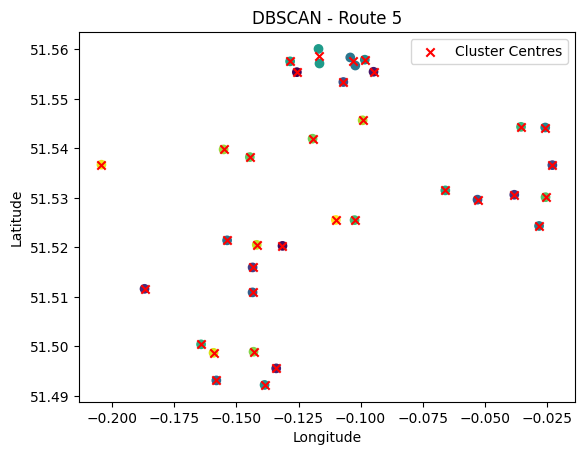

  7%|▋         | 5/70 [02:32<30:56, 28.56s/it]

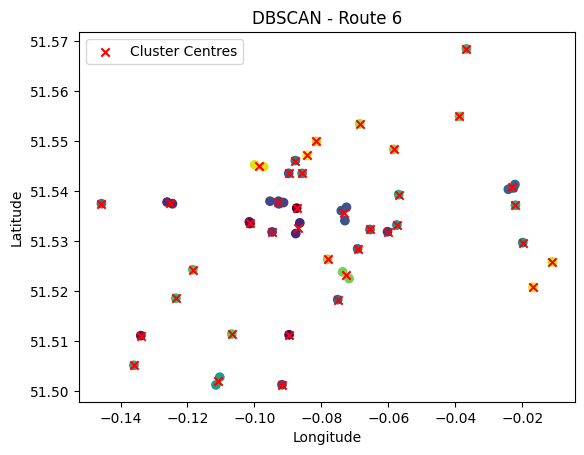

  9%|▊         | 6/70 [03:07<32:54, 30.85s/it]

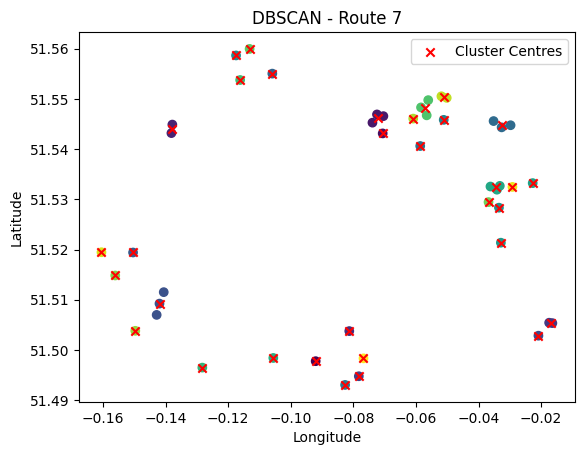

 10%|█         | 7/70 [03:38<32:19, 30.79s/it]

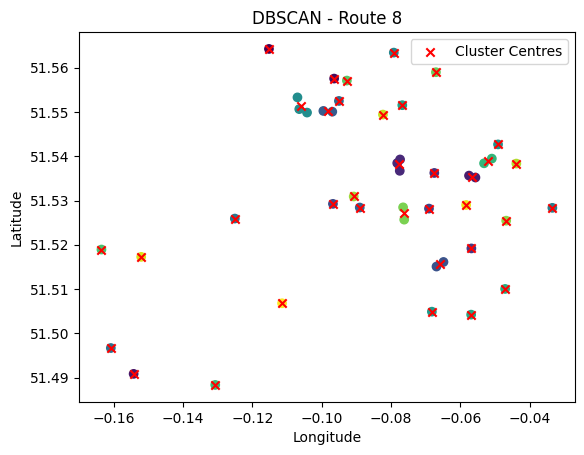

 11%|█▏        | 8/70 [04:04<30:19, 29.35s/it]

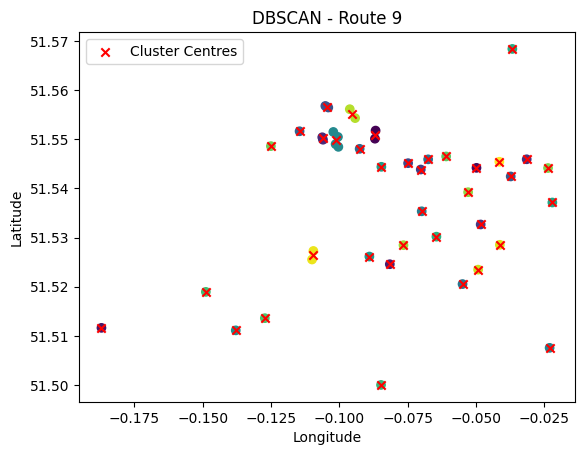

 13%|█▎        | 9/70 [04:31<28:58, 28.50s/it]

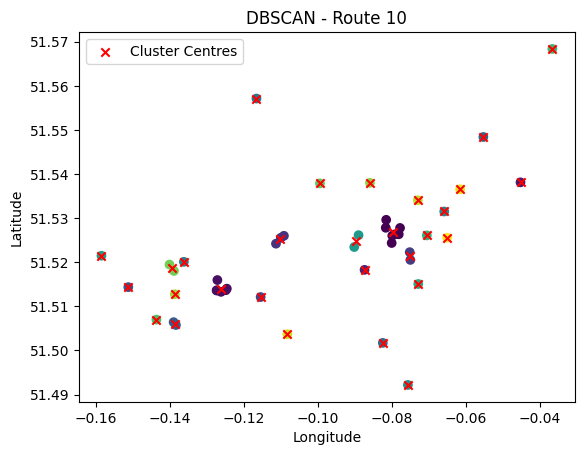

 14%|█▍        | 10/70 [05:04<29:50, 29.83s/it]

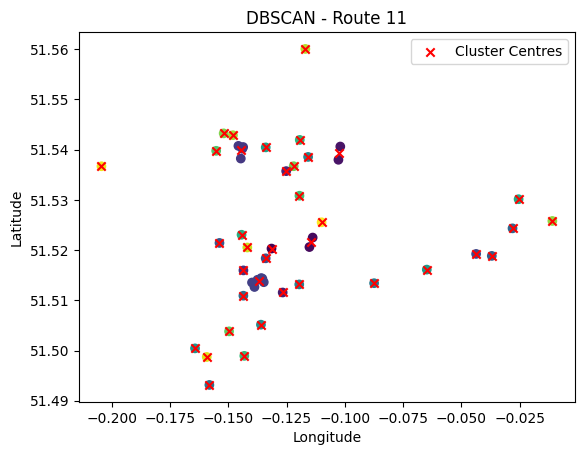

 16%|█▌        | 11/70 [05:34<29:29, 30.00s/it]

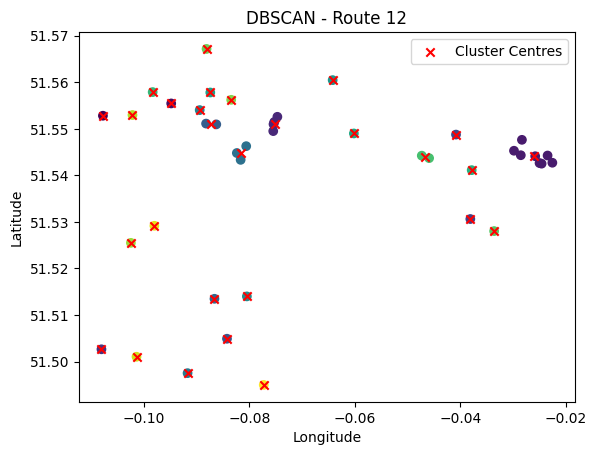

 17%|█▋        | 12/70 [06:02<28:27, 29.44s/it]

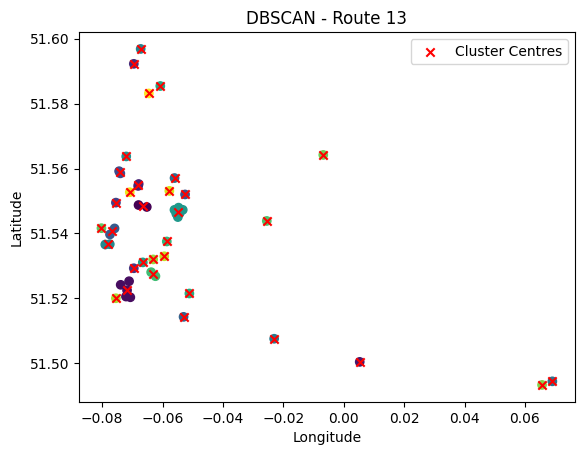

 19%|█▊        | 13/70 [06:36<29:11, 30.73s/it]

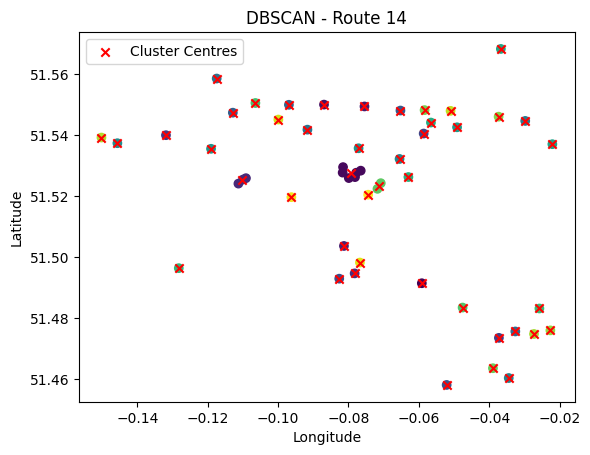

 20%|██        | 14/70 [07:08<29:08, 31.22s/it]

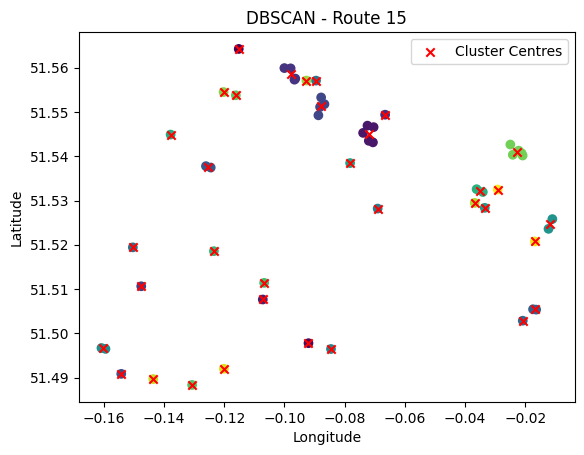

 21%|██▏       | 15/70 [07:45<30:16, 33.02s/it]

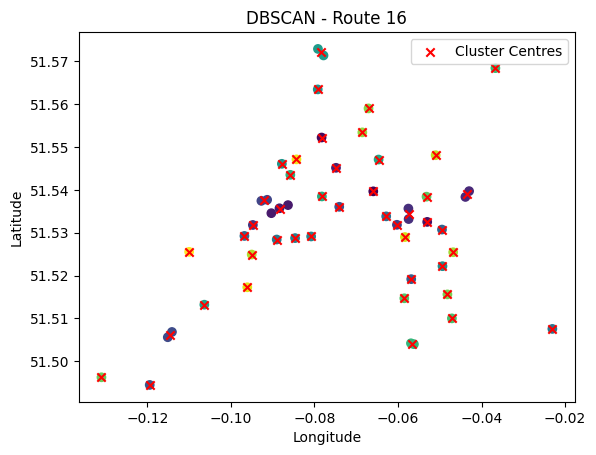

 23%|██▎       | 16/70 [08:17<29:20, 32.61s/it]

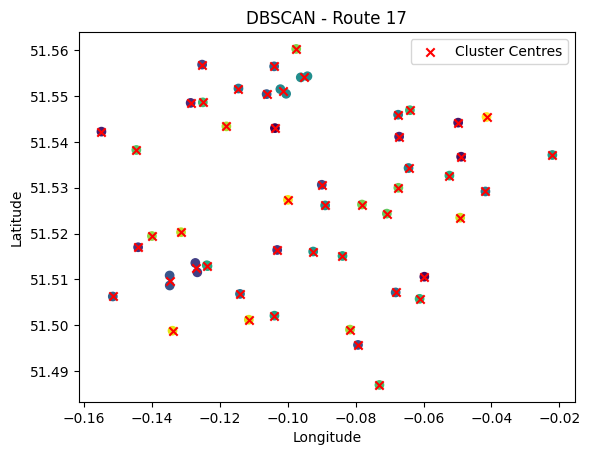

 24%|██▍       | 17/70 [08:49<28:35, 32.37s/it]

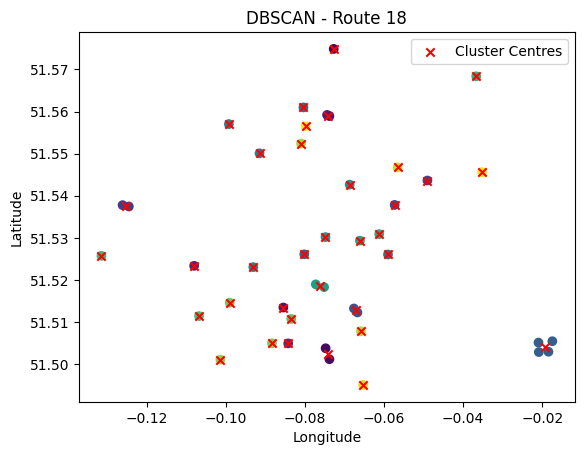

 26%|██▌       | 18/70 [09:13<25:59, 30.00s/it]

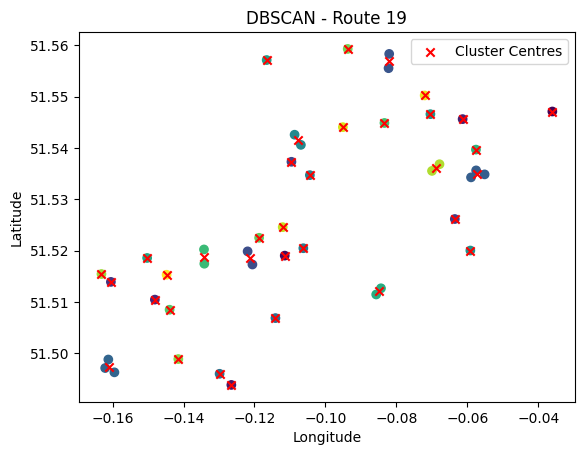

 27%|██▋       | 19/70 [09:41<24:53, 29.28s/it]

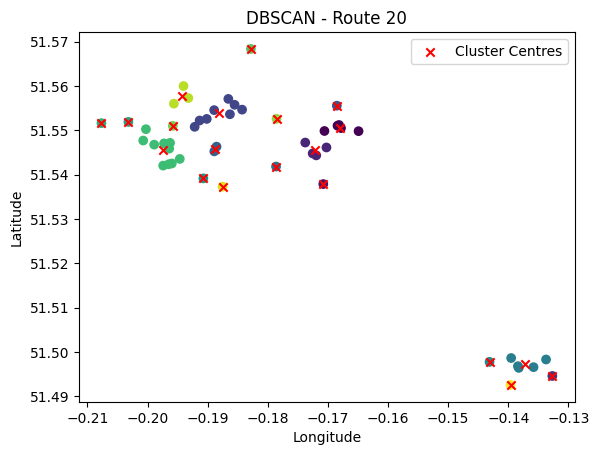

 29%|██▊       | 20/70 [10:21<27:00, 32.42s/it]

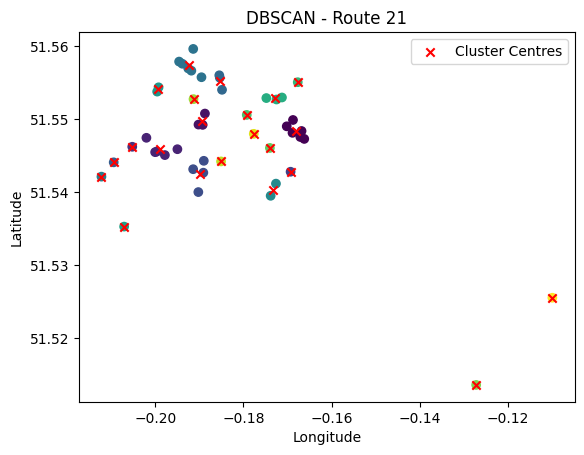

 30%|███       | 21/70 [10:56<27:13, 33.35s/it]

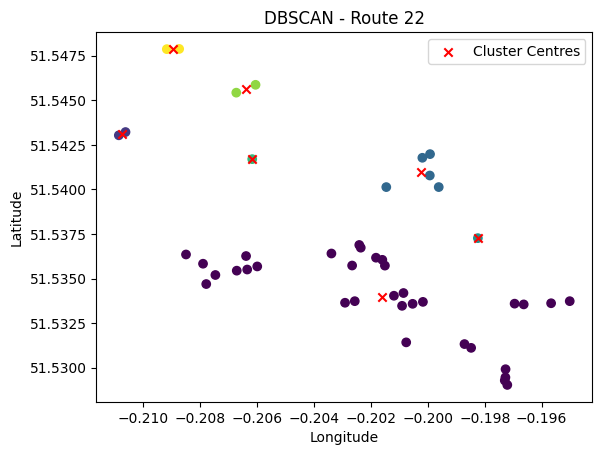

 31%|███▏      | 22/70 [11:38<28:46, 35.97s/it]

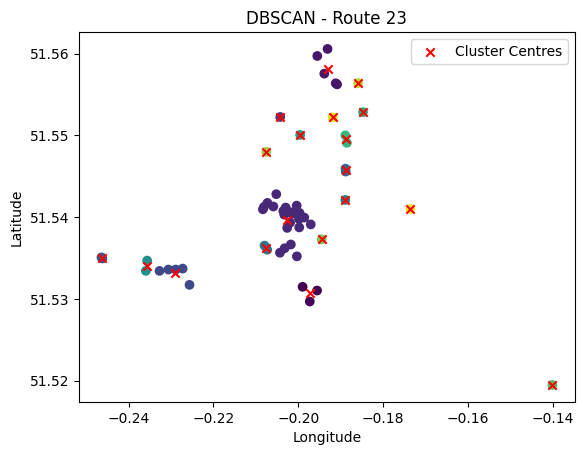

 33%|███▎      | 23/70 [12:22<29:54, 38.18s/it]

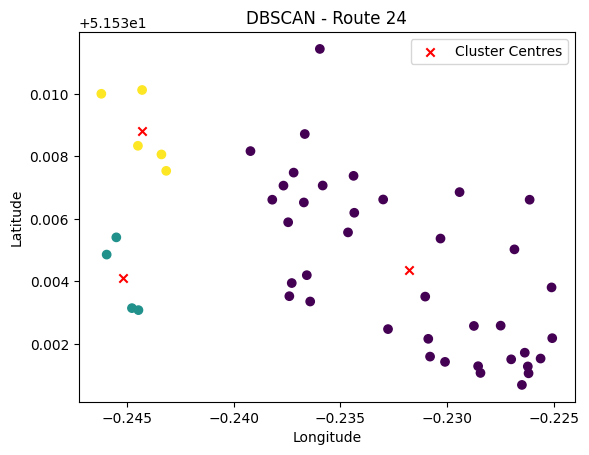

 34%|███▍      | 24/70 [13:05<30:21, 39.59s/it]

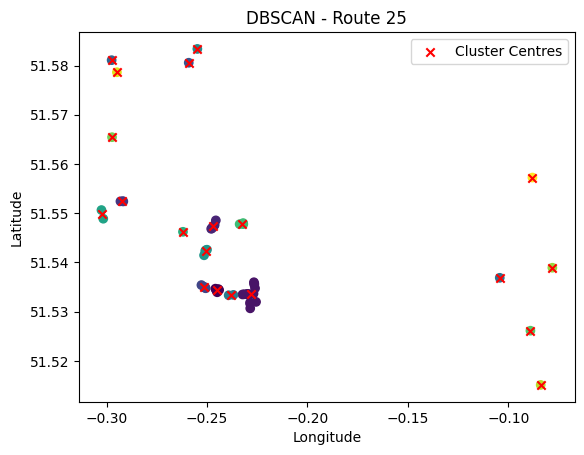

 36%|███▌      | 25/70 [13:52<31:33, 42.09s/it]

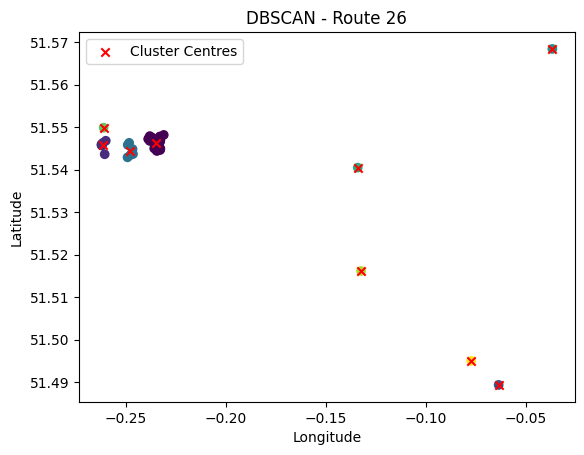

 37%|███▋      | 26/70 [14:59<36:16, 49.47s/it]

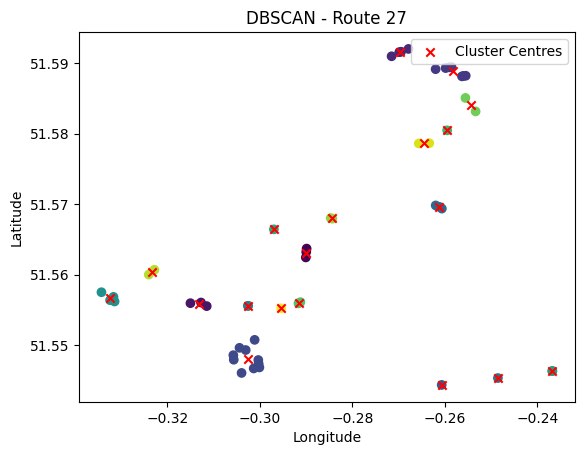

 39%|███▊      | 27/70 [15:43<34:14, 47.78s/it]

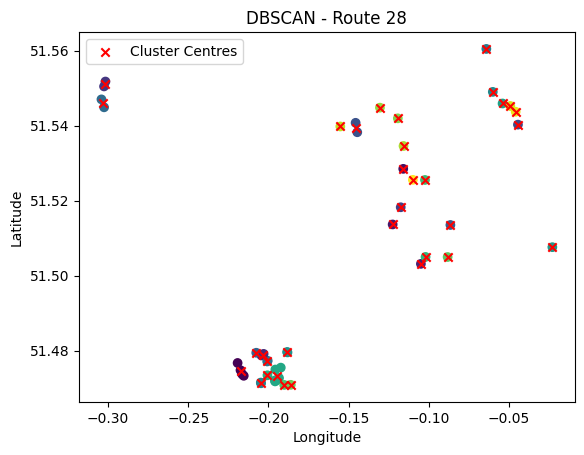

 40%|████      | 28/70 [16:18<30:40, 43.82s/it]

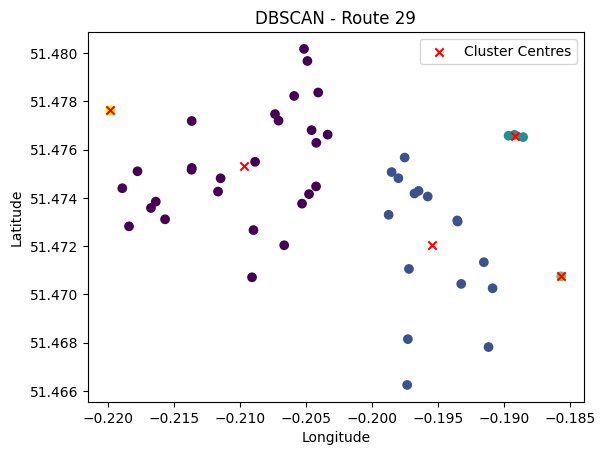

 41%|████▏     | 29/70 [17:03<30:10, 44.16s/it]

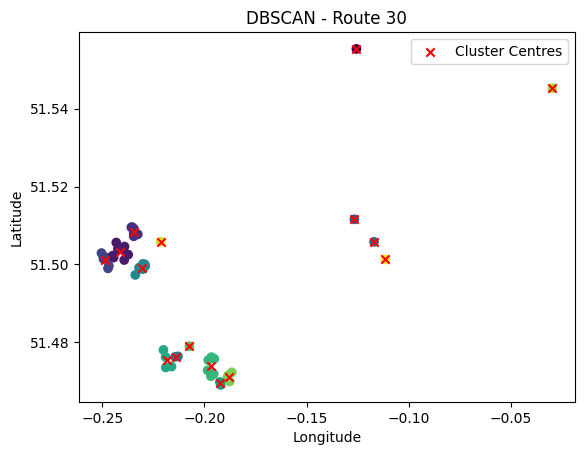

 43%|████▎     | 30/70 [17:49<29:48, 44.72s/it]

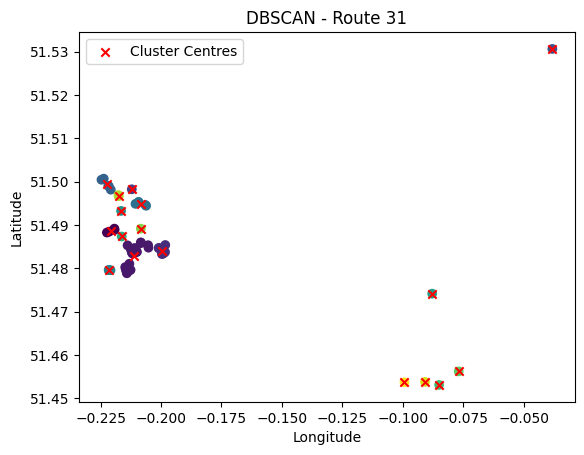

 44%|████▍     | 31/70 [18:36<29:40, 45.65s/it]

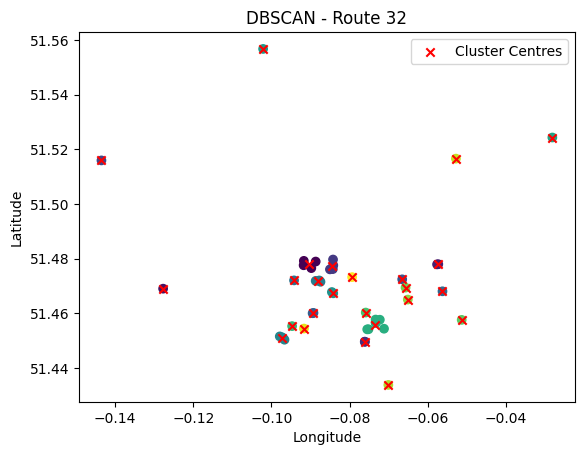

 46%|████▌     | 32/70 [19:09<26:31, 41.89s/it]

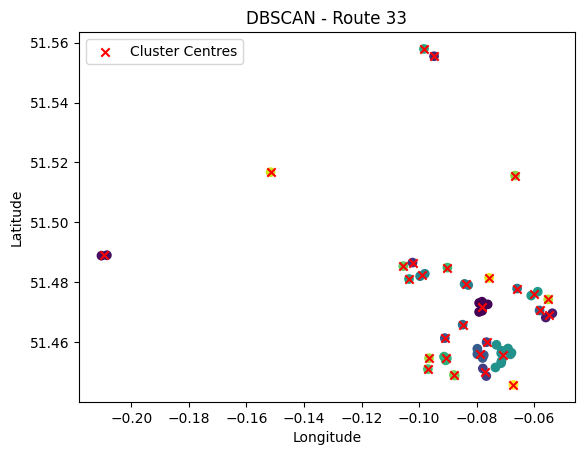

 47%|████▋     | 33/70 [19:47<24:55, 40.43s/it]

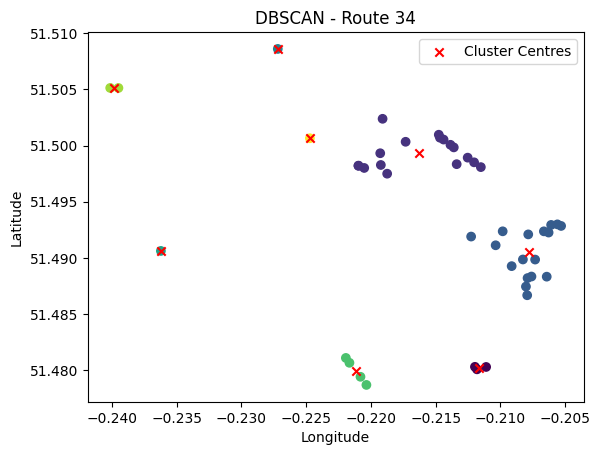

 49%|████▊     | 34/70 [20:29<24:38, 41.07s/it]

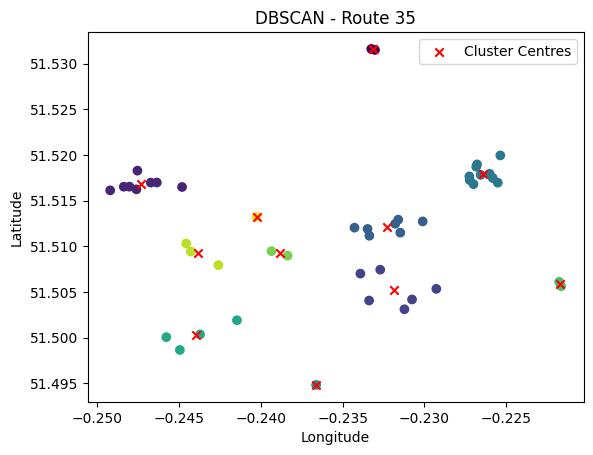

 50%|█████     | 35/70 [21:08<23:29, 40.28s/it]

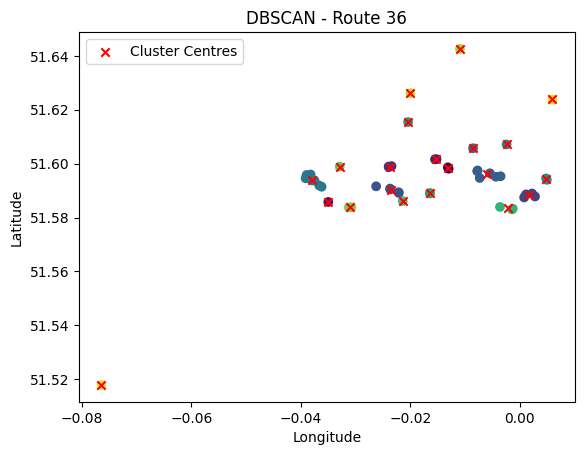

 51%|█████▏    | 36/70 [21:45<22:23, 39.53s/it]

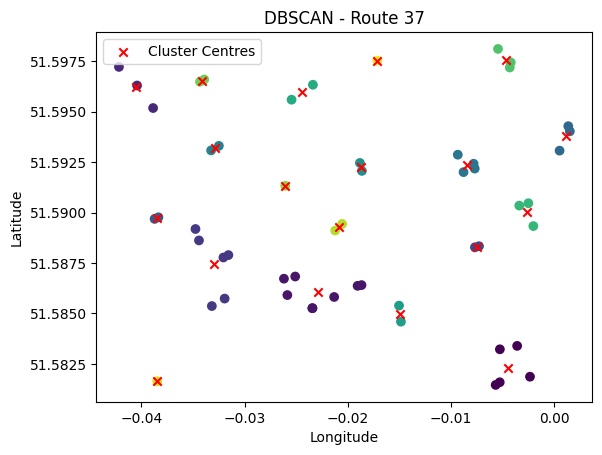

 53%|█████▎    | 37/70 [22:32<23:00, 41.82s/it]

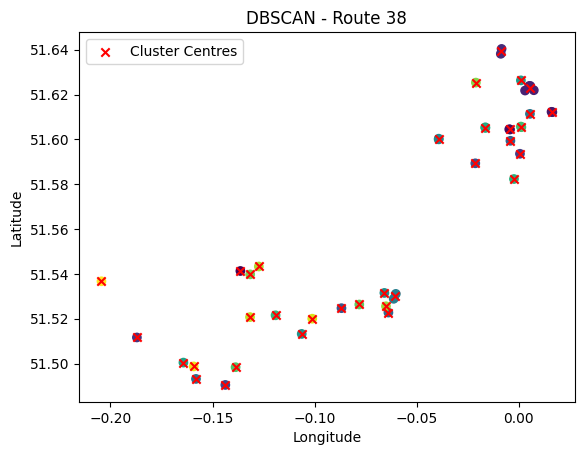

 54%|█████▍    | 38/70 [23:01<20:10, 37.83s/it]

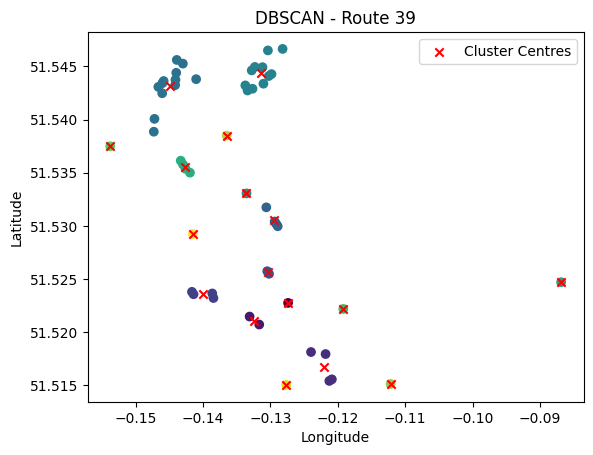

 56%|█████▌    | 39/70 [23:44<20:24, 39.49s/it]

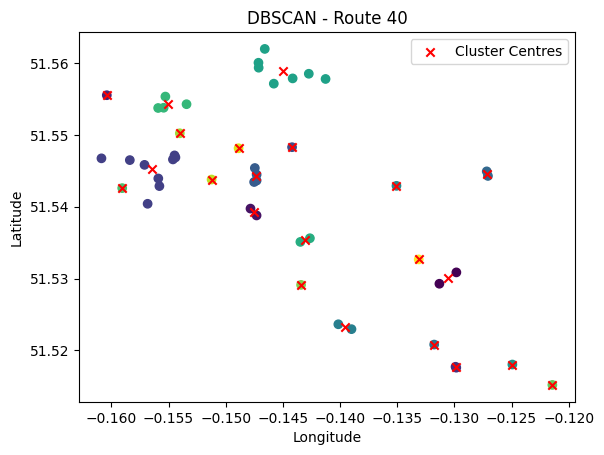

 57%|█████▋    | 40/70 [24:21<19:16, 38.56s/it]

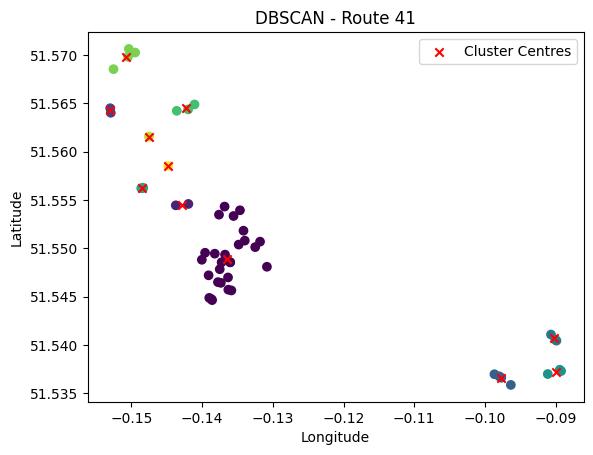

 59%|█████▊    | 41/70 [25:05<19:27, 40.26s/it]

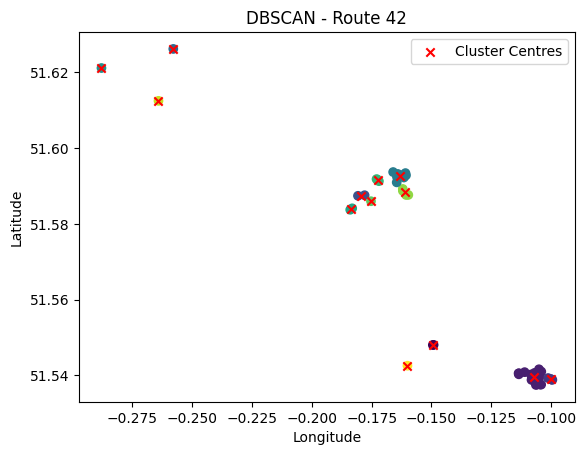

 60%|██████    | 42/70 [25:53<19:51, 42.54s/it]

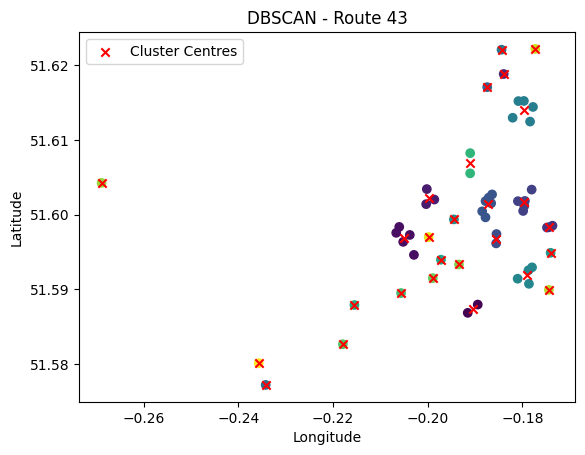

 61%|██████▏   | 43/70 [26:34<18:56, 42.09s/it]

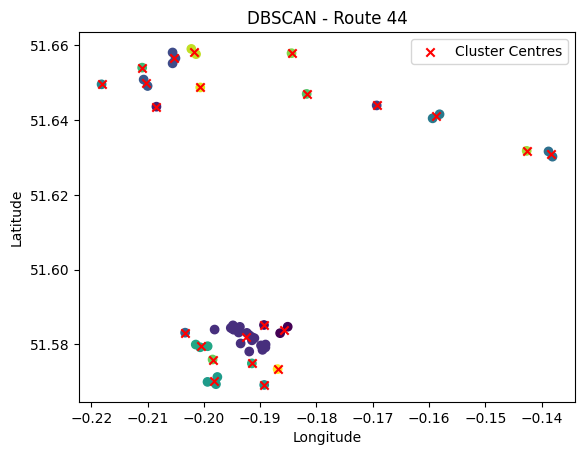

 63%|██████▎   | 44/70 [27:14<17:55, 41.36s/it]

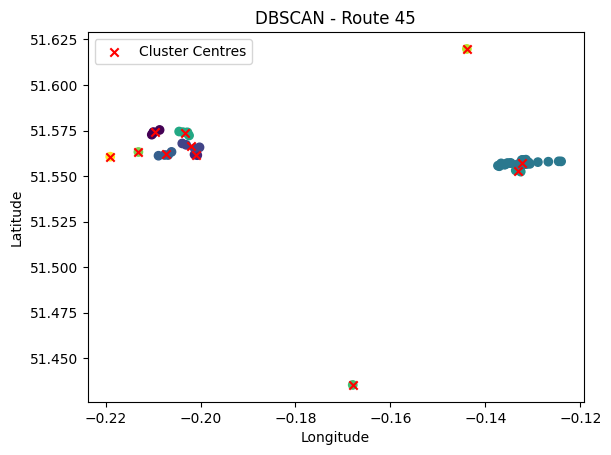

 64%|██████▍   | 45/70 [27:54<17:06, 41.06s/it]

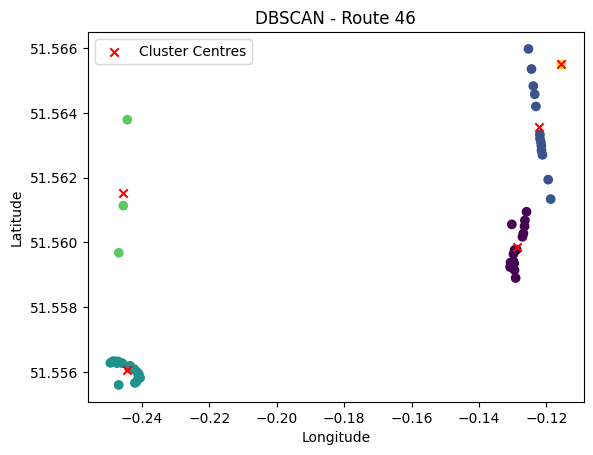

 66%|██████▌   | 46/70 [28:37<16:39, 41.65s/it]

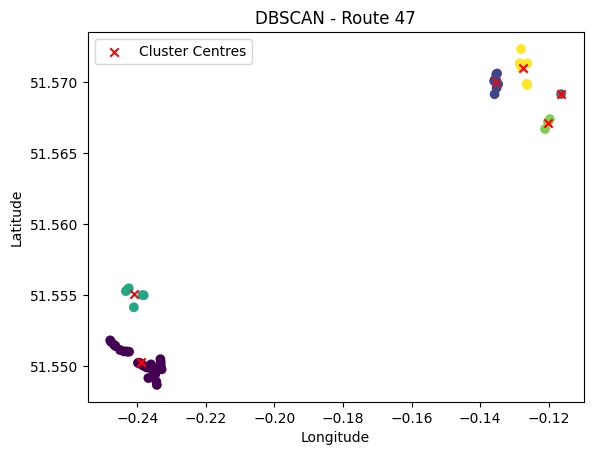

 67%|██████▋   | 47/70 [29:24<16:32, 43.15s/it]

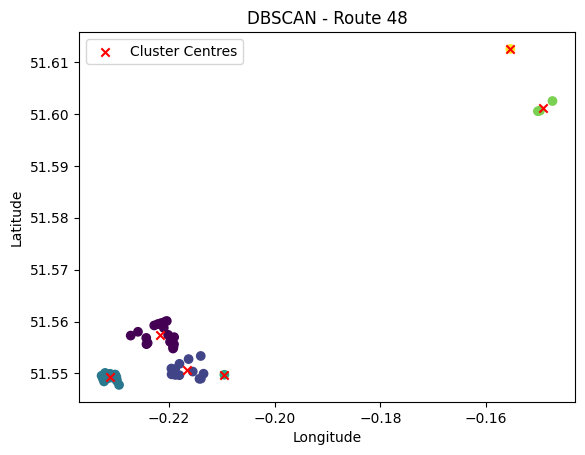

 69%|██████▊   | 48/70 [30:12<16:24, 44.75s/it]

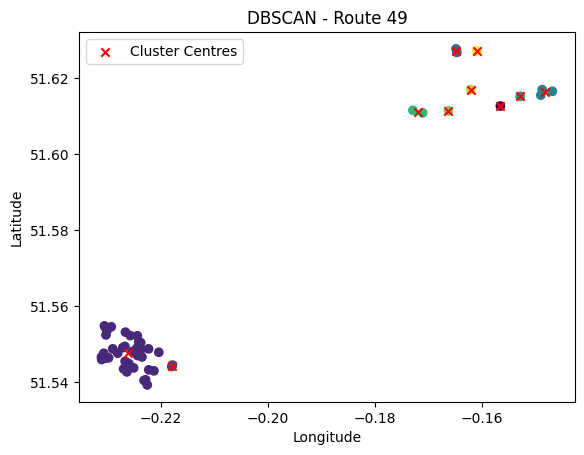

 70%|███████   | 49/70 [30:58<15:47, 45.14s/it]

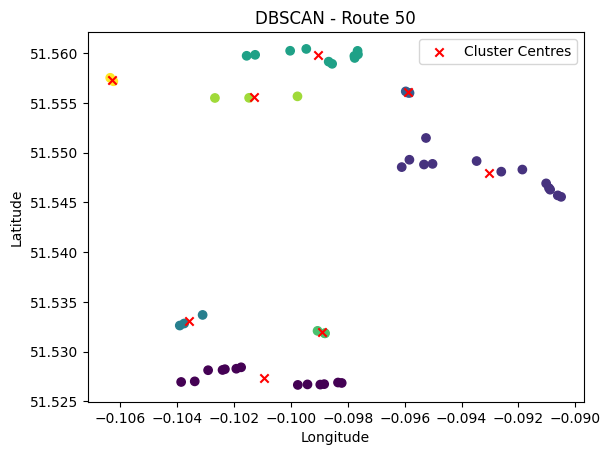

 71%|███████▏  | 50/70 [31:42<14:54, 44.74s/it]

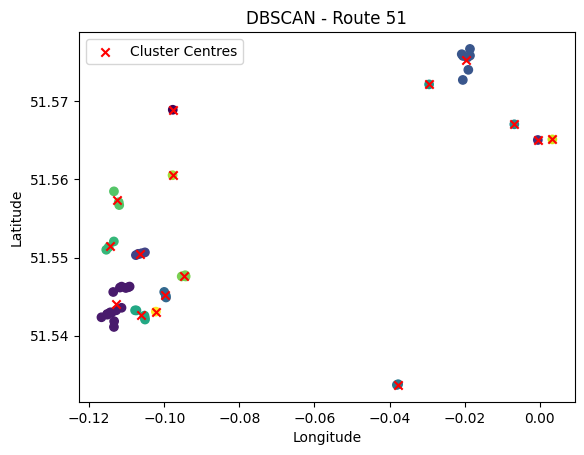

 73%|███████▎  | 51/70 [32:26<14:05, 44.51s/it]

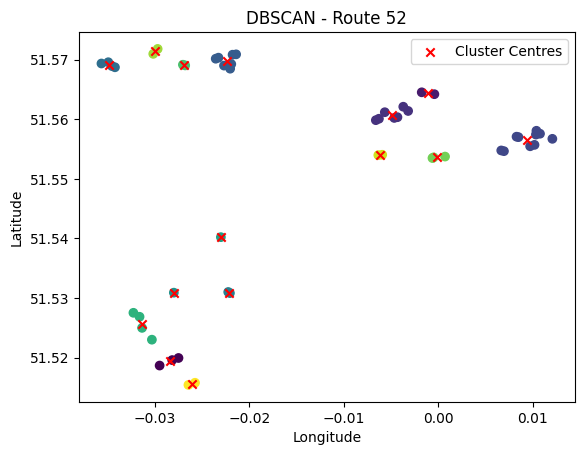

 74%|███████▍  | 52/70 [33:09<13:13, 44.07s/it]

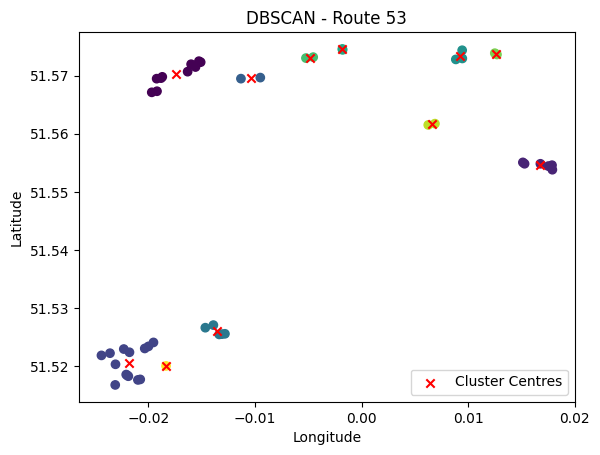

 76%|███████▌  | 53/70 [33:50<12:11, 43.04s/it]

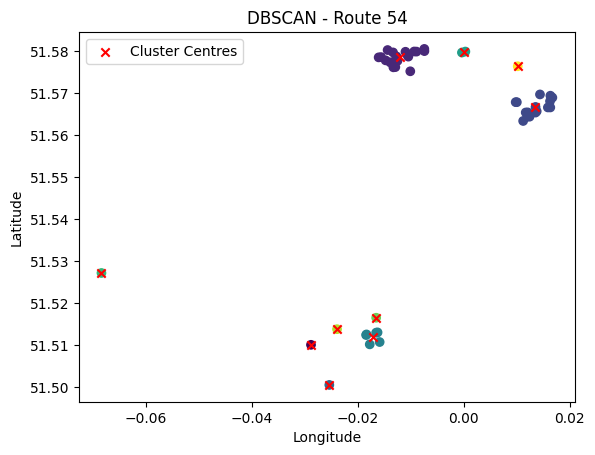

 77%|███████▋  | 54/70 [34:31<11:23, 42.71s/it]

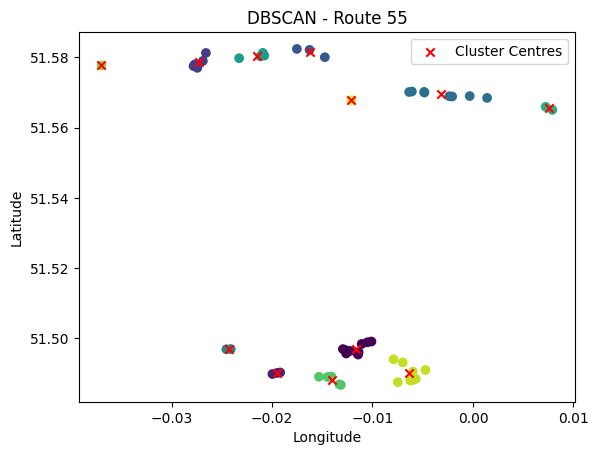

 79%|███████▊  | 55/70 [35:18<10:58, 43.92s/it]

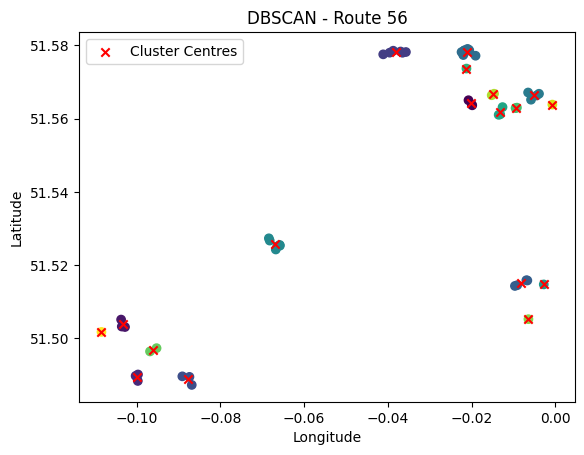

 80%|████████  | 56/70 [36:03<10:18, 44.18s/it]

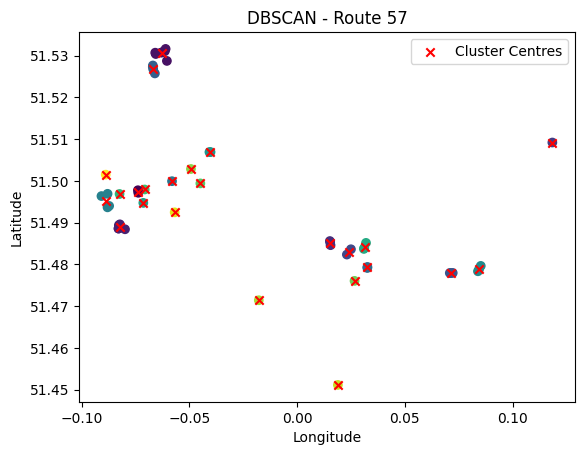

 81%|████████▏ | 57/70 [36:42<09:14, 42.62s/it]

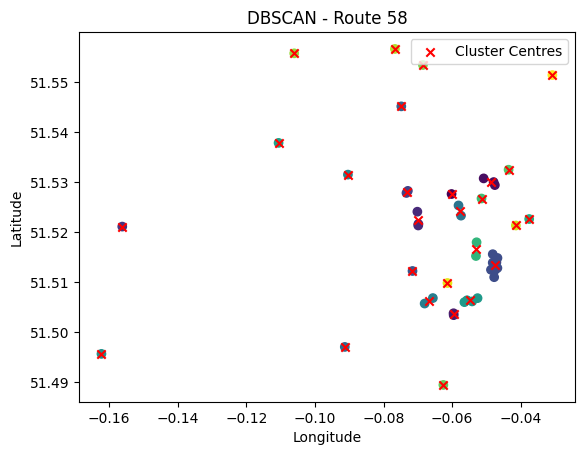

 83%|████████▎ | 58/70 [37:17<08:04, 40.34s/it]

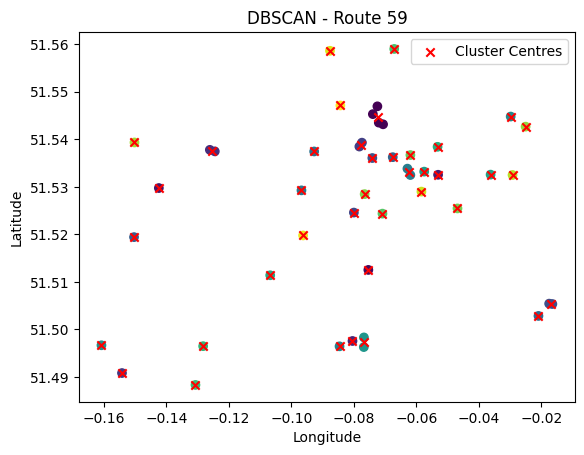

 84%|████████▍ | 59/70 [37:46<06:47, 37.01s/it]

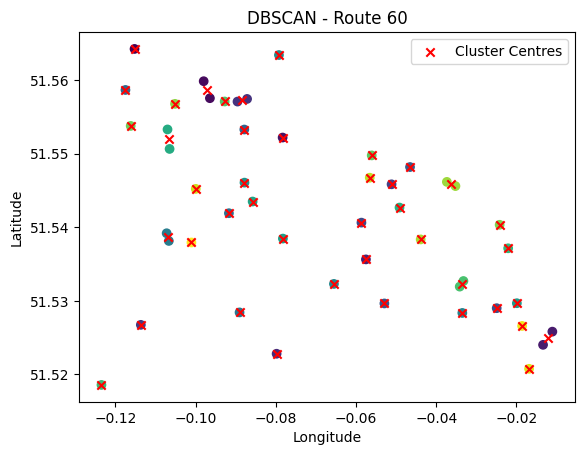

 86%|████████▌ | 60/70 [38:15<05:45, 34.60s/it]

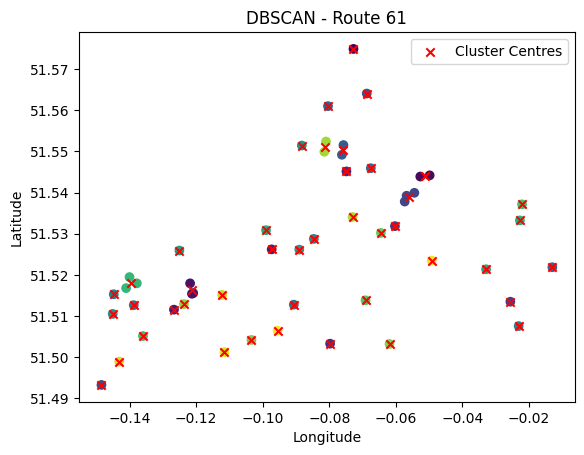

 87%|████████▋ | 61/70 [38:46<04:59, 33.33s/it]

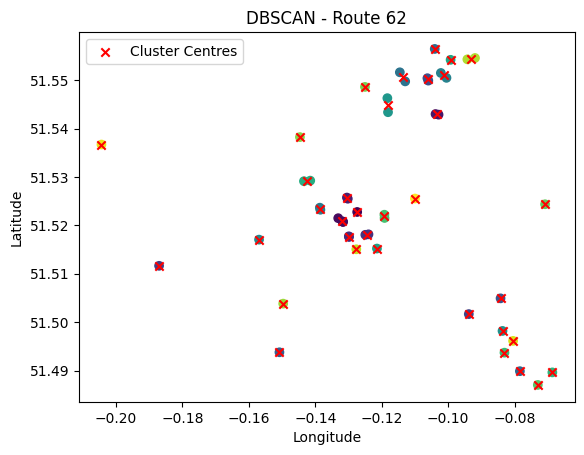

 89%|████████▊ | 62/70 [39:17<04:22, 32.79s/it]

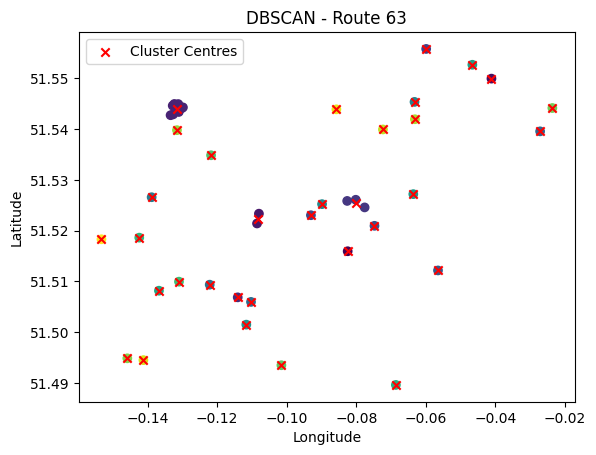

 90%|█████████ | 63/70 [39:44<03:36, 30.91s/it]

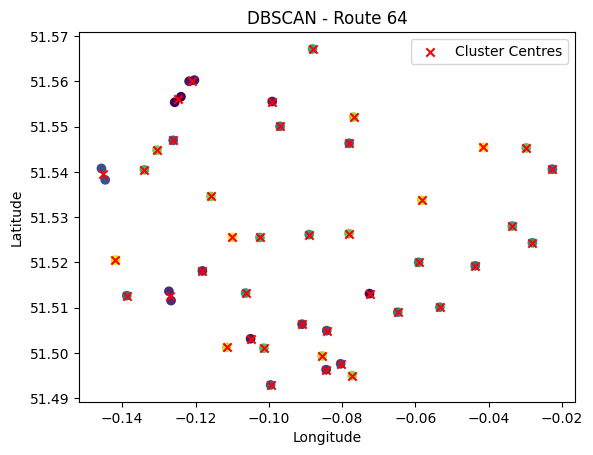

 91%|█████████▏| 64/70 [40:10<02:56, 29.44s/it]

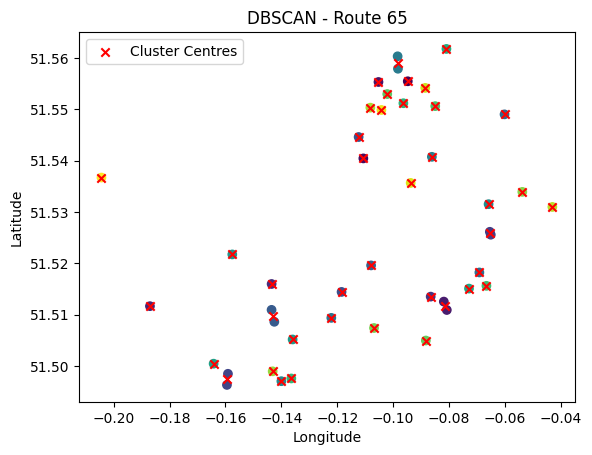

 93%|█████████▎| 65/70 [40:36<02:22, 28.58s/it]

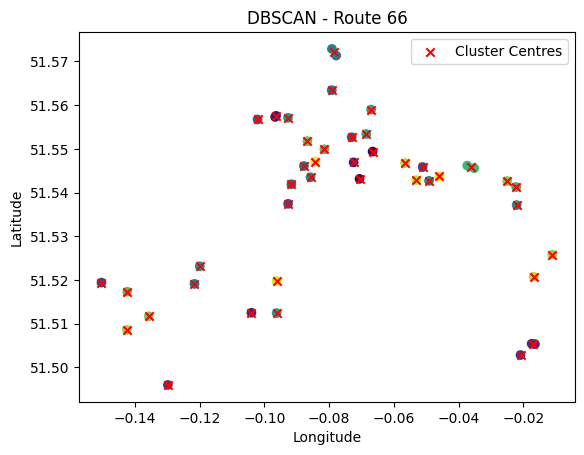

 94%|█████████▍| 66/70 [41:00<01:48, 27.22s/it]

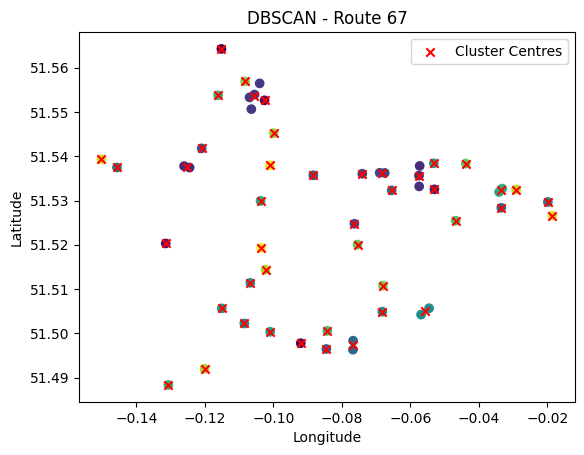

 96%|█████████▌| 67/70 [41:31<01:24, 28.25s/it]

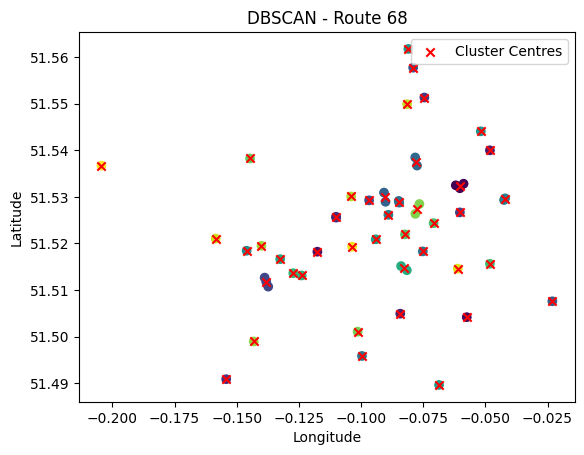

 97%|█████████▋| 68/70 [42:06<01:00, 30.43s/it]

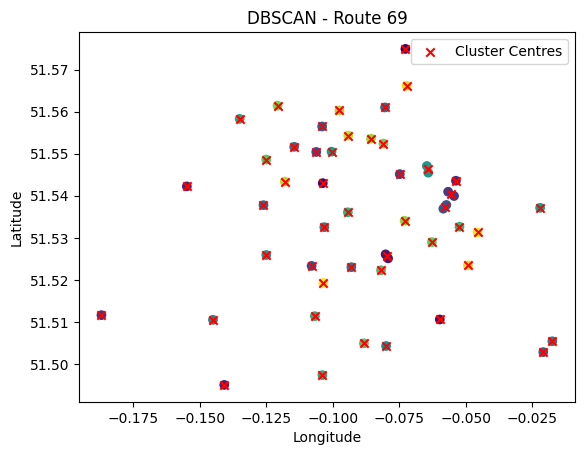

 99%|█████████▊| 69/70 [42:33<00:29, 29.31s/it]

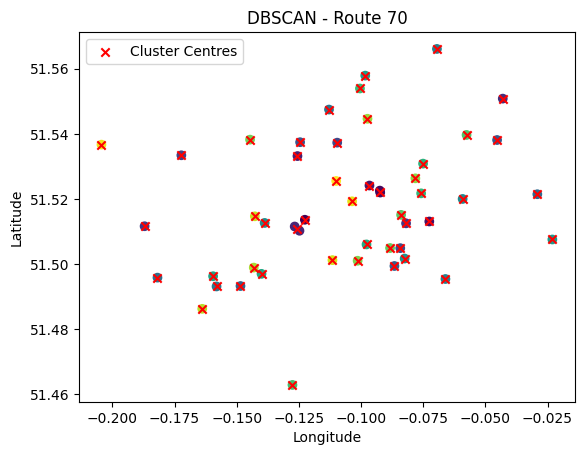

100%|██████████| 70/70 [43:00<00:00, 36.86s/it]


In [ ]:
dbscan_results = pd.DataFrame()
for i in tqdm(range(len(route_list))):
  test_route = route_list[i]
  dbscan = dbscan_operate(i,test_route)

  dbscan_results = pd.concat([dbscan_results,dbscan], ignore_index=True)

dbscan_table = results_path + "DBSCAN_results.csv"
dbscan_results.to_csv(dbscan_table)

In [ ]:
meanshift_results

,Route ID,Total Distance,Number of Locations,Cluster total Distance,Cluster Distances,Number of Clusters,Number of MP Clusters,Number of points in MP Clusters,Compute Time,Route,Clusters Centers,Cluster Point Lists
0,1,125598.0,47,53179.0,"[6911.0, 14570, 3156, 2384, 768, 1337, 2613, 1...",17,9,"[8, 10, 4, 5, 2, 3, 3, 2, 2]",46.236171,"[(51.543014, -0.0571437), (51.51328705, -0.070...","[[51.54263861948052, -0.0760744329004329], [51...","[[(51.54314, -0.07062), (51.5454869, -0.074740..."
1,2,125054.0,46,44176.0,"[14681, 2636, 4316, 4799, 2213, 2471, 5130, 14...",16,9,"[9, 5, 5, 4, 4, 4, 4, 2, 2]",45.531749,"[(51.57489, -0.07271), (51.513634, -0.122582),...","[[51.515106465624996, -0.140274525], [51.55283...","[[(51.513634, -0.122582), (51.5076899, -0.1333..."
2,3,81400.0,41,35434.0,"[31949, 134, 467, 721]",7,4,"[32, 2, 2, 2]",40.801851,"[(51.49666, -0.13066), (51.48586, -0.14454), (...","[[51.49212873103448, -0.13418673448275864], [5...","[[(51.49666, -0.13066), (51.48586, -0.14454), ..."
3,4,146485.0,49,65727.0,"[11152, 17983, 2769, 2218, 1699, 2285, 3801, 8...",16,12,"[9, 10, 4, 4, 2, 2, 3, 3, 2, 2, 2, 2]",46.589383,"[(51.513634, -0.122582), (51.55175, -0.09), (5...","[[51.511329825, -0.133903175], [51.50787203541...","[[(51.513634, -0.122582), (51.51156, -0.12667)..."
4,5,94408.0,36,27135.0,"[4487, 3855, 2138, 2732, 1726, 866, 3543, 649]",19,8,"[5, 4, 3, 3, 3, 2, 3, 2]",29.900945,"[(51.55538, -0.12567), (51.52031, -0.13146), (...","[[51.55636382, -0.10126664], [51.5575338999999...","[[(51.5554599, -0.09479), (51.55339, -0.10695)..."
...,...,...,...,...,...,...,...,...,...,...,...,...
65,66,98108.0,45,31730.0,"[6109, 5389, 3127, 1838, 1724, 1588, 2225, 952...",15,12,"[7, 6, 5, 4, 3, 3, 3, 3, 2, 2, 2, 2]",37.290554,"[(51.54939, -0.06658), (51.54314, -0.07062), (...","[[51.54670918333334, -0.0862849], [51.552272, ...","[[(51.53743, -0.09269), (51.54191, -0.09167), ..."
66,67,126847.0,54,49839.0,"[10513, 7483, 1649, 2579, 5450, 7851.0, 2780, ...",15,14,"[8, 9, 3, 4, 4, 6, 4, 3, 2, 2, 2, 2, 2, 2]",46.332410,"[(51.56425, -0.1152), (51.49777, -0.09203), (5...","[[51.55395295714286, -0.10714835714285716], [5...","[[(51.56425, -0.1152), (51.5526399, -0.10259),..."
67,68,153600.0,54,66090.0,"[18836, 9116, 10313, 3346, 3350.0, 6170, 1367,...",15,9,"[12, 7, 9, 5, 4, 4, 2, 3, 2]",45.591607,"[(51.53282, -0.05876), (51.5041617, -0.0574798...","[[51.528202358968265, -0.08150376214285714], [...","[[(51.52894, -0.0901499), (51.53671, -0.077479..."
68,69,158580.0,51,70923.0,"[13812, 3166, 2723, 5475, 7215, 946, 9155, 214...",15,12,"[11, 4, 3, 4, 5, 3, 5, 2, 3, 4, 2, 2]",41.706711,"[(51.57489, -0.07271), (51.54300185, -0.103791...","[[51.53874667192308, -0.05973743192307692], [5...","[[(51.5106092, -0.0597747), (51.54357, -0.0537..."


In [ ]:
dbscan_results

,Route ID,Total Distance,Number of Locations,Cluster total Distance,Cluster Distances,Number of Clusters,Number of MP Clusters,Number of points in MP Clusters,Compute Time,Route,Clusters Centers,Cluster Point Lists
0,1,86198.0,47,15938.0,"[4, 431, 1171, 863, 569, 413, 188]",37,7,"[2, 2, 3, 3, 3, 2, 2]",30.197670,"[(51.543014, -0.0571437), (51.51328705, -0.070...","[[51.543014, -0.0571437], [51.51328705, -0.070...","[[(51.543014, -0.0571437)], [(51.51328705, -0...."
1,2,98411.0,46,13710.0,"[1317, 264, 395, 362, 278, 137, 603]",38,7,"[3, 2, 2, 2, 2, 2, 2]",30.579867,"[(51.57489, -0.07271), (51.513634, -0.122582),...","[[51.57489, -0.07271], [51.513634, -0.122582],...","[[(51.57489, -0.07271)], [(51.513634, -0.12258..."
2,3,73421.0,41,28461.0,"[27465, 29, 134]",10,3,"[30, 2, 2]",40.303221,"[(51.49666, -0.13066), (51.48586, -0.14454), (...","[[51.49242777333334, -0.13400617666666673], [5...","[[(51.49666, -0.13066), (51.4921093, -0.128628..."
3,4,105639.0,49,26001.0,"[1064, 611, 238, 426]",45,4,"[2, 2, 2, 2]",29.613467,"[(51.513634, -0.122582), (51.55175, -0.09), (5...","[[51.513634, -0.122582], [51.55175, -0.09], [5...","[[(51.513634, -0.122582)], [(51.55175, -0.09)]..."
4,5,80762.0,36,15964.0,"[604, 809]",34,2,"[2, 2]",19.928986,"[(51.55538, -0.12567), (51.52031, -0.13146), (...","[[51.55538, -0.12567], [51.52031, -0.13146], [...","[[(51.55538, -0.12567)], [(51.52031, -0.13146)..."
...,...,...,...,...,...,...,...,...,...,...,...,...
65,66,74752.0,45,7577.0,"[13, 3, 480, 193]",41,4,"[2, 2, 2, 2]",23.683943,"[(51.54939, -0.06658), (51.54314, -0.07062), (...","[[51.54939, -0.06658], [51.54314, -0.07062], [...","[[(51.54939, -0.06658)], [(51.54314, -0.07062)..."
66,67,94131.0,54,20372.0,"[134, 858, 2384, 157, 385, 297, 550]",44,7,"[2, 3, 4, 2, 2, 2, 2]",30.272784,"[(51.56425, -0.1152), (51.49777, -0.09203), (5...","[[51.56425, -0.1152], [51.49777, -0.09203], [5...","[[(51.56425, -0.1152)], [(51.49777, -0.09203)]..."
67,68,103222.0,54,20302.0,"[334, 361, 1420, 479, 514, 246, 31, 821, 329]",43,9,"[3, 2, 3, 2, 2, 2, 2, 2, 2]",35.161174,"[(51.53282, -0.05876), (51.5041617, -0.0574798...","[[51.5323817, -0.06029796666666667], [51.50416...","[[(51.53282, -0.05876), (51.53185, -0.06025), ..."
68,69,103377.0,51,10447.0,"[173, 277, 250, 238]",47,4,"[2, 2, 2, 2]",26.337869,"[(51.57489, -0.07271), (51.54300185, -0.103791...","[[51.57489, -0.07271], [51.54300185, -0.103791...","[[(51.57489, -0.07271)], [(51.54300185, -0.103..."
